In [1]:
import math, time, random, datetime
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport


In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
%matplotlib inline


In [3]:
# Preprocessing
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, label_binarize, StandardScaler


In [4]:
#pip install catboost

In [5]:
# machine learning
from sklearn import model_selection, tree, preprocessing, metrics, linear_model
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron,SGDClassifier,LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split,StratifiedKFold, GridSearchCV, learning_curve, cross_val_score
from catboost import CatBoostClassifier, Pool, cv


In [6]:
# ignore Warnings
import warnings
warnings.filterwarnings('ignore')

In [7]:
df = pd.read_csv("HR Employee Attrition.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [8]:
df.shape

(1470, 35)

Exploratory Data Analysis

In [9]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [14]:
# drop the unnecessary columns
df.drop(['EmployeeNumber','Over18','StandardHours','EmployeeCount'],axis=1,inplace=True)


In [15]:
df['Attrition'] = df['Attrition'].apply(lambda x:1 if x == "Yes" else 0 )
df['OverTime'] = df['OverTime'].apply(lambda x:1 if x =="Yes" else 0 )


In [16]:
attrition = df[df['Attrition'] == 1]
no_attrition = df[df['Attrition']==0]

Visualization of Categorical Features


In [17]:
def categorical_column_viz(col_name):
    
    f,ax = plt.subplots(1,2, figsize=(10,6))
  
    # Count Plot
    df[col_name].value_counts().plot.bar(cmap='Set2',ax=ax[0])
    ax[1].set_title(f'Number of Employee by {col_name}')
    ax[1].set_ylabel('Count')
    ax[1].set_xlabel(f'{col_name}')
    
    # Attrition Count per factors
    sns.countplot(col_name, hue='Attrition',data=df, ax=ax[1], palette='Set2')
    ax[1].set_title(f'Attrition by {col_name}')
    ax[1].set_xlabel(f'{col_name}')
    ax[1].set_ylabel('Count')


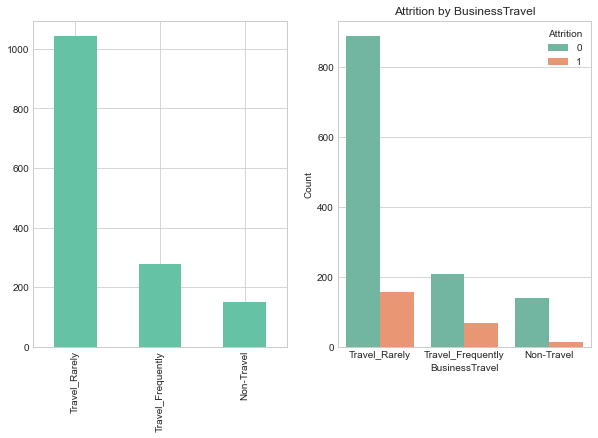

In [18]:
categorical_column_viz('BusinessTravel')

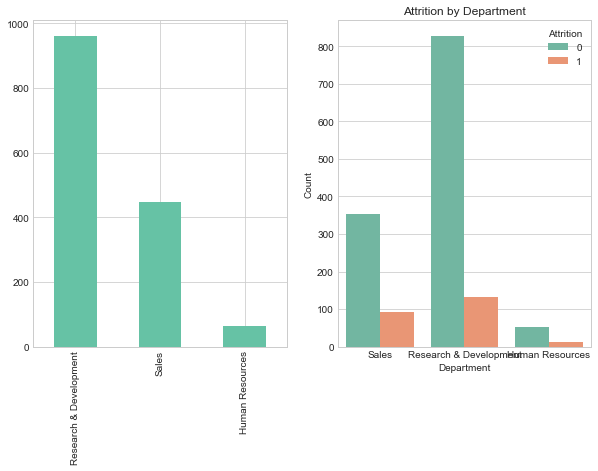

In [19]:
categorical_column_viz('Department')

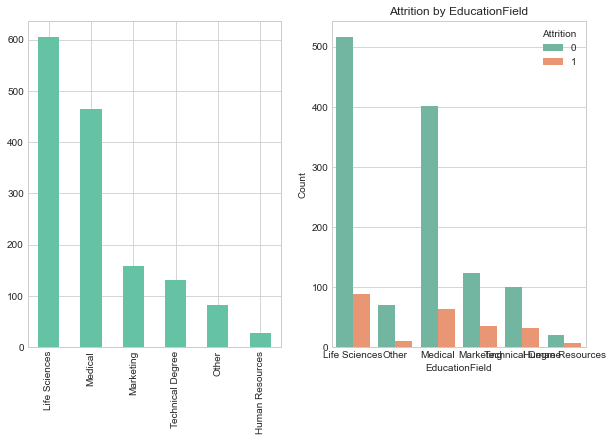

In [20]:
categorical_column_viz('EducationField')

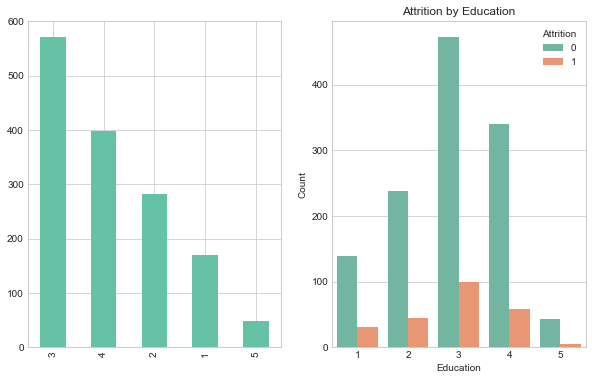

In [21]:
categorical_column_viz('Education')


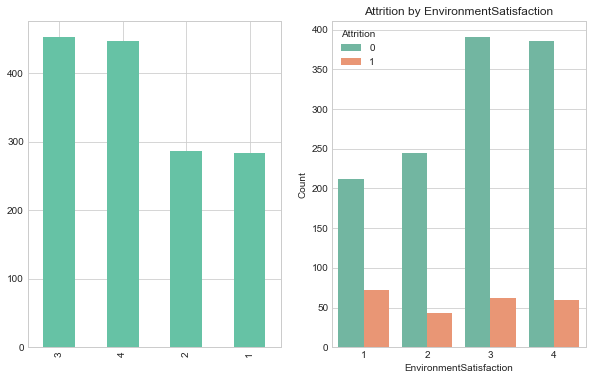

In [22]:
categorical_column_viz('EnvironmentSatisfaction')


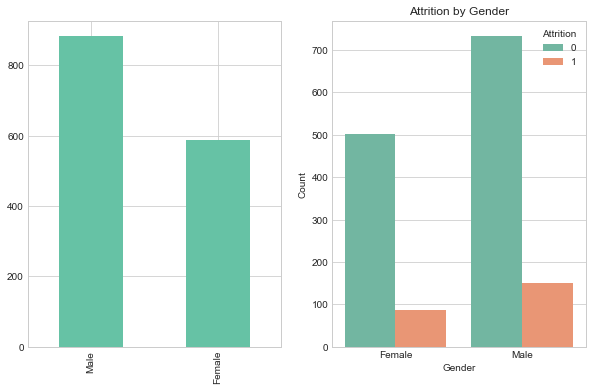

In [23]:
categorical_column_viz('Gender')

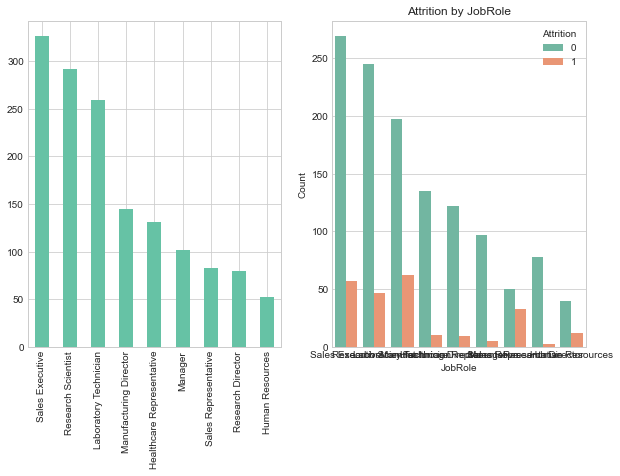

In [24]:
categorical_column_viz('JobRole')

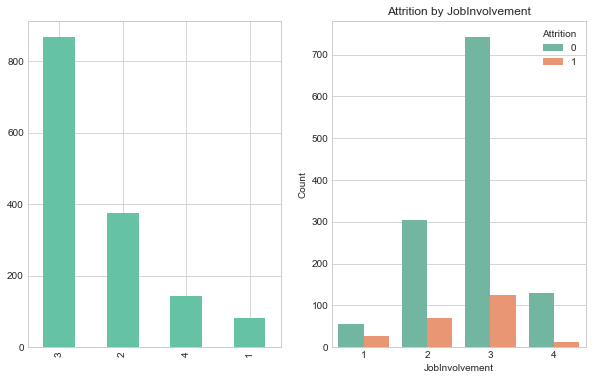

In [25]:
categorical_column_viz('JobInvolvement')

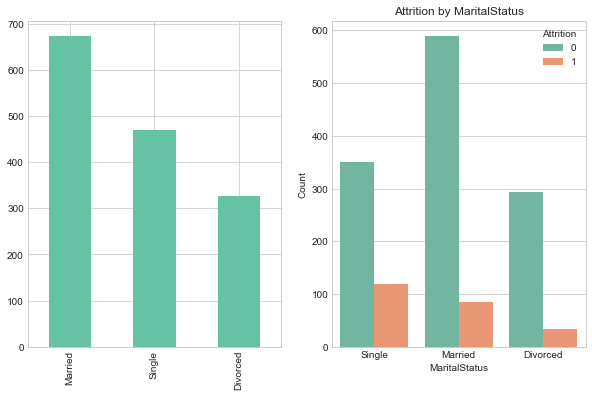

In [26]:
categorical_column_viz('MaritalStatus')

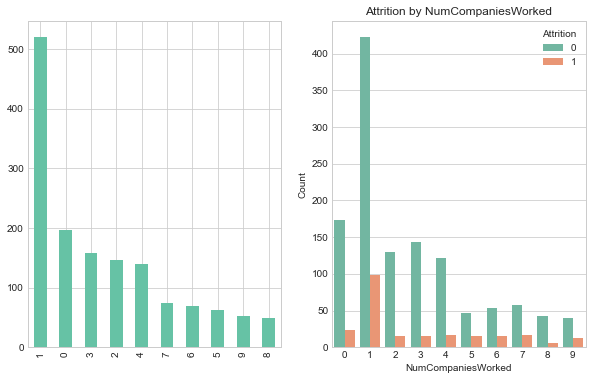

In [27]:
categorical_column_viz('NumCompaniesWorked')

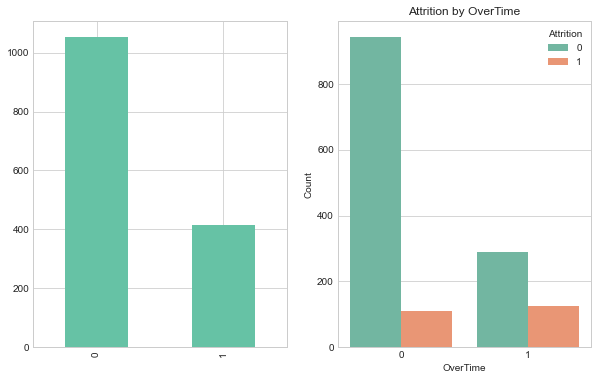

In [28]:
categorical_column_viz('OverTime')


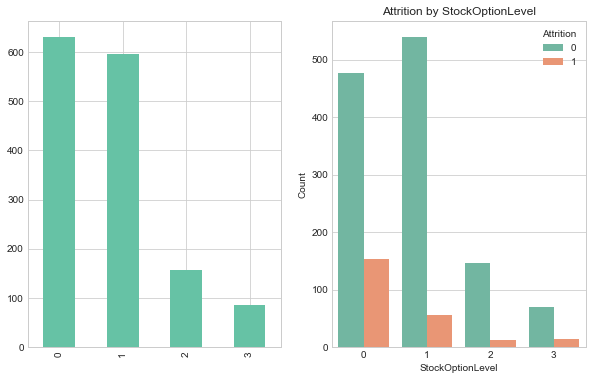

In [29]:
categorical_column_viz('StockOptionLevel')

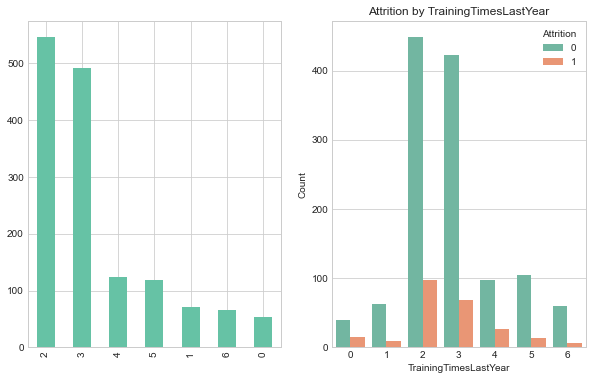

In [30]:
categorical_column_viz('TrainingTimesLastYear')

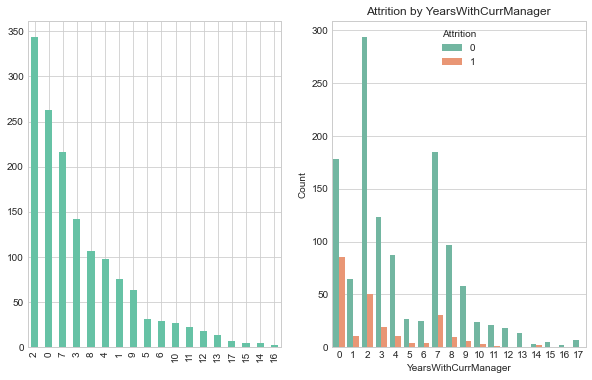

In [31]:
categorical_column_viz('YearsWithCurrManager')

### Visualization of Numerical Features

In [32]:
def numerical_column_viz(col_name):
    f,ax = plt.subplots(1,2, figsize=(18,6))
    sns.kdeplot(attrition[col_name], label='Employee who left',ax=ax[0], shade=True, color='palegreen')
    sns.kdeplot(no_attrition[col_name], label='Employee who stayed', ax=ax[0], shade=True, color='salmon')
    
    sns.boxplot(y=col_name, x='Attrition',data=df, palette='Set3', ax=ax[1])


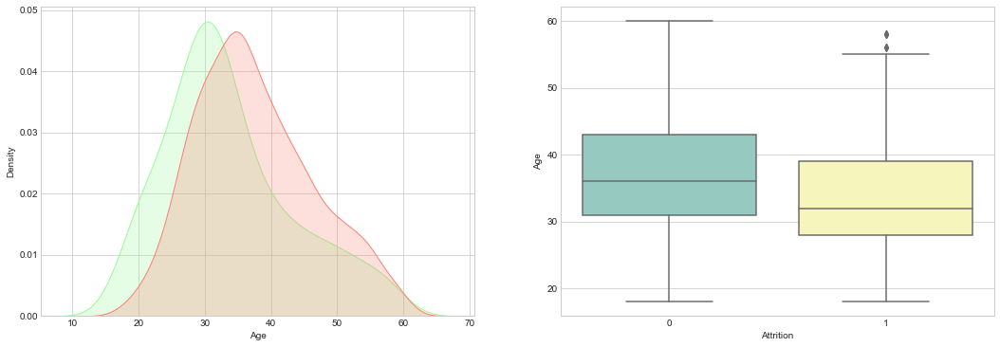

In [33]:
numerical_column_viz("Age")

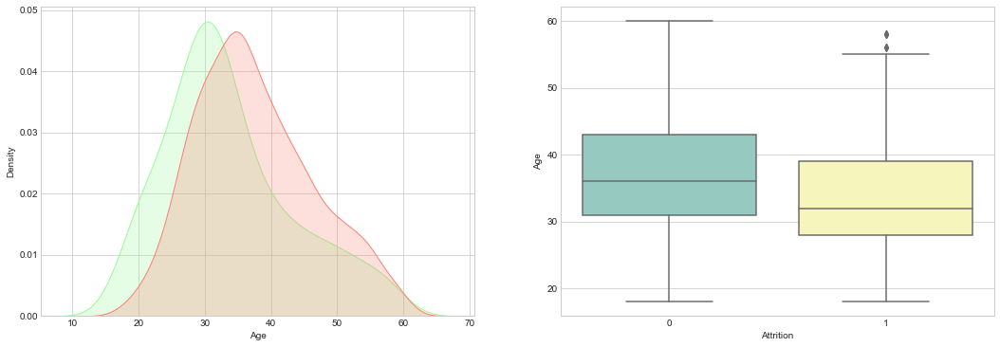

In [34]:
numerical_column_viz("Age")

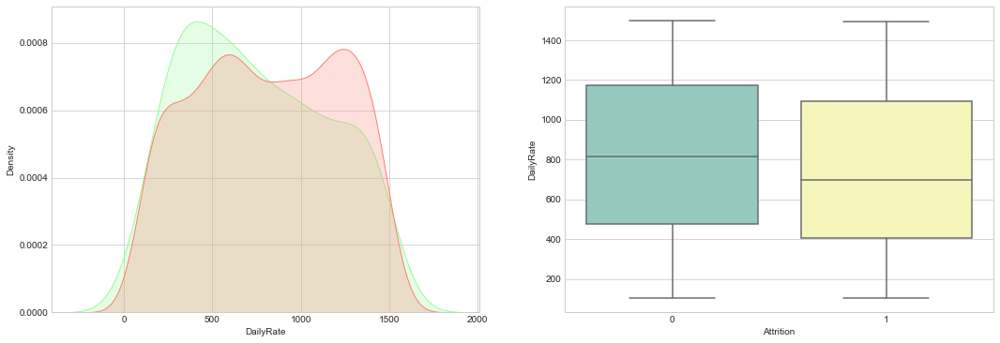

In [35]:
numerical_column_viz("DailyRate")

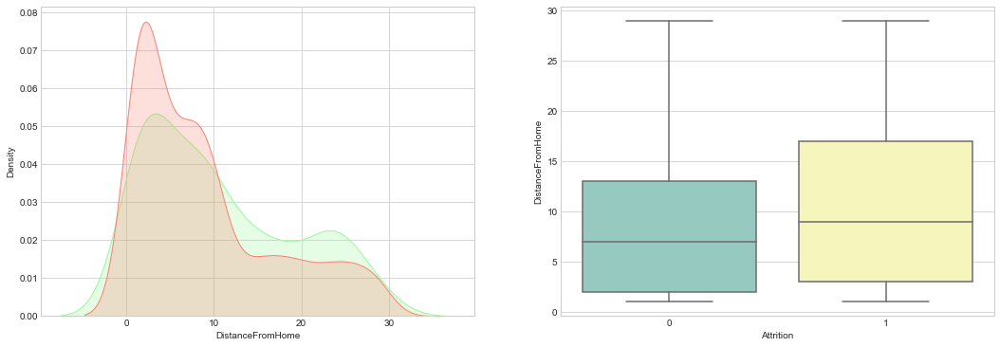

In [36]:
numerical_column_viz("DistanceFromHome")

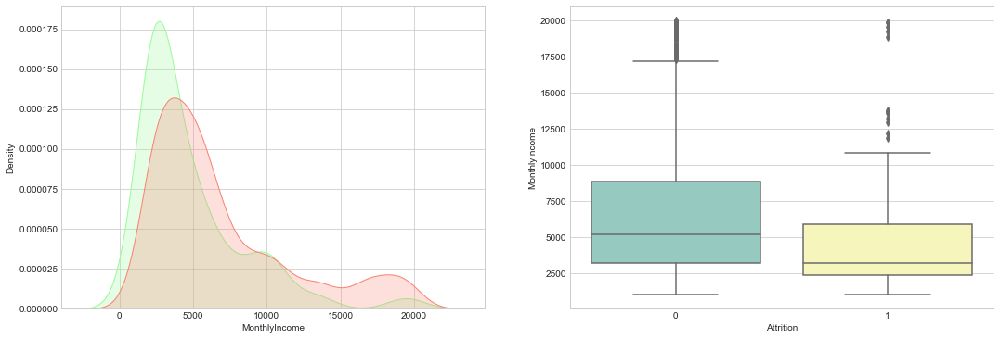

In [37]:
numerical_column_viz("MonthlyIncome")

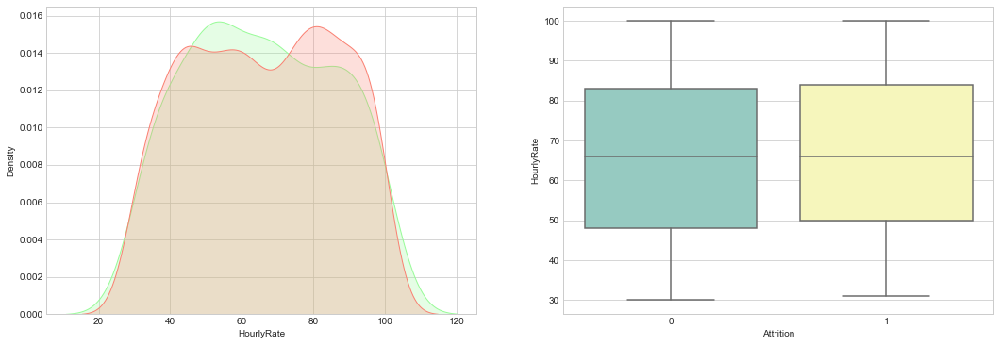

In [38]:
numerical_column_viz("HourlyRate")

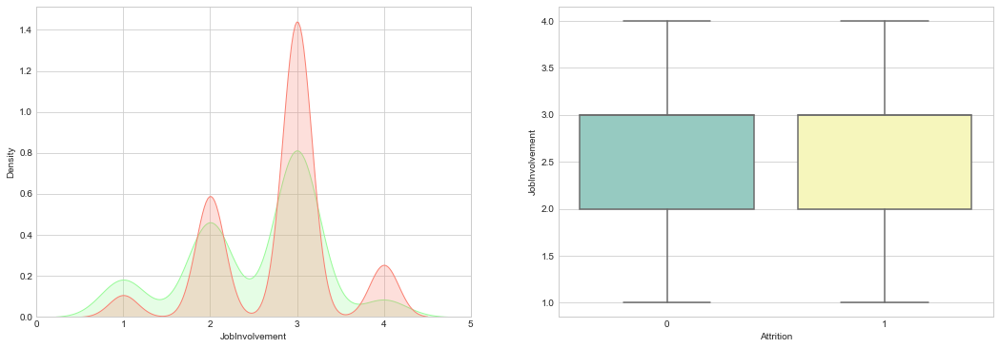

In [39]:
numerical_column_viz("JobInvolvement")

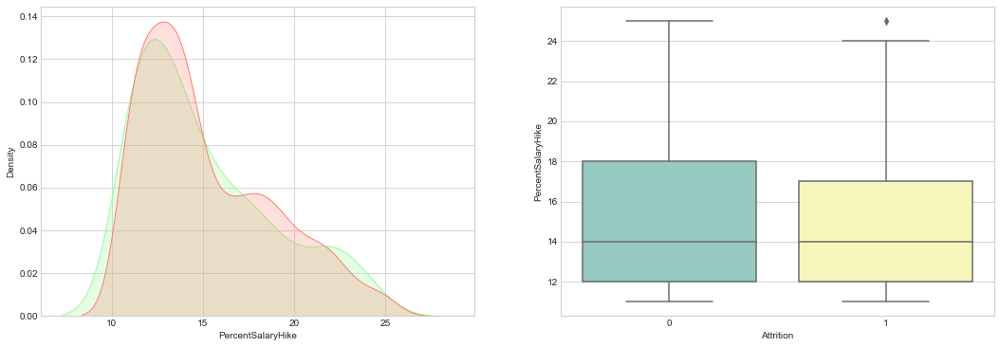

In [40]:
numerical_column_viz("PercentSalaryHike")

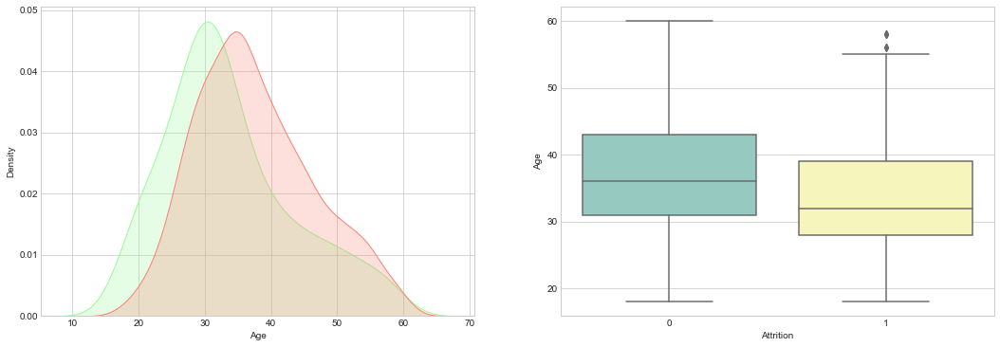

In [41]:
numerical_column_viz("Age")

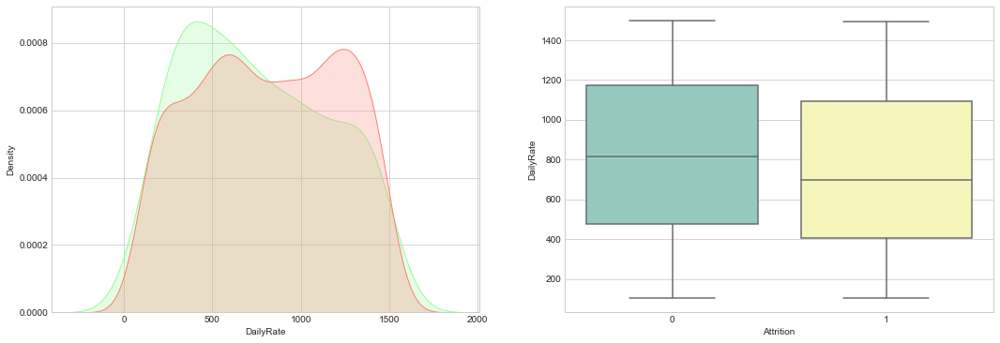

In [42]:
numerical_column_viz("DailyRate")

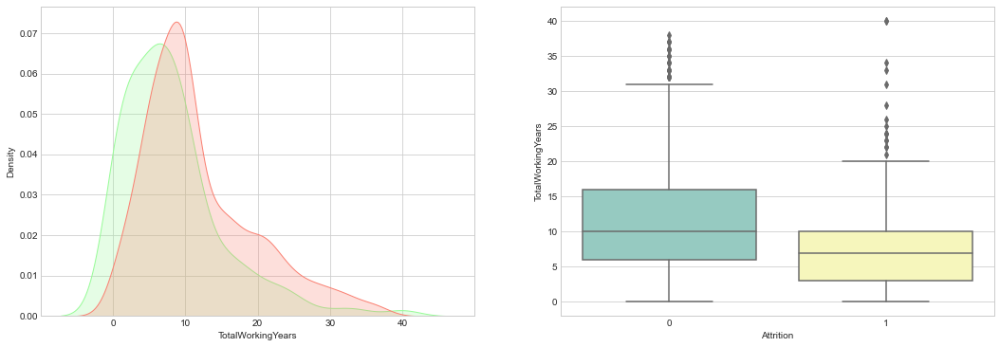

In [43]:
numerical_column_viz("TotalWorkingYears")

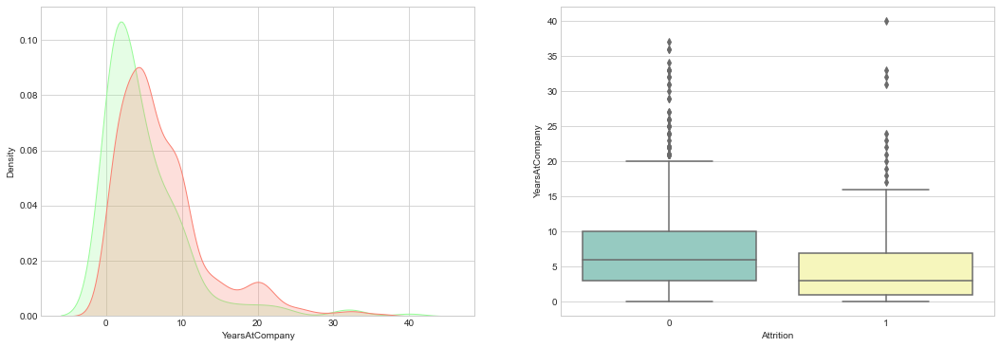

In [44]:
numerical_column_viz("YearsAtCompany")

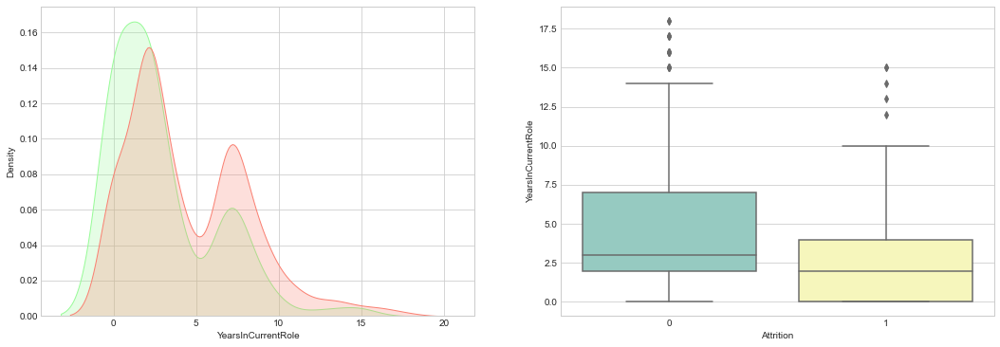

In [45]:
numerical_column_viz("YearsInCurrentRole")

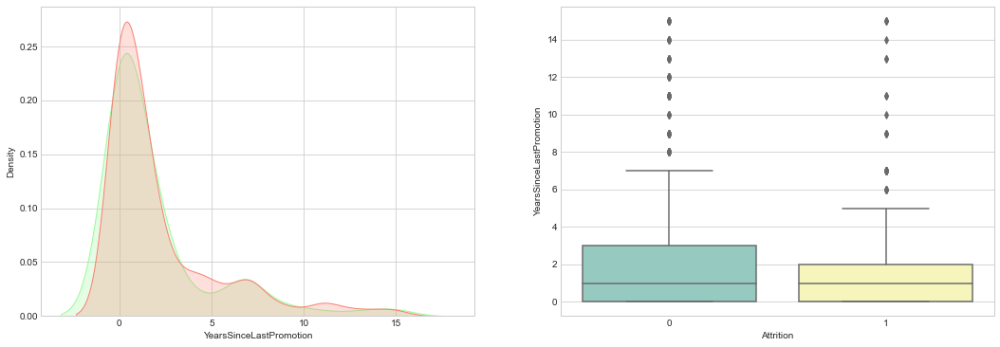

In [46]:
numerical_column_viz("YearsSinceLastPromotion")

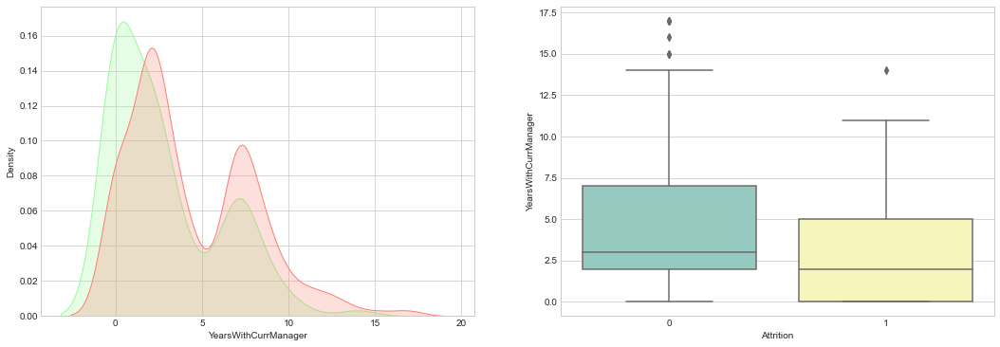

In [47]:
numerical_column_viz("YearsWithCurrManager")

### Visualization of Categorical vs Numericals Features

In [48]:
def categorical_numerical(numerical_col, categorical_col1, categorical_col2):
    

    f,ax = plt.subplots(1,2, figsize=(20,8))
    
    g1= sns.swarmplot( categorical_col1, numerical_col,hue='Attrition', data=df, dodge=True, ax=ax[0], palette='Set2')
    ax[0].set_title(f'{numerical_col} vs {categorical_col1} separeted by Attrition')
    g1.set_xticklabels(g1.get_xticklabels(), rotation=90) 

    
    g2 = sns.swarmplot( categorical_col2, numerical_col,hue='Attrition', data=df, dodge=True, ax=ax[1], palette='Set2')
    ax[1].set_title(f'{numerical_col} vs {categorical_col1} separeted by Attrition')
    g2.set_xticklabels(g2.get_xticklabels(), rotation=90) 

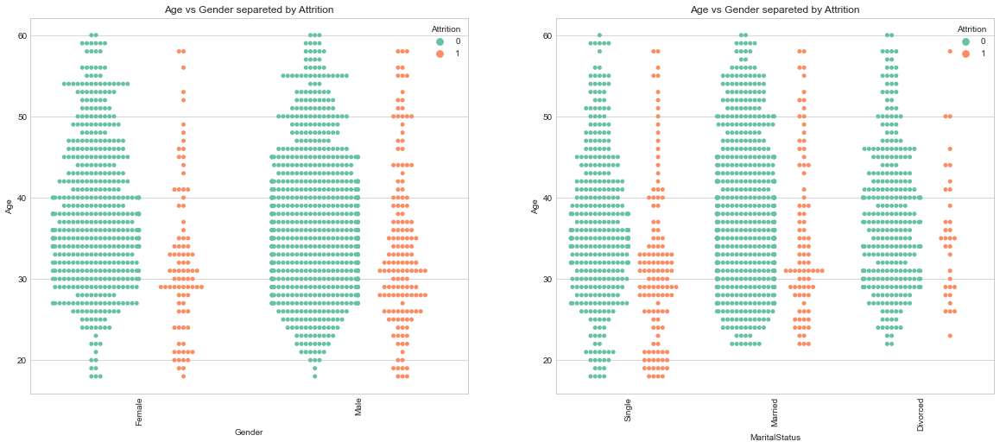

In [49]:
categorical_numerical('Age','Gender','MaritalStatus')

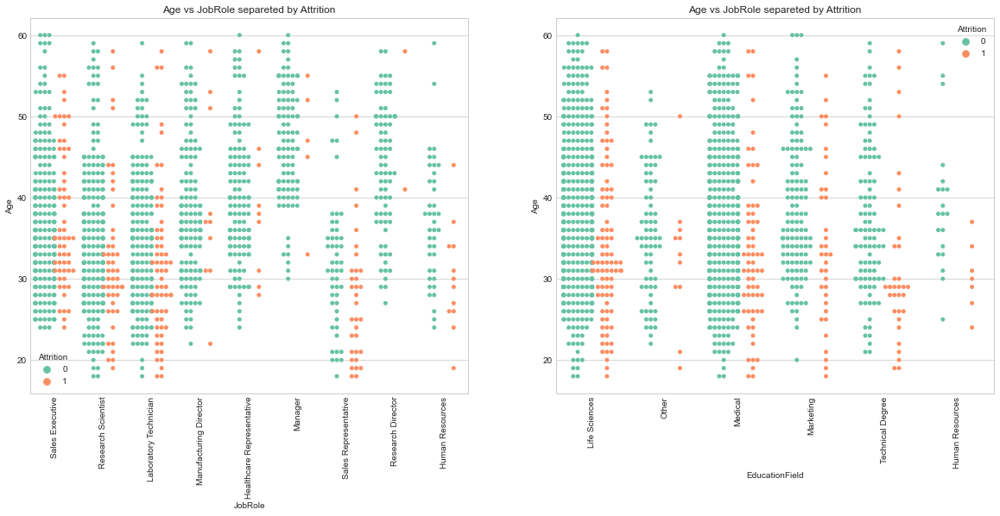

In [50]:
categorical_numerical('Age','JobRole','EducationField')

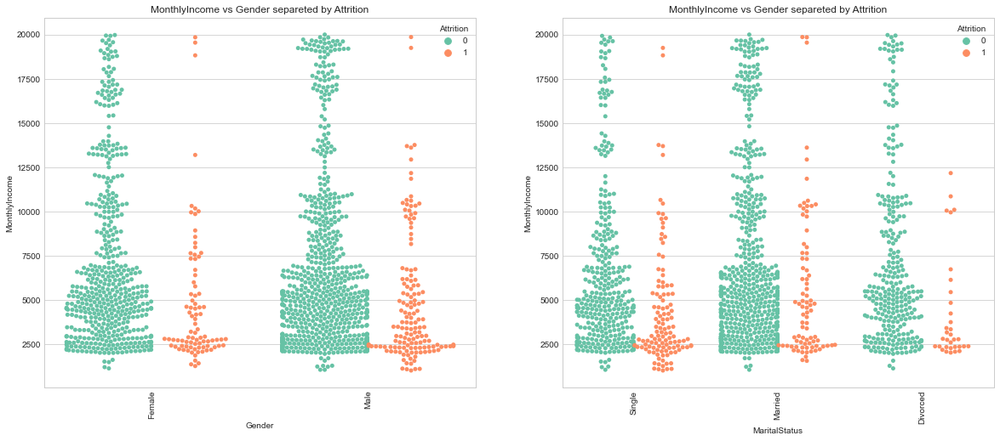

In [51]:
categorical_numerical('MonthlyIncome','Gender','MaritalStatus')

### Feature Engineering

In [52]:
# 'EnviornmentSatisfaction', 'JobInvolvement', 'JobSatisfacction', 'RelationshipSatisfaction', 'WorklifeBalance' can be clubbed into a single feature 'TotalSatisfaction'

df['Total_Satisfaction'] = (df['EnvironmentSatisfaction'] + 
                            df['JobInvolvement'] + 
                            df['JobSatisfaction'] + 
                            df['RelationshipSatisfaction'] +
                            df['WorkLifeBalance']) /5 

# Drop Columns
df.drop(['EnvironmentSatisfaction','JobInvolvement','JobSatisfaction','RelationshipSatisfaction','WorkLifeBalance'], axis=1, inplace=True)


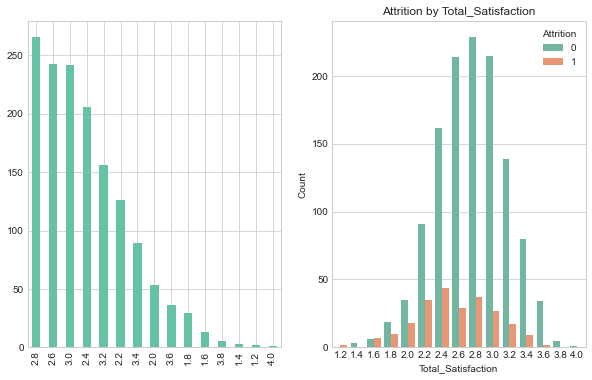

In [53]:
categorical_column_viz('Total_Satisfaction')

In [54]:
df.Total_Satisfaction.describe()

count    1470.000000
mean        2.730748
std         0.428551
min         1.200000
25%         2.400000
50%         2.800000
75%         3.000000
max         4.000000
Name: Total_Satisfaction, dtype: float64

In [55]:
# Convert Total satisfaction into boolean
# median = 2.8
# x = 1 if x >= 2.8

df['Total_Satisfaction_bool'] = df['Total_Satisfaction'].apply(lambda x:1 if x>=2.8 else 0 ) 
df.drop('Total_Satisfaction', axis=1, inplace=True)

In [56]:
# It can be observed that the rate of attrition of employees below age of 35 is high

df['Age_bool'] = df['Age'].apply(lambda x:1 if x<35 else 0)
df.drop('Age', axis=1, inplace=True)

In [57]:
# It can be observed that the employees are more likey the drop the job if dailtRate less than 800

df['DailyRate_bool'] = df['DailyRate'].apply(lambda x:1 if x<800 else 0)
df.drop('DailyRate', axis=1, inplace=True)


In [58]:
# Employees working at R&D Department have higher attrition rate

df['Department_bool'] = df['Department'].apply(lambda x:1 if x=='Research & Development' else 0)
df.drop('Department', axis=1, inplace=True)


In [59]:
# Rate of attrition of employees is high if DistanceFromHome > 10

df['DistanceFromHome_bool'] = df['DistanceFromHome'].apply(lambda x:1 if x>10 else 0)
df.drop('DistanceFromHome', axis=1, inplace=True)

In [60]:
# Employees are more likey to drop the job if the employee is working as Laboratory Technician

df['JobRole_bool'] = df['JobRole'].apply(lambda x:1 if x=='Laboratory Technician' else 0)
df.drop('JobRole', axis=1, inplace=True)


In [61]:
# Employees are more likey to the drop the job if the employee's hourly rate < 65

df['HourlyRate_bool'] = df['HourlyRate'].apply(lambda x:1 if x<65 else 0)
df.drop('HourlyRate', axis=1, inplace=True)


In [62]:
# Employees are more likey to the drop the job if the employee's MonthlyIncome < 4000

df['MonthlyIncome_bool'] = df['MonthlyIncome'].apply(lambda x:1 if x<4000 else 0)
df.drop('MonthlyIncome', axis=1, inplace=True)


In [63]:
# Rate of attrition of employees is high if NumCompaniesWorked < 3

df['NumCompaniesWorked_bool'] = df['NumCompaniesWorked'].apply(lambda x:1 if x>3 else 0)
df.drop('NumCompaniesWorked', axis=1, inplace=True)


In [64]:
# Employees are more likey to the drop the job if the employee's TotalWorkingYears < 8

df['TotalWorkingYears_bool'] = df['TotalWorkingYears'].apply(lambda x:1 if x<8 else 0)
df.drop('TotalWorkingYears', axis=1, inplace=True)

In [65]:
# Employees are more likey to the drop the job if the employee's YearsAtCompany < 3

df['YearsAtCompany_bool'] = df['YearsAtCompany'].apply(lambda x:1 if x<3 else 0)
df.drop('YearsAtCompany', axis=1, inplace=True)


In [66]:
# Employees are more likey to the drop the job if the employee's YearsInCurrentRole < 3

df['YearsInCurrentRole_bool'] = df['YearsInCurrentRole'].apply(lambda x:1 if x<3 else 0)
df.drop('YearsInCurrentRole', axis=1, inplace=True)


In [67]:
# Employees are more likey to the drop the job if the employee's YearsSinceLastPromotion < 1

df['YearsSinceLastPromotion_bool'] = df['YearsSinceLastPromotion'].apply(lambda x:1 if x<1 else 0)
df.drop('YearsSinceLastPromotion', axis=1, inplace=True)


In [68]:
# Employees are more likey to the drop the job if the employee's YearsWithCurrManager < 1

df['YearsWithCurrManager_bool'] = df['YearsWithCurrManager'].apply(lambda x:1 if x<1 else 0)
df.drop('YearsWithCurrManager', axis=1, inplace=True)

In [69]:
df['Gender'] = df['Gender'].apply(lambda x:1 if x=='Female' else 0)


In [70]:
df.drop('MonthlyRate', axis=1, inplace=True)
df.drop('PercentSalaryHike', axis=1, inplace=True)


In [71]:
convert_category = ['BusinessTravel','Education','EducationField','MaritalStatus','StockOptionLevel','OverTime','Gender','TrainingTimesLastYear']
for col in convert_category:
        df[col] = df[col].astype('category')


In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   Attrition                     1470 non-null   int64   
 1   BusinessTravel                1470 non-null   category
 2   Education                     1470 non-null   category
 3   EducationField                1470 non-null   category
 4   Gender                        1470 non-null   category
 5   JobLevel                      1470 non-null   int64   
 6   MaritalStatus                 1470 non-null   category
 7   OverTime                      1470 non-null   category
 8   PerformanceRating             1470 non-null   int64   
 9   StockOptionLevel              1470 non-null   category
 10  TrainingTimesLastYear         1470 non-null   category
 11  Total_Satisfaction_bool       1470 non-null   int64   
 12  Age_bool                      1470 non-null   in

In [73]:
#separate the categorical and numerical data
X_categorical = df.select_dtypes(include=['category'])
X_numerical = df.select_dtypes(include=['int64'])
X_numerical.drop('Attrition', axis=1, inplace=True)


In [74]:
y = df['Attrition']

In [75]:
# One HOt Encoding Categorical Features

onehotencoder = OneHotEncoder()

X_categorical = onehotencoder.fit_transform(X_categorical).toarray()
X_categorical = pd.DataFrame(X_categorical)
X_categorical

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1466,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1467,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1468,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [76]:
#concat the categorical and numerical values

X_all = pd.concat([X_categorical, X_numerical], axis=1)
X_all.head()

,0,1,2,3,4,5,6,7,8,9,...,DistanceFromHome_bool,JobRole_bool,HourlyRate_bool,MonthlyIncome_bool,NumCompaniesWorked_bool,TotalWorkingYears_bool,YearsAtCompany_bool,YearsInCurrentRole_bool,YearsSinceLastPromotion_bool,YearsWithCurrManager_bool
0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0,0,0,0,1,0,0,0,1,0
1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0,0,1,0,0,0,0,0,0,0
2,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0,1,0,1,1,1,1,1,1,1
3,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0,0,1,1,0,0,0,0,0,1
4,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,1,1,1,1,1,1,1,0,0


In [77]:
X_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 48 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   0                             1470 non-null   float64
 1   1                             1470 non-null   float64
 2   2                             1470 non-null   float64
 3   3                             1470 non-null   float64
 4   4                             1470 non-null   float64
 5   5                             1470 non-null   float64
 6   6                             1470 non-null   float64
 7   7                             1470 non-null   float64
 8   8                             1470 non-null   float64
 9   9                             1470 non-null   float64
 10  10                            1470 non-null   float64
 11  11                            1470 non-null   float64
 12  12                            1470 non-null   float64
 13  13 

### Split Data

In [78]:
X_train,X_test, y_train, y_test = train_test_split(X_all,y, test_size=0.30)


In [79]:
print(f"Train data shape: {X_train.shape}, Test Data Shape {X_test.shape}")

Train data shape: (1029, 48), Test Data Shape (441, 48)


In [80]:
X_train.head()

,0,1,2,3,4,5,6,7,8,9,...,DistanceFromHome_bool,JobRole_bool,HourlyRate_bool,MonthlyIncome_bool,NumCompaniesWorked_bool,TotalWorkingYears_bool,YearsAtCompany_bool,YearsInCurrentRole_bool,YearsSinceLastPromotion_bool,YearsWithCurrManager_bool
1338,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0,0,0,1,0,1,1,1,1,1
364,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0,1,0,1,1,0,0,0,1,0
82,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0,0,0,0,0,0,1,1,0,1
606,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,1,0,0,1,0,1,0,1,0,0
572,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1,0,0,0,1,0,0,0,0,0


### Train Data

In [81]:
# Function that runs the requested algorithm and returns the accuracy metrics
def fit_ml_algo(algo, X_train,y_train, cv):
    
    # One Pass
    model = algo.fit(X_train, y_train)
    acc = round(model.score(X_train, y_train) * 100, 2)
    
    # Cross Validation 
    train_pred = model_selection.cross_val_predict(algo,X_train,y_train,cv=cv,n_jobs = -1)
    
    # Cross-validation accuracy metric
    acc_cv = round(metrics.accuracy_score(y_train, train_pred) * 100, 2)
    
    return train_pred, acc, acc_cv

### Logistic Regression 

In [82]:
# Logistic Regression
start_time = time.time()
train_pred_log, acc_log, acc_cv_log = fit_ml_algo(LogisticRegression(), X_train,y_train, 10)
log_time = (time.time() - start_time)
print("Accuracy: %s" % acc_log)
print("Accuracy CV 10-Fold: %s" % acc_cv_log)
print("Running Time: %s" % datetime.timedelta(seconds=log_time))

Accuracy: 90.57
Accuracy CV 10-Fold: 89.02
Running Time: 0:01:05.697904


### Support Vector Machine

In [83]:
start_time = time.time()
train_pred_svc, acc_svc, acc_cv_svc = fit_ml_algo(SVC(),X_train,y_train,10)
svc_time = (time.time() - start_time)
print("Accuracy: %s" % acc_svc)
print("Accuracy CV 10-Fold: %s" % acc_cv_svc)
print("Running Time: %s" % datetime.timedelta(seconds=svc_time))

Accuracy: 88.14
Accuracy CV 10-Fold: 86.49
Running Time: 0:00:00.614263


### Linear Support Vector Machines

In [84]:

# Linear SVC
start_time = time.time()
train_pred_svc, acc_linear_svc, acc_cv_linear_svc = fit_ml_algo(LinearSVC(),X_train, y_train,10)
linear_svc_time = (time.time() - start_time)
print("Accuracy: %s" % acc_linear_svc)
print("Accuracy CV 10-Fold: %s" % acc_cv_linear_svc)
print("Running Time: %s" % datetime.timedelta(seconds=linear_svc_time))

Accuracy: 90.28
Accuracy CV 10-Fold: 88.73
Running Time: 0:00:00.761390


### K Nearest Neighbour


In [85]:
# K Nearest Neighbour
start_time = time.time()
train_pred_knn, acc_knn, acc_cv_knn = fit_ml_algo(KNeighborsClassifier(n_neighbors = 3),X_train,y_train,10)
knn_time = (time.time() - start_time)
print("Accuracy: %s" % acc_knn)
print("Accuracy CV 10-Fold: %s" % acc_cv_knn)
print("Running Time: %s" % datetime.timedelta(seconds=knn_time))

Accuracy: 90.57
Accuracy CV 10-Fold: 84.65
Running Time: 0:00:05.246241


### Gaussian Naive Bayes


In [86]:
# Gaussian Naive Bayes
start_time = time.time()
train_pred_gaussian, acc_gaussian, acc_cv_gaussian = fit_ml_algo(GaussianNB(),X_train,y_train,10)
gaussian_time = (time.time() - start_time)
print("Accuracy: %s" % acc_gaussian)
print("Accuracy CV 10-Fold: %s" % acc_cv_gaussian)
print("Running Time: %s" % datetime.timedelta(seconds=gaussian_time))

Accuracy: 80.76
Accuracy CV 10-Fold: 77.45
Running Time: 0:00:00.116379


### Perceptron


In [87]:
# Perceptron
start_time = time.time()
train_pred_gaussian, acc_perceptron, acc_cv_perceptron = fit_ml_algo(Perceptron(),X_train,y_train,10)
perceptron_time = (time.time() - start_time)
print("Accuracy: %s" % acc_perceptron)
print("Accuracy CV 10-Fold: %s" % acc_cv_perceptron)
print("Running Time: %s" % datetime.timedelta(seconds=perceptron_time))

Accuracy: 73.96
Accuracy CV 10-Fold: 82.99
Running Time: 0:00:00.353684


### Stochastic Gradient Descent


In [88]:
# Stochastic Gradient Descent
start_time = time.time()
train_pred_sgd, acc_sgd, acc_cv_sgd = fit_ml_algo(SGDClassifier(),X_train, y_train,10)
sgd_time = (time.time() - start_time)
print("Accuracy: %s" % acc_sgd)
print("Accuracy CV 10-Fold: %s" % acc_cv_sgd)
print("Running Time: %s" % datetime.timedelta(seconds=sgd_time))

Accuracy: 84.74
Accuracy CV 10-Fold: 84.16
Running Time: 0:00:00.131958


### Decision Tree


In [89]:
# Decision Tree
start_time = time.time()
train_pred_dt, acc_dt, acc_cv_dt = fit_ml_algo(DecisionTreeClassifier(),X_train, y_train,10)
dt_time = (time.time() - start_time)
print("Accuracy: %s" % acc_dt)
print("Accuracy CV 10-Fold: %s" % acc_cv_dt)
print("Running Time: %s" % datetime.timedelta(seconds=dt_time))

Accuracy: 100.0
Accuracy CV 10-Fold: 79.88
Running Time: 0:00:00.533265


### Gradient Boosting Trees


In [90]:
# Gradient Boosting Trees
start_time = time.time()
train_pred_gbt, acc_gbt, acc_cv_gbt = fit_ml_algo(GradientBoostingClassifier(),X_train, y_train,10)
gbt_time = (time.time() - start_time)
print("Accuracy: %s" % acc_gbt)
print("Accuracy CV 10-Fold: %s" % acc_cv_gbt)
print("Running Time: %s" % datetime.timedelta(seconds=gbt_time))

Accuracy: 93.2
Accuracy CV 10-Fold: 86.98
Running Time: 0:00:02.889331


### Random Forest


In [91]:
# Random Forest
start_time = time.time()
train_pred_dt, acc_rf, acc_cv_rf = fit_ml_algo(RandomForestClassifier(n_estimators=100),X_train, y_train,10)
rf_time = (time.time() - start_time)
print("Accuracy: %s" % acc_rf)
print("Accuracy CV 10-Fold: %s" % acc_cv_rf)
print("Running Time: %s" % datetime.timedelta(seconds=rf_time))

Accuracy: 100.0
Accuracy CV 10-Fold: 86.1
Running Time: 0:00:01.630994


### CatBoost Classifier


In [92]:
# Define the categorical features for the CatBoost model
cat_features = np.where(X_train.dtypes != np.float)[0]
cat_features

array([32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47],
      dtype=int64)

In [93]:
# pool training data and categorical feature labels together
train_pool = Pool(X_train, y_train,cat_features)  


In [94]:
# CatBoost
catboost_model = CatBoostClassifier(iterations=1000,custom_loss=['Accuracy'],loss_function='Logloss')

# Fit CatBoost model
catboost_model.fit(train_pool,plot=True)

# CatBoost accuracy
acc_catboost = round(catboost_model.score(X_train, y_train) * 100, 2)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.010429
0:	learn: 0.6832195	total: 502ms	remaining: 8m 21s
1:	learn: 0.6738959	total: 551ms	remaining: 4m 34s
2:	learn: 0.6656192	total: 593ms	remaining: 3m 17s
3:	learn: 0.6577659	total: 621ms	remaining: 2m 34s
4:	learn: 0.6505654	total: 638ms	remaining: 2m 7s
5:	learn: 0.6437082	total: 655ms	remaining: 1m 48s
6:	learn: 0.6363639	total: 685ms	remaining: 1m 37s
7:	learn: 0.6284177	total: 715ms	remaining: 1m 28s
8:	learn: 0.6208010	total: 744ms	remaining: 1m 21s
9:	learn: 0.6149465	total: 764ms	remaining: 1m 15s
10:	learn: 0.6071261	total: 784ms	remaining: 1m 10s
11:	learn: 0.6019223	total: 794ms	remaining: 1m 5s
12:	learn: 0.5967295	total: 813ms	remaining: 1m 1s
13:	learn: 0.5907926	total: 833ms	remaining: 58.7s
14:	learn: 0.5834385	total: 855ms	remaining: 56.1s
15:	learn: 0.5778756	total: 877ms	remaining: 53.9s
16:	learn: 0.5722607	total: 895ms	remaining: 51.8s
17:	learn: 0.5675943	total: 908ms	remaining: 49.5s
18:	learn: 0.5625191	total: 920ms	remaining: 47.5s
1

171:	learn: 0.2950954	total: 3.63s	remaining: 17.5s
172:	learn: 0.2946179	total: 3.65s	remaining: 17.5s
173:	learn: 0.2943319	total: 3.67s	remaining: 17.4s
174:	learn: 0.2939049	total: 3.69s	remaining: 17.4s
175:	learn: 0.2930390	total: 3.71s	remaining: 17.4s
176:	learn: 0.2924810	total: 3.72s	remaining: 17.3s
177:	learn: 0.2919985	total: 3.74s	remaining: 17.3s
178:	learn: 0.2913274	total: 3.76s	remaining: 17.3s
179:	learn: 0.2906577	total: 3.78s	remaining: 17.2s
180:	learn: 0.2901947	total: 3.8s	remaining: 17.2s
181:	learn: 0.2897694	total: 3.81s	remaining: 17.1s
182:	learn: 0.2893079	total: 3.83s	remaining: 17.1s
183:	learn: 0.2888200	total: 3.85s	remaining: 17.1s
184:	learn: 0.2882683	total: 3.87s	remaining: 17s
185:	learn: 0.2875878	total: 3.89s	remaining: 17s
186:	learn: 0.2868468	total: 3.9s	remaining: 17s
187:	learn: 0.2864221	total: 3.92s	remaining: 16.9s
188:	learn: 0.2859655	total: 3.94s	remaining: 16.9s
189:	learn: 0.2858272	total: 3.97s	remaining: 16.9s
190:	learn: 0.285004

330:	learn: 0.2342088	total: 6.67s	remaining: 13.5s
331:	learn: 0.2338603	total: 6.69s	remaining: 13.5s
332:	learn: 0.2336400	total: 6.71s	remaining: 13.4s
333:	learn: 0.2333248	total: 6.72s	remaining: 13.4s
334:	learn: 0.2331336	total: 6.74s	remaining: 13.4s
335:	learn: 0.2328272	total: 6.76s	remaining: 13.4s
336:	learn: 0.2324838	total: 6.78s	remaining: 13.3s
337:	learn: 0.2321457	total: 6.79s	remaining: 13.3s
338:	learn: 0.2317252	total: 6.81s	remaining: 13.3s
339:	learn: 0.2313888	total: 6.83s	remaining: 13.3s
340:	learn: 0.2311534	total: 6.85s	remaining: 13.2s
341:	learn: 0.2309852	total: 6.87s	remaining: 13.2s
342:	learn: 0.2307984	total: 6.89s	remaining: 13.2s
343:	learn: 0.2303276	total: 6.91s	remaining: 13.2s
344:	learn: 0.2300512	total: 6.92s	remaining: 13.1s
345:	learn: 0.2297338	total: 6.94s	remaining: 13.1s
346:	learn: 0.2293798	total: 6.96s	remaining: 13.1s
347:	learn: 0.2291064	total: 6.98s	remaining: 13.1s
348:	learn: 0.2289317	total: 6.99s	remaining: 13s
349:	learn: 0.

496:	learn: 0.1940167	total: 9.78s	remaining: 9.9s
497:	learn: 0.1938755	total: 9.8s	remaining: 9.88s
498:	learn: 0.1936345	total: 9.82s	remaining: 9.86s
499:	learn: 0.1934226	total: 9.84s	remaining: 9.84s
500:	learn: 0.1931626	total: 9.85s	remaining: 9.81s
501:	learn: 0.1928595	total: 9.87s	remaining: 9.79s
502:	learn: 0.1926939	total: 9.89s	remaining: 9.77s
503:	learn: 0.1925022	total: 9.91s	remaining: 9.75s
504:	learn: 0.1923326	total: 9.92s	remaining: 9.73s
505:	learn: 0.1921374	total: 9.94s	remaining: 9.71s
506:	learn: 0.1920200	total: 9.96s	remaining: 9.68s
507:	learn: 0.1917755	total: 9.98s	remaining: 9.67s
508:	learn: 0.1916283	total: 10s	remaining: 9.65s
509:	learn: 0.1913034	total: 10s	remaining: 9.63s
510:	learn: 0.1910444	total: 10s	remaining: 9.6s
511:	learn: 0.1909610	total: 10.1s	remaining: 9.58s
512:	learn: 0.1908633	total: 10.1s	remaining: 9.56s
513:	learn: 0.1905816	total: 10.1s	remaining: 9.54s
514:	learn: 0.1904953	total: 10.1s	remaining: 9.52s
515:	learn: 0.1903528

664:	learn: 0.1620916	total: 12.9s	remaining: 6.49s
665:	learn: 0.1619146	total: 12.9s	remaining: 6.48s
666:	learn: 0.1618202	total: 12.9s	remaining: 6.46s
667:	learn: 0.1617001	total: 13s	remaining: 6.44s
668:	learn: 0.1615750	total: 13s	remaining: 6.42s
669:	learn: 0.1613723	total: 13s	remaining: 6.4s
670:	learn: 0.1612221	total: 13s	remaining: 6.38s
671:	learn: 0.1609075	total: 13s	remaining: 6.36s
672:	learn: 0.1606128	total: 13.1s	remaining: 6.34s
673:	learn: 0.1601821	total: 13.1s	remaining: 6.32s
674:	learn: 0.1601027	total: 13.1s	remaining: 6.3s
675:	learn: 0.1599012	total: 13.1s	remaining: 6.28s
676:	learn: 0.1598081	total: 13.1s	remaining: 6.26s
677:	learn: 0.1596486	total: 13.1s	remaining: 6.24s
678:	learn: 0.1595297	total: 13.2s	remaining: 6.22s
679:	learn: 0.1594488	total: 13.2s	remaining: 6.2s
680:	learn: 0.1592378	total: 13.2s	remaining: 6.18s
681:	learn: 0.1592039	total: 13.2s	remaining: 6.16s
682:	learn: 0.1590658	total: 13.2s	remaining: 6.14s
683:	learn: 0.1589833	tot

828:	learn: 0.1340683	total: 16.5s	remaining: 3.4s
829:	learn: 0.1339284	total: 16.5s	remaining: 3.38s
830:	learn: 0.1338355	total: 16.5s	remaining: 3.36s
831:	learn: 0.1336670	total: 16.5s	remaining: 3.34s
832:	learn: 0.1334281	total: 16.6s	remaining: 3.32s
833:	learn: 0.1333389	total: 16.6s	remaining: 3.3s
834:	learn: 0.1332331	total: 16.6s	remaining: 3.28s
835:	learn: 0.1330954	total: 16.6s	remaining: 3.26s
836:	learn: 0.1328793	total: 16.6s	remaining: 3.24s
837:	learn: 0.1327303	total: 16.6s	remaining: 3.22s
838:	learn: 0.1325933	total: 16.7s	remaining: 3.2s
839:	learn: 0.1324827	total: 16.7s	remaining: 3.18s
840:	learn: 0.1322707	total: 16.7s	remaining: 3.16s
841:	learn: 0.1320887	total: 16.7s	remaining: 3.14s
842:	learn: 0.1319411	total: 16.7s	remaining: 3.12s
843:	learn: 0.1318444	total: 16.8s	remaining: 3.1s
844:	learn: 0.1316994	total: 16.8s	remaining: 3.08s
845:	learn: 0.1315624	total: 16.8s	remaining: 3.06s
846:	learn: 0.1314947	total: 16.8s	remaining: 3.04s
847:	learn: 0.13

992:	learn: 0.1110584	total: 19.5s	remaining: 138ms
993:	learn: 0.1109693	total: 19.6s	remaining: 119ms
994:	learn: 0.1108579	total: 19.7s	remaining: 98.9ms
995:	learn: 0.1108046	total: 19.7s	remaining: 79.1ms
996:	learn: 0.1106870	total: 19.7s	remaining: 59.3ms
997:	learn: 0.1105219	total: 19.7s	remaining: 39.6ms
998:	learn: 0.1104668	total: 19.8s	remaining: 19.8ms
999:	learn: 0.1103920	total: 19.8s	remaining: 0us


In [95]:
start_time = time.time()

# Set params for cross-validation as same as initial model
cv_params = catboost_model.get_params()

# cross-validation
cv_data = cv(train_pool,cv_params,fold_count=10,plot=True)
catboost_time = (time.time() - start_time)

# Cross-validation accuracy metric
acc_cv_catboost = round(np.max(cv_data['test-Accuracy-mean']) * 100, 2)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/10]
0:	learn: 0.6730089	test: 0.6725307	best: 0.6725307 (0)	total: 24.4ms	remaining: 24.4s
1:	learn: 0.6512517	test: 0.6500878	best: 0.6500878 (1)	total: 56.9ms	remaining: 28.4s
2:	learn: 0.6310572	test: 0.6287165	best: 0.6287165 (2)	total: 77ms	remaining: 25.6s
3:	learn: 0.6127559	test: 0.6094763	best: 0.6094763 (3)	total: 89.9ms	remaining: 22.4s
4:	learn: 0.5952485	test: 0.5901152	best: 0.5901152 (4)	total: 107ms	remaining: 21.3s
5:	learn: 0.5763908	test: 0.5684727	best: 0.5684727 (5)	total: 124ms	remaining: 20.5s
6:	learn: 0.5609776	test: 0.5531826	best: 0.5531826 (6)	total: 145ms	remaining: 20.6s
7:	learn: 0.5508904	test: 0.5432219	best: 0.5432219 (7)	total: 159ms	remaining: 19.7s
8:	learn: 0.5384147	test: 0.5304923	best: 0.5304923 (8)	total: 219ms	remaining: 24.1s
9:	learn: 0.5274900	test: 0.5190728	best: 0.5190728 (9)	total: 245ms	remaining: 24.2s
10:	learn: 0.5177274	test: 0.5099491	best: 0.5099491 (10)	total: 265ms	remaining: 23.8s
11:	learn: 0.5049175	test:

94:	learn: 0.2528102	test: 0.2811296	best: 0.2811296 (94)	total: 2.01s	remaining: 19.1s
95:	learn: 0.2515467	test: 0.2801848	best: 0.2801848 (95)	total: 2.03s	remaining: 19.2s
96:	learn: 0.2504872	test: 0.2801767	best: 0.2801767 (96)	total: 2.05s	remaining: 19.1s
97:	learn: 0.2492032	test: 0.2804058	best: 0.2801767 (96)	total: 2.07s	remaining: 19s
98:	learn: 0.2483086	test: 0.2800794	best: 0.2800794 (98)	total: 2.09s	remaining: 19s
99:	learn: 0.2471948	test: 0.2795391	best: 0.2795391 (99)	total: 2.11s	remaining: 19s
100:	learn: 0.2454066	test: 0.2791749	best: 0.2791749 (100)	total: 2.12s	remaining: 18.9s
101:	learn: 0.2445236	test: 0.2786329	best: 0.2786329 (101)	total: 2.14s	remaining: 18.9s
102:	learn: 0.2440114	test: 0.2777800	best: 0.2777800 (102)	total: 2.16s	remaining: 18.8s
103:	learn: 0.2432663	test: 0.2773070	best: 0.2773070 (103)	total: 2.18s	remaining: 18.8s
104:	learn: 0.2426847	test: 0.2765323	best: 0.2765323 (104)	total: 2.21s	remaining: 18.8s
105:	learn: 0.2418528	test: 

196:	learn: 0.1747782	test: 0.2606385	best: 0.2604586 (186)	total: 3.98s	remaining: 16.2s
197:	learn: 0.1744971	test: 0.2602302	best: 0.2602302 (197)	total: 4s	remaining: 16.2s
198:	learn: 0.1740301	test: 0.2593953	best: 0.2593953 (198)	total: 4.02s	remaining: 16.2s
199:	learn: 0.1740276	test: 0.2593918	best: 0.2593918 (199)	total: 4.03s	remaining: 16.1s
200:	learn: 0.1733110	test: 0.2588168	best: 0.2588168 (200)	total: 4.05s	remaining: 16.1s
201:	learn: 0.1724905	test: 0.2587282	best: 0.2587282 (201)	total: 4.06s	remaining: 16.1s
202:	learn: 0.1722903	test: 0.2583096	best: 0.2583096 (202)	total: 4.08s	remaining: 16s
203:	learn: 0.1719954	test: 0.2586219	best: 0.2583096 (202)	total: 4.1s	remaining: 16s
204:	learn: 0.1714688	test: 0.2581644	best: 0.2581644 (204)	total: 4.12s	remaining: 16s
205:	learn: 0.1709260	test: 0.2584110	best: 0.2581644 (204)	total: 4.14s	remaining: 16s
206:	learn: 0.1705474	test: 0.2582196	best: 0.2581644 (204)	total: 4.16s	remaining: 15.9s
207:	learn: 0.1696936	

295:	learn: 0.1275876	test: 0.2521579	best: 0.2515057 (293)	total: 5.8s	remaining: 13.8s
296:	learn: 0.1273249	test: 0.2519266	best: 0.2515057 (293)	total: 5.82s	remaining: 13.8s
297:	learn: 0.1267613	test: 0.2522645	best: 0.2515057 (293)	total: 5.84s	remaining: 13.8s
298:	learn: 0.1262863	test: 0.2526859	best: 0.2515057 (293)	total: 5.86s	remaining: 13.7s
299:	learn: 0.1260720	test: 0.2527034	best: 0.2515057 (293)	total: 5.88s	remaining: 13.7s
300:	learn: 0.1255449	test: 0.2528523	best: 0.2515057 (293)	total: 5.89s	remaining: 13.7s
301:	learn: 0.1251389	test: 0.2534732	best: 0.2515057 (293)	total: 5.91s	remaining: 13.7s
302:	learn: 0.1249335	test: 0.2531023	best: 0.2515057 (293)	total: 5.92s	remaining: 13.6s
303:	learn: 0.1245752	test: 0.2532194	best: 0.2515057 (293)	total: 5.94s	remaining: 13.6s
304:	learn: 0.1240189	test: 0.2538946	best: 0.2515057 (293)	total: 5.96s	remaining: 13.6s
305:	learn: 0.1238726	test: 0.2538844	best: 0.2515057 (293)	total: 5.98s	remaining: 13.6s
306:	learn:

388:	learn: 0.0934823	test: 0.2506474	best: 0.2505613 (385)	total: 7.46s	remaining: 11.7s
389:	learn: 0.0932649	test: 0.2506279	best: 0.2505613 (385)	total: 7.48s	remaining: 11.7s
390:	learn: 0.0930776	test: 0.2506449	best: 0.2505613 (385)	total: 7.5s	remaining: 11.7s
391:	learn: 0.0929582	test: 0.2505679	best: 0.2505613 (385)	total: 7.51s	remaining: 11.7s
392:	learn: 0.0927469	test: 0.2502342	best: 0.2502342 (392)	total: 7.53s	remaining: 11.6s
393:	learn: 0.0923771	test: 0.2498175	best: 0.2498175 (393)	total: 7.55s	remaining: 11.6s
394:	learn: 0.0920215	test: 0.2498596	best: 0.2498175 (393)	total: 7.57s	remaining: 11.6s
395:	learn: 0.0919221	test: 0.2498742	best: 0.2498175 (393)	total: 7.59s	remaining: 11.6s
396:	learn: 0.0917489	test: 0.2495544	best: 0.2495544 (396)	total: 7.63s	remaining: 11.6s
397:	learn: 0.0914705	test: 0.2495564	best: 0.2495544 (396)	total: 7.64s	remaining: 11.6s
398:	learn: 0.0911788	test: 0.2502827	best: 0.2495544 (396)	total: 7.67s	remaining: 11.6s
399:	learn:

486:	learn: 0.0708569	test: 0.2510357	best: 0.2495544 (396)	total: 9.3s	remaining: 9.79s
487:	learn: 0.0707703	test: 0.2511172	best: 0.2495544 (396)	total: 9.32s	remaining: 9.78s
488:	learn: 0.0706075	test: 0.2513122	best: 0.2495544 (396)	total: 9.34s	remaining: 9.76s
489:	learn: 0.0703785	test: 0.2516263	best: 0.2495544 (396)	total: 9.35s	remaining: 9.73s
490:	learn: 0.0701507	test: 0.2514034	best: 0.2495544 (396)	total: 9.37s	remaining: 9.71s
491:	learn: 0.0698991	test: 0.2515639	best: 0.2495544 (396)	total: 9.39s	remaining: 9.69s
492:	learn: 0.0697621	test: 0.2514685	best: 0.2495544 (396)	total: 9.4s	remaining: 9.67s
493:	learn: 0.0696965	test: 0.2515372	best: 0.2495544 (396)	total: 9.45s	remaining: 9.68s
494:	learn: 0.0696050	test: 0.2514358	best: 0.2495544 (396)	total: 9.46s	remaining: 9.66s
495:	learn: 0.0695569	test: 0.2513266	best: 0.2495544 (396)	total: 9.48s	remaining: 9.63s
496:	learn: 0.0694547	test: 0.2511420	best: 0.2495544 (396)	total: 9.51s	remaining: 9.62s
497:	learn: 

587:	learn: 0.0546667	test: 0.2540150	best: 0.2495544 (396)	total: 11.5s	remaining: 8.07s
588:	learn: 0.0545886	test: 0.2540331	best: 0.2495544 (396)	total: 11.5s	remaining: 8.05s
589:	learn: 0.0544393	test: 0.2539612	best: 0.2495544 (396)	total: 11.6s	remaining: 8.03s
590:	learn: 0.0543455	test: 0.2536601	best: 0.2495544 (396)	total: 11.6s	remaining: 8.01s
591:	learn: 0.0542511	test: 0.2538039	best: 0.2495544 (396)	total: 11.6s	remaining: 7.99s
592:	learn: 0.0541217	test: 0.2538912	best: 0.2495544 (396)	total: 11.6s	remaining: 7.97s
593:	learn: 0.0539925	test: 0.2543311	best: 0.2495544 (396)	total: 11.6s	remaining: 7.95s
594:	learn: 0.0539272	test: 0.2542761	best: 0.2495544 (396)	total: 11.7s	remaining: 7.93s
595:	learn: 0.0537940	test: 0.2542534	best: 0.2495544 (396)	total: 11.7s	remaining: 7.92s
596:	learn: 0.0536930	test: 0.2543385	best: 0.2495544 (396)	total: 11.7s	remaining: 7.91s
597:	learn: 0.0536620	test: 0.2543359	best: 0.2495544 (396)	total: 11.8s	remaining: 7.9s
598:	learn:

683:	learn: 0.0443932	test: 0.2555382	best: 0.2495544 (396)	total: 13.4s	remaining: 6.19s
684:	learn: 0.0442286	test: 0.2556769	best: 0.2495544 (396)	total: 13.4s	remaining: 6.17s
685:	learn: 0.0441350	test: 0.2557940	best: 0.2495544 (396)	total: 13.4s	remaining: 6.15s
686:	learn: 0.0440367	test: 0.2557147	best: 0.2495544 (396)	total: 13.4s	remaining: 6.13s
687:	learn: 0.0439403	test: 0.2562712	best: 0.2495544 (396)	total: 13.5s	remaining: 6.11s
688:	learn: 0.0438486	test: 0.2562360	best: 0.2495544 (396)	total: 13.5s	remaining: 6.09s
689:	learn: 0.0437379	test: 0.2563917	best: 0.2495544 (396)	total: 13.5s	remaining: 6.07s
690:	learn: 0.0436377	test: 0.2562756	best: 0.2495544 (396)	total: 13.5s	remaining: 6.04s
691:	learn: 0.0435951	test: 0.2562439	best: 0.2495544 (396)	total: 13.5s	remaining: 6.02s
692:	learn: 0.0434316	test: 0.2569800	best: 0.2495544 (396)	total: 13.6s	remaining: 6s
693:	learn: 0.0433931	test: 0.2569427	best: 0.2495544 (396)	total: 13.6s	remaining: 5.98s
694:	learn: 0

781:	learn: 0.0360971	test: 0.2605665	best: 0.2495544 (396)	total: 15.3s	remaining: 4.26s
782:	learn: 0.0360036	test: 0.2607825	best: 0.2495544 (396)	total: 15.3s	remaining: 4.24s
783:	learn: 0.0359359	test: 0.2611907	best: 0.2495544 (396)	total: 15.3s	remaining: 4.22s
784:	learn: 0.0358838	test: 0.2613266	best: 0.2495544 (396)	total: 15.3s	remaining: 4.2s
785:	learn: 0.0358106	test: 0.2615010	best: 0.2495544 (396)	total: 15.3s	remaining: 4.17s
786:	learn: 0.0357427	test: 0.2617389	best: 0.2495544 (396)	total: 15.4s	remaining: 4.16s
787:	learn: 0.0356485	test: 0.2616777	best: 0.2495544 (396)	total: 15.4s	remaining: 4.13s
788:	learn: 0.0355977	test: 0.2617461	best: 0.2495544 (396)	total: 15.4s	remaining: 4.12s
789:	learn: 0.0355413	test: 0.2617964	best: 0.2495544 (396)	total: 15.4s	remaining: 4.09s
790:	learn: 0.0354780	test: 0.2620201	best: 0.2495544 (396)	total: 15.4s	remaining: 4.07s
791:	learn: 0.0354236	test: 0.2621543	best: 0.2495544 (396)	total: 15.4s	remaining: 4.05s
792:	learn:

879:	learn: 0.0301655	test: 0.2652023	best: 0.2495544 (396)	total: 17.1s	remaining: 2.33s
880:	learn: 0.0301355	test: 0.2652082	best: 0.2495544 (396)	total: 17.1s	remaining: 2.31s
881:	learn: 0.0300733	test: 0.2654620	best: 0.2495544 (396)	total: 17.2s	remaining: 2.3s
882:	learn: 0.0300087	test: 0.2657301	best: 0.2495544 (396)	total: 17.2s	remaining: 2.28s
883:	learn: 0.0299351	test: 0.2657950	best: 0.2495544 (396)	total: 17.2s	remaining: 2.26s
884:	learn: 0.0299200	test: 0.2657996	best: 0.2495544 (396)	total: 17.2s	remaining: 2.24s
885:	learn: 0.0298696	test: 0.2658423	best: 0.2495544 (396)	total: 17.2s	remaining: 2.22s
886:	learn: 0.0298316	test: 0.2658314	best: 0.2495544 (396)	total: 17.2s	remaining: 2.2s
887:	learn: 0.0297409	test: 0.2656266	best: 0.2495544 (396)	total: 17.3s	remaining: 2.18s
888:	learn: 0.0296994	test: 0.2655435	best: 0.2495544 (396)	total: 17.3s	remaining: 2.16s
889:	learn: 0.0296488	test: 0.2653138	best: 0.2495544 (396)	total: 17.3s	remaining: 2.14s
890:	learn: 

971:	learn: 0.0261717	test: 0.2689899	best: 0.2495544 (396)	total: 18.8s	remaining: 540ms
972:	learn: 0.0261179	test: 0.2688203	best: 0.2495544 (396)	total: 18.8s	remaining: 521ms
973:	learn: 0.0260946	test: 0.2687171	best: 0.2495544 (396)	total: 18.8s	remaining: 502ms
974:	learn: 0.0260431	test: 0.2690053	best: 0.2495544 (396)	total: 18.8s	remaining: 482ms
975:	learn: 0.0260142	test: 0.2688105	best: 0.2495544 (396)	total: 18.8s	remaining: 463ms
976:	learn: 0.0259764	test: 0.2686162	best: 0.2495544 (396)	total: 18.8s	remaining: 444ms
977:	learn: 0.0259211	test: 0.2687780	best: 0.2495544 (396)	total: 18.9s	remaining: 424ms
978:	learn: 0.0258835	test: 0.2686207	best: 0.2495544 (396)	total: 18.9s	remaining: 405ms
979:	learn: 0.0258610	test: 0.2686493	best: 0.2495544 (396)	total: 18.9s	remaining: 386ms
980:	learn: 0.0258479	test: 0.2687206	best: 0.2495544 (396)	total: 18.9s	remaining: 366ms
981:	learn: 0.0258167	test: 0.2688651	best: 0.2495544 (396)	total: 18.9s	remaining: 347ms
982:	learn

70:	learn: 0.2685453	test: 0.3742526	best: 0.3742526 (70)	total: 1.35s	remaining: 17.7s
71:	learn: 0.2670080	test: 0.3747192	best: 0.3742526 (70)	total: 1.37s	remaining: 17.7s
72:	learn: 0.2655400	test: 0.3743287	best: 0.3742526 (70)	total: 1.39s	remaining: 17.6s
73:	learn: 0.2648321	test: 0.3740252	best: 0.3740252 (73)	total: 1.4s	remaining: 17.6s
74:	learn: 0.2637206	test: 0.3738270	best: 0.3738270 (74)	total: 1.43s	remaining: 17.6s
75:	learn: 0.2619683	test: 0.3733710	best: 0.3733710 (75)	total: 1.45s	remaining: 17.6s
76:	learn: 0.2613087	test: 0.3728929	best: 0.3728929 (76)	total: 1.46s	remaining: 17.5s
77:	learn: 0.2604222	test: 0.3729918	best: 0.3728929 (76)	total: 1.48s	remaining: 17.5s
78:	learn: 0.2598871	test: 0.3725990	best: 0.3725990 (78)	total: 1.5s	remaining: 17.5s
79:	learn: 0.2577815	test: 0.3724330	best: 0.3724330 (79)	total: 1.51s	remaining: 17.4s
80:	learn: 0.2567830	test: 0.3709749	best: 0.3709749 (80)	total: 1.53s	remaining: 17.4s
81:	learn: 0.2551481	test: 0.37112

171:	learn: 0.1873224	test: 0.3627737	best: 0.3607820 (143)	total: 3.22s	remaining: 15.5s
172:	learn: 0.1870865	test: 0.3630085	best: 0.3607820 (143)	total: 3.24s	remaining: 15.5s
173:	learn: 0.1861781	test: 0.3629066	best: 0.3607820 (143)	total: 3.25s	remaining: 15.5s
174:	learn: 0.1857666	test: 0.3626505	best: 0.3607820 (143)	total: 3.27s	remaining: 15.4s
175:	learn: 0.1855333	test: 0.3627017	best: 0.3607820 (143)	total: 3.29s	remaining: 15.4s
176:	learn: 0.1851788	test: 0.3624415	best: 0.3607820 (143)	total: 3.31s	remaining: 15.4s
177:	learn: 0.1845291	test: 0.3630971	best: 0.3607820 (143)	total: 3.32s	remaining: 15.4s
178:	learn: 0.1837621	test: 0.3633457	best: 0.3607820 (143)	total: 3.34s	remaining: 15.3s
179:	learn: 0.1831014	test: 0.3631368	best: 0.3607820 (143)	total: 3.36s	remaining: 15.3s
180:	learn: 0.1823083	test: 0.3626137	best: 0.3607820 (143)	total: 3.38s	remaining: 15.3s
181:	learn: 0.1816164	test: 0.3630351	best: 0.3607820 (143)	total: 3.39s	remaining: 15.2s
182:	learn

273:	learn: 0.1321801	test: 0.3494042	best: 0.3494042 (273)	total: 5.07s	remaining: 13.4s
274:	learn: 0.1319908	test: 0.3494195	best: 0.3494042 (273)	total: 5.09s	remaining: 13.4s
275:	learn: 0.1315076	test: 0.3494478	best: 0.3494042 (273)	total: 5.11s	remaining: 13.4s
276:	learn: 0.1310856	test: 0.3493743	best: 0.3493743 (276)	total: 5.13s	remaining: 13.4s
277:	learn: 0.1307686	test: 0.3493948	best: 0.3493743 (276)	total: 5.22s	remaining: 13.6s
278:	learn: 0.1305219	test: 0.3497557	best: 0.3493743 (276)	total: 5.24s	remaining: 13.5s
279:	learn: 0.1303466	test: 0.3495688	best: 0.3493743 (276)	total: 5.26s	remaining: 13.5s
280:	learn: 0.1300092	test: 0.3498825	best: 0.3493743 (276)	total: 5.28s	remaining: 13.5s
281:	learn: 0.1295795	test: 0.3500822	best: 0.3493743 (276)	total: 5.3s	remaining: 13.5s
282:	learn: 0.1294072	test: 0.3504395	best: 0.3493743 (276)	total: 5.32s	remaining: 13.5s
283:	learn: 0.1291575	test: 0.3507748	best: 0.3493743 (276)	total: 5.33s	remaining: 13.4s
284:	learn:

369:	learn: 0.0951916	test: 0.3496439	best: 0.3487932 (366)	total: 6.94s	remaining: 11.8s
370:	learn: 0.0948058	test: 0.3500736	best: 0.3487932 (366)	total: 6.96s	remaining: 11.8s
371:	learn: 0.0946746	test: 0.3501889	best: 0.3487932 (366)	total: 6.97s	remaining: 11.8s
372:	learn: 0.0941311	test: 0.3515836	best: 0.3487932 (366)	total: 6.99s	remaining: 11.8s
373:	learn: 0.0939478	test: 0.3516637	best: 0.3487932 (366)	total: 7.01s	remaining: 11.7s
374:	learn: 0.0936116	test: 0.3516253	best: 0.3487932 (366)	total: 7.03s	remaining: 11.7s
375:	learn: 0.0935615	test: 0.3514820	best: 0.3487932 (366)	total: 7.05s	remaining: 11.7s
376:	learn: 0.0933712	test: 0.3517008	best: 0.3487932 (366)	total: 7.06s	remaining: 11.7s
377:	learn: 0.0932492	test: 0.3519216	best: 0.3487932 (366)	total: 7.08s	remaining: 11.6s
378:	learn: 0.0930653	test: 0.3518739	best: 0.3487932 (366)	total: 7.09s	remaining: 11.6s
379:	learn: 0.0925773	test: 0.3520201	best: 0.3487932 (366)	total: 7.11s	remaining: 11.6s
380:	learn

468:	learn: 0.0699513	test: 0.3603797	best: 0.3487932 (366)	total: 9s	remaining: 10.2s
469:	learn: 0.0698787	test: 0.3603949	best: 0.3487932 (366)	total: 9.02s	remaining: 10.2s
470:	learn: 0.0696304	test: 0.3607003	best: 0.3487932 (366)	total: 9.04s	remaining: 10.2s
471:	learn: 0.0693172	test: 0.3609281	best: 0.3487932 (366)	total: 9.06s	remaining: 10.1s
472:	learn: 0.0689808	test: 0.3622501	best: 0.3487932 (366)	total: 9.07s	remaining: 10.1s
473:	learn: 0.0687907	test: 0.3624415	best: 0.3487932 (366)	total: 9.09s	remaining: 10.1s
474:	learn: 0.0686931	test: 0.3628015	best: 0.3487932 (366)	total: 9.11s	remaining: 10.1s
475:	learn: 0.0683372	test: 0.3631884	best: 0.3487932 (366)	total: 9.12s	remaining: 10s
476:	learn: 0.0681048	test: 0.3635307	best: 0.3487932 (366)	total: 9.14s	remaining: 10s
477:	learn: 0.0679252	test: 0.3632073	best: 0.3487932 (366)	total: 9.16s	remaining: 10s
478:	learn: 0.0677979	test: 0.3636231	best: 0.3487932 (366)	total: 9.17s	remaining: 9.98s
479:	learn: 0.06761

561:	learn: 0.0545790	test: 0.3683442	best: 0.3487932 (366)	total: 10.7s	remaining: 8.36s
562:	learn: 0.0544504	test: 0.3686496	best: 0.3487932 (366)	total: 10.8s	remaining: 8.4s
563:	learn: 0.0542619	test: 0.3689054	best: 0.3487932 (366)	total: 10.8s	remaining: 8.38s
564:	learn: 0.0541272	test: 0.3693493	best: 0.3487932 (366)	total: 10.9s	remaining: 8.37s
565:	learn: 0.0540439	test: 0.3694841	best: 0.3487932 (366)	total: 10.9s	remaining: 8.35s
566:	learn: 0.0538516	test: 0.3692992	best: 0.3487932 (366)	total: 10.9s	remaining: 8.33s
567:	learn: 0.0537937	test: 0.3693535	best: 0.3487932 (366)	total: 10.9s	remaining: 8.31s
568:	learn: 0.0536264	test: 0.3694181	best: 0.3487932 (366)	total: 10.9s	remaining: 8.29s
569:	learn: 0.0534124	test: 0.3688359	best: 0.3487932 (366)	total: 11s	remaining: 8.27s
570:	learn: 0.0533104	test: 0.3688224	best: 0.3487932 (366)	total: 11s	remaining: 8.25s
571:	learn: 0.0532044	test: 0.3690140	best: 0.3487932 (366)	total: 11s	remaining: 8.23s
572:	learn: 0.052

657:	learn: 0.0425547	test: 0.3755361	best: 0.3487932 (366)	total: 12.6s	remaining: 6.55s
658:	learn: 0.0424339	test: 0.3759803	best: 0.3487932 (366)	total: 12.6s	remaining: 6.53s
659:	learn: 0.0422763	test: 0.3762225	best: 0.3487932 (366)	total: 12.6s	remaining: 6.51s
660:	learn: 0.0421413	test: 0.3766826	best: 0.3487932 (366)	total: 12.7s	remaining: 6.49s
661:	learn: 0.0420516	test: 0.3767096	best: 0.3487932 (366)	total: 12.7s	remaining: 6.47s
662:	learn: 0.0419870	test: 0.3772001	best: 0.3487932 (366)	total: 12.7s	remaining: 6.45s
663:	learn: 0.0419263	test: 0.3773643	best: 0.3487932 (366)	total: 12.7s	remaining: 6.43s
664:	learn: 0.0418467	test: 0.3777953	best: 0.3487932 (366)	total: 12.7s	remaining: 6.41s
665:	learn: 0.0417066	test: 0.3776164	best: 0.3487932 (366)	total: 12.7s	remaining: 6.39s
666:	learn: 0.0416209	test: 0.3778919	best: 0.3487932 (366)	total: 12.8s	remaining: 6.37s
667:	learn: 0.0415742	test: 0.3780769	best: 0.3487932 (366)	total: 12.8s	remaining: 6.35s
668:	learn

750:	learn: 0.0347021	test: 0.3902986	best: 0.3487932 (366)	total: 14.5s	remaining: 4.79s
751:	learn: 0.0346495	test: 0.3903581	best: 0.3487932 (366)	total: 14.5s	remaining: 4.77s
752:	learn: 0.0345907	test: 0.3903467	best: 0.3487932 (366)	total: 14.5s	remaining: 4.75s
753:	learn: 0.0345215	test: 0.3904036	best: 0.3487932 (366)	total: 14.5s	remaining: 4.73s
754:	learn: 0.0344524	test: 0.3907300	best: 0.3487932 (366)	total: 14.5s	remaining: 4.71s
755:	learn: 0.0343620	test: 0.3911377	best: 0.3487932 (366)	total: 14.5s	remaining: 4.69s
756:	learn: 0.0342723	test: 0.3911808	best: 0.3487932 (366)	total: 14.6s	remaining: 4.67s
757:	learn: 0.0341974	test: 0.3910382	best: 0.3487932 (366)	total: 14.6s	remaining: 4.65s
758:	learn: 0.0341391	test: 0.3913279	best: 0.3487932 (366)	total: 14.6s	remaining: 4.63s
759:	learn: 0.0341096	test: 0.3913033	best: 0.3487932 (366)	total: 14.6s	remaining: 4.61s
760:	learn: 0.0340239	test: 0.3913517	best: 0.3487932 (366)	total: 14.6s	remaining: 4.59s
761:	learn

847:	learn: 0.0286526	test: 0.4041802	best: 0.3487932 (366)	total: 16.5s	remaining: 2.95s
848:	learn: 0.0286361	test: 0.4041783	best: 0.3487932 (366)	total: 16.5s	remaining: 2.93s
849:	learn: 0.0285984	test: 0.4043749	best: 0.3487932 (366)	total: 16.5s	remaining: 2.91s
850:	learn: 0.0285506	test: 0.4045041	best: 0.3487932 (366)	total: 16.5s	remaining: 2.89s
851:	learn: 0.0284638	test: 0.4048137	best: 0.3487932 (366)	total: 16.6s	remaining: 2.88s
852:	learn: 0.0284283	test: 0.4051486	best: 0.3487932 (366)	total: 16.6s	remaining: 2.85s
853:	learn: 0.0283636	test: 0.4051286	best: 0.3487932 (366)	total: 16.6s	remaining: 2.83s
854:	learn: 0.0283088	test: 0.4051091	best: 0.3487932 (366)	total: 16.6s	remaining: 2.81s
855:	learn: 0.0282560	test: 0.4050927	best: 0.3487932 (366)	total: 16.6s	remaining: 2.79s
856:	learn: 0.0281880	test: 0.4052910	best: 0.3487932 (366)	total: 16.6s	remaining: 2.77s
857:	learn: 0.0281418	test: 0.4054215	best: 0.3487932 (366)	total: 16.7s	remaining: 2.76s
858:	learn

940:	learn: 0.0241918	test: 0.4139501	best: 0.3487932 (366)	total: 18.6s	remaining: 1.17s
941:	learn: 0.0241563	test: 0.4141036	best: 0.3487932 (366)	total: 18.6s	remaining: 1.15s
942:	learn: 0.0241397	test: 0.4143386	best: 0.3487932 (366)	total: 18.7s	remaining: 1.13s
943:	learn: 0.0241264	test: 0.4145415	best: 0.3487932 (366)	total: 18.7s	remaining: 1.11s
944:	learn: 0.0241157	test: 0.4146740	best: 0.3487932 (366)	total: 18.7s	remaining: 1.09s
945:	learn: 0.0240521	test: 0.4143849	best: 0.3487932 (366)	total: 18.8s	remaining: 1.07s
946:	learn: 0.0239949	test: 0.4140566	best: 0.3487932 (366)	total: 18.8s	remaining: 1.05s
947:	learn: 0.0239595	test: 0.4142754	best: 0.3487932 (366)	total: 18.8s	remaining: 1.03s
948:	learn: 0.0239463	test: 0.4142081	best: 0.3487932 (366)	total: 18.8s	remaining: 1.01s
949:	learn: 0.0239049	test: 0.4141559	best: 0.3487932 (366)	total: 18.8s	remaining: 991ms
950:	learn: 0.0238904	test: 0.4140541	best: 0.3487932 (366)	total: 18.8s	remaining: 971ms
951:	learn

34:	learn: 0.3412796	test: 0.3904446	best: 0.3904446 (34)	total: 826ms	remaining: 22.8s
35:	learn: 0.3385607	test: 0.3897796	best: 0.3897796 (35)	total: 845ms	remaining: 22.6s
36:	learn: 0.3351607	test: 0.3888946	best: 0.3888946 (36)	total: 867ms	remaining: 22.6s
37:	learn: 0.3314230	test: 0.3854016	best: 0.3854016 (37)	total: 888ms	remaining: 22.5s
38:	learn: 0.3277924	test: 0.3817797	best: 0.3817797 (38)	total: 906ms	remaining: 22.3s
39:	learn: 0.3251513	test: 0.3807150	best: 0.3807150 (39)	total: 923ms	remaining: 22.2s
40:	learn: 0.3225844	test: 0.3800875	best: 0.3800875 (40)	total: 942ms	remaining: 22s
41:	learn: 0.3194981	test: 0.3780920	best: 0.3780920 (41)	total: 958ms	remaining: 21.9s
42:	learn: 0.3165289	test: 0.3769450	best: 0.3769450 (42)	total: 975ms	remaining: 21.7s
43:	learn: 0.3143344	test: 0.3760734	best: 0.3760734 (43)	total: 992ms	remaining: 21.6s
44:	learn: 0.3121847	test: 0.3749396	best: 0.3749396 (44)	total: 1.01s	remaining: 21.5s
45:	learn: 0.3103451	test: 0.37435

137:	learn: 0.2051592	test: 0.3532059	best: 0.3519084 (117)	total: 2.8s	remaining: 17.5s
138:	learn: 0.2047585	test: 0.3533087	best: 0.3519084 (117)	total: 2.82s	remaining: 17.5s
139:	learn: 0.2037262	test: 0.3529716	best: 0.3519084 (117)	total: 2.84s	remaining: 17.4s
140:	learn: 0.2032250	test: 0.3526428	best: 0.3519084 (117)	total: 2.86s	remaining: 17.4s
141:	learn: 0.2025950	test: 0.3528524	best: 0.3519084 (117)	total: 2.87s	remaining: 17.4s
142:	learn: 0.2023320	test: 0.3524494	best: 0.3519084 (117)	total: 2.89s	remaining: 17.3s
143:	learn: 0.2012828	test: 0.3531617	best: 0.3519084 (117)	total: 2.91s	remaining: 17.3s
144:	learn: 0.2007956	test: 0.3529976	best: 0.3519084 (117)	total: 2.92s	remaining: 17.2s
145:	learn: 0.2000226	test: 0.3528262	best: 0.3519084 (117)	total: 2.94s	remaining: 17.2s
146:	learn: 0.1999632	test: 0.3526776	best: 0.3519084 (117)	total: 2.95s	remaining: 17.1s
147:	learn: 0.1994556	test: 0.3526820	best: 0.3519084 (117)	total: 2.96s	remaining: 17.1s
148:	learn:

234:	learn: 0.1467550	test: 0.3662067	best: 0.3498603 (158)	total: 4.73s	remaining: 15.4s
235:	learn: 0.1458504	test: 0.3662283	best: 0.3498603 (158)	total: 4.76s	remaining: 15.4s
236:	learn: 0.1452986	test: 0.3664584	best: 0.3498603 (158)	total: 4.78s	remaining: 15.4s
237:	learn: 0.1448014	test: 0.3661899	best: 0.3498603 (158)	total: 4.8s	remaining: 15.4s
238:	learn: 0.1445209	test: 0.3658184	best: 0.3498603 (158)	total: 4.82s	remaining: 15.3s
239:	learn: 0.1441236	test: 0.3658619	best: 0.3498603 (158)	total: 4.83s	remaining: 15.3s
240:	learn: 0.1432674	test: 0.3668763	best: 0.3498603 (158)	total: 4.85s	remaining: 15.3s
241:	learn: 0.1423266	test: 0.3683448	best: 0.3498603 (158)	total: 4.87s	remaining: 15.3s
242:	learn: 0.1419134	test: 0.3680769	best: 0.3498603 (158)	total: 4.88s	remaining: 15.2s
243:	learn: 0.1414698	test: 0.3689064	best: 0.3498603 (158)	total: 4.9s	remaining: 15.2s
244:	learn: 0.1412410	test: 0.3697044	best: 0.3498603 (158)	total: 4.92s	remaining: 15.2s
245:	learn: 

327:	learn: 0.1052746	test: 0.3847472	best: 0.3498603 (158)	total: 6.87s	remaining: 14.1s
328:	learn: 0.1051698	test: 0.3844523	best: 0.3498603 (158)	total: 6.89s	remaining: 14.1s
329:	learn: 0.1045689	test: 0.3844596	best: 0.3498603 (158)	total: 6.92s	remaining: 14s
330:	learn: 0.1039722	test: 0.3844003	best: 0.3498603 (158)	total: 6.93s	remaining: 14s
331:	learn: 0.1037949	test: 0.3848333	best: 0.3498603 (158)	total: 6.95s	remaining: 14s
332:	learn: 0.1035248	test: 0.3848892	best: 0.3498603 (158)	total: 6.97s	remaining: 14s
333:	learn: 0.1032875	test: 0.3850398	best: 0.3498603 (158)	total: 6.99s	remaining: 13.9s
334:	learn: 0.1027934	test: 0.3851405	best: 0.3498603 (158)	total: 7s	remaining: 13.9s
335:	learn: 0.1022262	test: 0.3858562	best: 0.3498603 (158)	total: 7.02s	remaining: 13.9s
336:	learn: 0.1016436	test: 0.3853942	best: 0.3498603 (158)	total: 7.09s	remaining: 13.9s
337:	learn: 0.1014672	test: 0.3855964	best: 0.3498603 (158)	total: 7.3s	remaining: 14.3s
338:	learn: 0.1009755	

426:	learn: 0.0775553	test: 0.4072334	best: 0.3498603 (158)	total: 9.04s	remaining: 12.1s
427:	learn: 0.0772883	test: 0.4071820	best: 0.3498603 (158)	total: 9.06s	remaining: 12.1s
428:	learn: 0.0770584	test: 0.4074179	best: 0.3498603 (158)	total: 9.08s	remaining: 12.1s
429:	learn: 0.0769137	test: 0.4076655	best: 0.3498603 (158)	total: 9.1s	remaining: 12.1s
430:	learn: 0.0767378	test: 0.4077527	best: 0.3498603 (158)	total: 9.12s	remaining: 12s
431:	learn: 0.0764914	test: 0.4076880	best: 0.3498603 (158)	total: 9.13s	remaining: 12s
432:	learn: 0.0762185	test: 0.4079088	best: 0.3498603 (158)	total: 9.15s	remaining: 12s
433:	learn: 0.0759790	test: 0.4083572	best: 0.3498603 (158)	total: 9.17s	remaining: 12s
434:	learn: 0.0756862	test: 0.4087434	best: 0.3498603 (158)	total: 9.19s	remaining: 11.9s
435:	learn: 0.0755425	test: 0.4088465	best: 0.3498603 (158)	total: 9.21s	remaining: 11.9s
436:	learn: 0.0754354	test: 0.4090025	best: 0.3498603 (158)	total: 9.22s	remaining: 11.9s
437:	learn: 0.07522

518:	learn: 0.0604164	test: 0.4243397	best: 0.3498603 (158)	total: 11s	remaining: 10.2s
519:	learn: 0.0601212	test: 0.4244050	best: 0.3498603 (158)	total: 11s	remaining: 10.2s
520:	learn: 0.0600581	test: 0.4246371	best: 0.3498603 (158)	total: 11s	remaining: 10.1s
521:	learn: 0.0600168	test: 0.4246694	best: 0.3498603 (158)	total: 11s	remaining: 10.1s
522:	learn: 0.0598323	test: 0.4245546	best: 0.3498603 (158)	total: 11.1s	remaining: 10.1s
523:	learn: 0.0595503	test: 0.4239646	best: 0.3498603 (158)	total: 11.1s	remaining: 10.1s
524:	learn: 0.0593754	test: 0.4238597	best: 0.3498603 (158)	total: 11.1s	remaining: 10s
525:	learn: 0.0591821	test: 0.4243575	best: 0.3498603 (158)	total: 11.1s	remaining: 10s
526:	learn: 0.0590462	test: 0.4247736	best: 0.3498603 (158)	total: 11.1s	remaining: 9.98s
527:	learn: 0.0588936	test: 0.4243787	best: 0.3498603 (158)	total: 11.1s	remaining: 9.96s
528:	learn: 0.0588251	test: 0.4243071	best: 0.3498603 (158)	total: 11.2s	remaining: 9.93s
529:	learn: 0.0585609	

611:	learn: 0.0471862	test: 0.4331578	best: 0.3498603 (158)	total: 13.1s	remaining: 8.29s
612:	learn: 0.0469882	test: 0.4335624	best: 0.3498603 (158)	total: 13.1s	remaining: 8.26s
613:	learn: 0.0468554	test: 0.4337383	best: 0.3498603 (158)	total: 13.1s	remaining: 8.24s
614:	learn: 0.0466692	test: 0.4343522	best: 0.3498603 (158)	total: 13.1s	remaining: 8.22s
615:	learn: 0.0466049	test: 0.4347888	best: 0.3498603 (158)	total: 13.1s	remaining: 8.19s
616:	learn: 0.0464727	test: 0.4349301	best: 0.3498603 (158)	total: 13.2s	remaining: 8.17s
617:	learn: 0.0462870	test: 0.4353252	best: 0.3498603 (158)	total: 13.2s	remaining: 8.15s
618:	learn: 0.0460920	test: 0.4349131	best: 0.3498603 (158)	total: 13.2s	remaining: 8.12s
619:	learn: 0.0459563	test: 0.4353589	best: 0.3498603 (158)	total: 13.2s	remaining: 8.1s
620:	learn: 0.0458610	test: 0.4357251	best: 0.3498603 (158)	total: 13.2s	remaining: 8.07s
621:	learn: 0.0458067	test: 0.4356075	best: 0.3498603 (158)	total: 13.2s	remaining: 8.05s
622:	learn:

706:	learn: 0.0380300	test: 0.4489308	best: 0.3498603 (158)	total: 15.1s	remaining: 6.27s
707:	learn: 0.0379531	test: 0.4488849	best: 0.3498603 (158)	total: 15.1s	remaining: 6.25s
708:	learn: 0.0379013	test: 0.4486657	best: 0.3498603 (158)	total: 15.2s	remaining: 6.22s
709:	learn: 0.0378646	test: 0.4487383	best: 0.3498603 (158)	total: 15.2s	remaining: 6.2s
710:	learn: 0.0378335	test: 0.4487085	best: 0.3498603 (158)	total: 15.2s	remaining: 6.18s
711:	learn: 0.0377352	test: 0.4489949	best: 0.3498603 (158)	total: 15.2s	remaining: 6.16s
712:	learn: 0.0376802	test: 0.4488554	best: 0.3498603 (158)	total: 15.2s	remaining: 6.13s
713:	learn: 0.0375721	test: 0.4488028	best: 0.3498603 (158)	total: 15.3s	remaining: 6.11s
714:	learn: 0.0375209	test: 0.4489017	best: 0.3498603 (158)	total: 15.3s	remaining: 6.09s
715:	learn: 0.0374661	test: 0.4491651	best: 0.3498603 (158)	total: 15.3s	remaining: 6.06s
716:	learn: 0.0373053	test: 0.4487776	best: 0.3498603 (158)	total: 15.3s	remaining: 6.04s
717:	learn:

798:	learn: 0.0315146	test: 0.4620842	best: 0.3498603 (158)	total: 17.5s	remaining: 4.39s
799:	learn: 0.0314294	test: 0.4624751	best: 0.3498603 (158)	total: 17.5s	remaining: 4.37s
800:	learn: 0.0313295	test: 0.4620873	best: 0.3498603 (158)	total: 17.5s	remaining: 4.35s
801:	learn: 0.0312651	test: 0.4622874	best: 0.3498603 (158)	total: 17.5s	remaining: 4.33s
802:	learn: 0.0312081	test: 0.4625148	best: 0.3498603 (158)	total: 17.5s	remaining: 4.3s
803:	learn: 0.0311526	test: 0.4629539	best: 0.3498603 (158)	total: 17.6s	remaining: 4.28s
804:	learn: 0.0310585	test: 0.4633751	best: 0.3498603 (158)	total: 17.6s	remaining: 4.26s
805:	learn: 0.0309945	test: 0.4631570	best: 0.3498603 (158)	total: 17.6s	remaining: 4.24s
806:	learn: 0.0308880	test: 0.4631821	best: 0.3498603 (158)	total: 17.6s	remaining: 4.22s
807:	learn: 0.0308135	test: 0.4631853	best: 0.3498603 (158)	total: 17.7s	remaining: 4.2s
808:	learn: 0.0307591	test: 0.4635219	best: 0.3498603 (158)	total: 17.7s	remaining: 4.18s
809:	learn: 

891:	learn: 0.0266910	test: 0.4776120	best: 0.3498603 (158)	total: 19.3s	remaining: 2.34s
892:	learn: 0.0266306	test: 0.4774436	best: 0.3498603 (158)	total: 19.4s	remaining: 2.32s
893:	learn: 0.0265708	test: 0.4777660	best: 0.3498603 (158)	total: 19.4s	remaining: 2.3s
894:	learn: 0.0264838	test: 0.4779061	best: 0.3498603 (158)	total: 19.4s	remaining: 2.27s
895:	learn: 0.0264211	test: 0.4783312	best: 0.3498603 (158)	total: 19.4s	remaining: 2.25s
896:	learn: 0.0263985	test: 0.4784658	best: 0.3498603 (158)	total: 19.4s	remaining: 2.23s
897:	learn: 0.0263402	test: 0.4787384	best: 0.3498603 (158)	total: 19.4s	remaining: 2.21s
898:	learn: 0.0263071	test: 0.4788708	best: 0.3498603 (158)	total: 19.5s	remaining: 2.19s
899:	learn: 0.0262586	test: 0.4788566	best: 0.3498603 (158)	total: 19.5s	remaining: 2.16s
900:	learn: 0.0262487	test: 0.4789062	best: 0.3498603 (158)	total: 19.5s	remaining: 2.14s
901:	learn: 0.0262240	test: 0.4789703	best: 0.3498603 (158)	total: 19.5s	remaining: 2.12s
902:	learn:

992:	learn: 0.0226969	test: 0.4882530	best: 0.3498603 (158)	total: 21.7s	remaining: 153ms
993:	learn: 0.0226456	test: 0.4887101	best: 0.3498603 (158)	total: 21.7s	remaining: 131ms
994:	learn: 0.0226068	test: 0.4885769	best: 0.3498603 (158)	total: 21.7s	remaining: 109ms
995:	learn: 0.0225829	test: 0.4885968	best: 0.3498603 (158)	total: 21.8s	remaining: 87.4ms
996:	learn: 0.0225619	test: 0.4885418	best: 0.3498603 (158)	total: 21.8s	remaining: 65.5ms
997:	learn: 0.0225317	test: 0.4887419	best: 0.3498603 (158)	total: 21.8s	remaining: 43.7ms
998:	learn: 0.0224935	test: 0.4889174	best: 0.3498603 (158)	total: 21.8s	remaining: 21.8ms
999:	learn: 0.0224675	test: 0.4890552	best: 0.3498603 (158)	total: 21.8s	remaining: 0us

bestTest = 0.3498602914
bestIteration = 158

Training on fold [3/10]
0:	learn: 0.6728953	test: 0.6743129	best: 0.6743129 (0)	total: 50.1ms	remaining: 50s
1:	learn: 0.6501569	test: 0.6527056	best: 0.6527056 (1)	total: 73.9ms	remaining: 36.9s
2:	learn: 0.6299004	test: 0.6333307	

85:	learn: 0.2582869	test: 0.3330860	best: 0.3324244 (82)	total: 1.77s	remaining: 18.8s
86:	learn: 0.2574573	test: 0.3329886	best: 0.3324244 (82)	total: 1.8s	remaining: 18.9s
87:	learn: 0.2562686	test: 0.3314800	best: 0.3314800 (87)	total: 1.81s	remaining: 18.8s
88:	learn: 0.2548721	test: 0.3303185	best: 0.3303185 (88)	total: 1.83s	remaining: 18.8s
89:	learn: 0.2537003	test: 0.3303938	best: 0.3303185 (88)	total: 1.86s	remaining: 18.8s
90:	learn: 0.2529775	test: 0.3300666	best: 0.3300666 (90)	total: 1.87s	remaining: 18.7s
91:	learn: 0.2519520	test: 0.3312712	best: 0.3300666 (90)	total: 1.89s	remaining: 18.7s
92:	learn: 0.2519158	test: 0.3314080	best: 0.3300666 (90)	total: 1.9s	remaining: 18.5s
93:	learn: 0.2512509	test: 0.3312667	best: 0.3300666 (90)	total: 1.92s	remaining: 18.5s
94:	learn: 0.2510700	test: 0.3312841	best: 0.3300666 (90)	total: 1.93s	remaining: 18.3s
95:	learn: 0.2502520	test: 0.3312597	best: 0.3300666 (90)	total: 1.94s	remaining: 18.3s
96:	learn: 0.2490708	test: 0.33096

183:	learn: 0.1831233	test: 0.3190808	best: 0.3190808 (183)	total: 3.67s	remaining: 16.3s
184:	learn: 0.1824241	test: 0.3191859	best: 0.3190808 (183)	total: 3.69s	remaining: 16.3s
185:	learn: 0.1816713	test: 0.3193831	best: 0.3190808 (183)	total: 3.71s	remaining: 16.2s
186:	learn: 0.1810097	test: 0.3193072	best: 0.3190808 (183)	total: 3.73s	remaining: 16.2s
187:	learn: 0.1805870	test: 0.3196970	best: 0.3190808 (183)	total: 3.75s	remaining: 16.2s
188:	learn: 0.1802129	test: 0.3199158	best: 0.3190808 (183)	total: 3.77s	remaining: 16.2s
189:	learn: 0.1797893	test: 0.3203398	best: 0.3190808 (183)	total: 3.78s	remaining: 16.1s
190:	learn: 0.1791785	test: 0.3197954	best: 0.3190808 (183)	total: 3.8s	remaining: 16.1s
191:	learn: 0.1785288	test: 0.3198312	best: 0.3190808 (183)	total: 3.81s	remaining: 16.1s
192:	learn: 0.1781160	test: 0.3198243	best: 0.3190808 (183)	total: 3.83s	remaining: 16s
193:	learn: 0.1775619	test: 0.3190220	best: 0.3190220 (193)	total: 3.85s	remaining: 16s
194:	learn: 0.1

282:	learn: 0.1311491	test: 0.3169428	best: 0.3153183 (232)	total: 5.93s	remaining: 15s
283:	learn: 0.1306599	test: 0.3170979	best: 0.3153183 (232)	total: 5.95s	remaining: 15s
284:	learn: 0.1303987	test: 0.3172605	best: 0.3153183 (232)	total: 5.97s	remaining: 15s
285:	learn: 0.1302005	test: 0.3173756	best: 0.3153183 (232)	total: 5.98s	remaining: 14.9s
286:	learn: 0.1299407	test: 0.3173696	best: 0.3153183 (232)	total: 6s	remaining: 14.9s
287:	learn: 0.1294596	test: 0.3166785	best: 0.3153183 (232)	total: 6.02s	remaining: 14.9s
288:	learn: 0.1287598	test: 0.3156196	best: 0.3153183 (232)	total: 6.04s	remaining: 14.8s
289:	learn: 0.1285537	test: 0.3158735	best: 0.3153183 (232)	total: 6.05s	remaining: 14.8s
290:	learn: 0.1282643	test: 0.3153353	best: 0.3153183 (232)	total: 6.07s	remaining: 14.8s
291:	learn: 0.1279408	test: 0.3157430	best: 0.3153183 (232)	total: 6.08s	remaining: 14.8s
292:	learn: 0.1274892	test: 0.3161999	best: 0.3153183 (232)	total: 6.1s	remaining: 14.7s
293:	learn: 0.127078

374:	learn: 0.0984683	test: 0.3208639	best: 0.3153183 (232)	total: 8.17s	remaining: 13.6s
375:	learn: 0.0983267	test: 0.3206800	best: 0.3153183 (232)	total: 8.19s	remaining: 13.6s
376:	learn: 0.0981597	test: 0.3210345	best: 0.3153183 (232)	total: 8.21s	remaining: 13.6s
377:	learn: 0.0979314	test: 0.3215350	best: 0.3153183 (232)	total: 8.22s	remaining: 13.5s
378:	learn: 0.0977314	test: 0.3215818	best: 0.3153183 (232)	total: 8.24s	remaining: 13.5s
379:	learn: 0.0974095	test: 0.3216711	best: 0.3153183 (232)	total: 8.26s	remaining: 13.5s
380:	learn: 0.0969363	test: 0.3216203	best: 0.3153183 (232)	total: 8.28s	remaining: 13.5s
381:	learn: 0.0968609	test: 0.3217202	best: 0.3153183 (232)	total: 8.3s	remaining: 13.4s
382:	learn: 0.0964352	test: 0.3219952	best: 0.3153183 (232)	total: 8.31s	remaining: 13.4s
383:	learn: 0.0961983	test: 0.3217566	best: 0.3153183 (232)	total: 8.33s	remaining: 13.4s
384:	learn: 0.0959220	test: 0.3219796	best: 0.3153183 (232)	total: 8.35s	remaining: 13.3s
385:	learn:

467:	learn: 0.0748591	test: 0.3337987	best: 0.3153183 (232)	total: 10.1s	remaining: 11.4s
468:	learn: 0.0744888	test: 0.3337367	best: 0.3153183 (232)	total: 10.1s	remaining: 11.4s
469:	learn: 0.0743234	test: 0.3335473	best: 0.3153183 (232)	total: 10.1s	remaining: 11.4s
470:	learn: 0.0742127	test: 0.3334636	best: 0.3153183 (232)	total: 10.1s	remaining: 11.4s
471:	learn: 0.0741044	test: 0.3336580	best: 0.3153183 (232)	total: 10.1s	remaining: 11.3s
472:	learn: 0.0739989	test: 0.3337926	best: 0.3153183 (232)	total: 10.2s	remaining: 11.3s
473:	learn: 0.0738581	test: 0.3340124	best: 0.3153183 (232)	total: 10.2s	remaining: 11.3s
474:	learn: 0.0736951	test: 0.3340168	best: 0.3153183 (232)	total: 10.2s	remaining: 11.3s
475:	learn: 0.0734242	test: 0.3337574	best: 0.3153183 (232)	total: 10.2s	remaining: 11.2s
476:	learn: 0.0732316	test: 0.3339758	best: 0.3153183 (232)	total: 10.2s	remaining: 11.2s
477:	learn: 0.0731281	test: 0.3339061	best: 0.3153183 (232)	total: 10.3s	remaining: 11.2s
478:	learn

566:	learn: 0.0575710	test: 0.3430754	best: 0.3153183 (232)	total: 12.5s	remaining: 9.54s
567:	learn: 0.0573226	test: 0.3433268	best: 0.3153183 (232)	total: 12.5s	remaining: 9.52s
568:	learn: 0.0572436	test: 0.3432852	best: 0.3153183 (232)	total: 12.5s	remaining: 9.49s
569:	learn: 0.0571168	test: 0.3432312	best: 0.3153183 (232)	total: 12.6s	remaining: 9.47s
570:	learn: 0.0568486	test: 0.3427438	best: 0.3153183 (232)	total: 12.6s	remaining: 9.44s
571:	learn: 0.0566885	test: 0.3432437	best: 0.3153183 (232)	total: 12.6s	remaining: 9.42s
572:	learn: 0.0566169	test: 0.3432982	best: 0.3153183 (232)	total: 12.6s	remaining: 9.39s
573:	learn: 0.0565068	test: 0.3435726	best: 0.3153183 (232)	total: 12.6s	remaining: 9.37s
574:	learn: 0.0564674	test: 0.3437666	best: 0.3153183 (232)	total: 12.6s	remaining: 9.34s
575:	learn: 0.0562738	test: 0.3438724	best: 0.3153183 (232)	total: 12.7s	remaining: 9.32s
576:	learn: 0.0561676	test: 0.3440524	best: 0.3153183 (232)	total: 12.7s	remaining: 9.29s
577:	learn

666:	learn: 0.0449416	test: 0.3526338	best: 0.3153183 (232)	total: 14.7s	remaining: 7.32s
667:	learn: 0.0448120	test: 0.3530065	best: 0.3153183 (232)	total: 14.7s	remaining: 7.29s
668:	learn: 0.0447139	test: 0.3527950	best: 0.3153183 (232)	total: 14.7s	remaining: 7.27s
669:	learn: 0.0446543	test: 0.3528721	best: 0.3153183 (232)	total: 14.7s	remaining: 7.25s
670:	learn: 0.0445367	test: 0.3530988	best: 0.3153183 (232)	total: 14.7s	remaining: 7.22s
671:	learn: 0.0445135	test: 0.3530961	best: 0.3153183 (232)	total: 14.7s	remaining: 7.2s
672:	learn: 0.0444444	test: 0.3532292	best: 0.3153183 (232)	total: 14.8s	remaining: 7.17s
673:	learn: 0.0443114	test: 0.3535956	best: 0.3153183 (232)	total: 14.8s	remaining: 7.15s
674:	learn: 0.0441809	test: 0.3532614	best: 0.3153183 (232)	total: 14.8s	remaining: 7.13s
675:	learn: 0.0440053	test: 0.3531510	best: 0.3153183 (232)	total: 14.8s	remaining: 7.1s
676:	learn: 0.0439101	test: 0.3528981	best: 0.3153183 (232)	total: 14.8s	remaining: 7.08s
677:	learn: 

762:	learn: 0.0369689	test: 0.3615940	best: 0.3153183 (232)	total: 17s	remaining: 5.29s
763:	learn: 0.0368864	test: 0.3620095	best: 0.3153183 (232)	total: 17.1s	remaining: 5.28s
764:	learn: 0.0368071	test: 0.3624191	best: 0.3153183 (232)	total: 17.2s	remaining: 5.27s
765:	learn: 0.0366874	test: 0.3625459	best: 0.3153183 (232)	total: 17.2s	remaining: 5.26s
766:	learn: 0.0366535	test: 0.3625907	best: 0.3153183 (232)	total: 17.3s	remaining: 5.25s
767:	learn: 0.0365795	test: 0.3626694	best: 0.3153183 (232)	total: 17.3s	remaining: 5.22s
768:	learn: 0.0364933	test: 0.3629397	best: 0.3153183 (232)	total: 17.3s	remaining: 5.2s
769:	learn: 0.0364564	test: 0.3629257	best: 0.3153183 (232)	total: 17.3s	remaining: 5.18s
770:	learn: 0.0364155	test: 0.3630392	best: 0.3153183 (232)	total: 17.3s	remaining: 5.15s
771:	learn: 0.0363448	test: 0.3632468	best: 0.3153183 (232)	total: 17.4s	remaining: 5.13s
772:	learn: 0.0362935	test: 0.3632403	best: 0.3153183 (232)	total: 17.4s	remaining: 5.11s
773:	learn: 0

861:	learn: 0.0302655	test: 0.3731571	best: 0.3153183 (232)	total: 19.4s	remaining: 3.11s
862:	learn: 0.0302232	test: 0.3731150	best: 0.3153183 (232)	total: 19.5s	remaining: 3.09s
863:	learn: 0.0301079	test: 0.3729372	best: 0.3153183 (232)	total: 19.5s	remaining: 3.07s
864:	learn: 0.0300278	test: 0.3727606	best: 0.3153183 (232)	total: 19.5s	remaining: 3.04s
865:	learn: 0.0299838	test: 0.3725838	best: 0.3153183 (232)	total: 19.5s	remaining: 3.02s
866:	learn: 0.0299595	test: 0.3726206	best: 0.3153183 (232)	total: 19.5s	remaining: 3s
867:	learn: 0.0299079	test: 0.3726647	best: 0.3153183 (232)	total: 19.6s	remaining: 2.97s
868:	learn: 0.0298534	test: 0.3723874	best: 0.3153183 (232)	total: 19.6s	remaining: 2.95s
869:	learn: 0.0298390	test: 0.3724081	best: 0.3153183 (232)	total: 19.6s	remaining: 2.93s
870:	learn: 0.0297216	test: 0.3724923	best: 0.3153183 (232)	total: 19.6s	remaining: 2.9s
871:	learn: 0.0296650	test: 0.3725676	best: 0.3153183 (232)	total: 19.6s	remaining: 2.88s
872:	learn: 0.

962:	learn: 0.0256461	test: 0.3777680	best: 0.3153183 (232)	total: 21.6s	remaining: 831ms
963:	learn: 0.0256146	test: 0.3779012	best: 0.3153183 (232)	total: 21.8s	remaining: 816ms
964:	learn: 0.0255964	test: 0.3780878	best: 0.3153183 (232)	total: 21.9s	remaining: 793ms
965:	learn: 0.0255787	test: 0.3781153	best: 0.3153183 (232)	total: 21.9s	remaining: 770ms
966:	learn: 0.0255362	test: 0.3778334	best: 0.3153183 (232)	total: 21.9s	remaining: 747ms
967:	learn: 0.0255117	test: 0.3778771	best: 0.3153183 (232)	total: 21.9s	remaining: 725ms
968:	learn: 0.0254792	test: 0.3777371	best: 0.3153183 (232)	total: 21.9s	remaining: 702ms
969:	learn: 0.0254517	test: 0.3777376	best: 0.3153183 (232)	total: 22s	remaining: 679ms
970:	learn: 0.0253837	test: 0.3777254	best: 0.3153183 (232)	total: 22s	remaining: 656ms
971:	learn: 0.0253291	test: 0.3778726	best: 0.3153183 (232)	total: 22s	remaining: 633ms
972:	learn: 0.0252443	test: 0.3781479	best: 0.3153183 (232)	total: 22s	remaining: 611ms
973:	learn: 0.0252

58:	learn: 0.2843944	test: 0.3391414	best: 0.3391414 (58)	total: 1.6s	remaining: 25.5s
59:	learn: 0.2834239	test: 0.3392777	best: 0.3391414 (58)	total: 1.62s	remaining: 25.3s
60:	learn: 0.2819609	test: 0.3385675	best: 0.3385675 (60)	total: 1.63s	remaining: 25.2s
61:	learn: 0.2799599	test: 0.3387403	best: 0.3385675 (60)	total: 1.65s	remaining: 25s
62:	learn: 0.2778480	test: 0.3375219	best: 0.3375219 (62)	total: 1.67s	remaining: 24.8s
63:	learn: 0.2758720	test: 0.3371877	best: 0.3371877 (63)	total: 1.69s	remaining: 24.7s
64:	learn: 0.2738476	test: 0.3352059	best: 0.3352059 (64)	total: 1.7s	remaining: 24.5s
65:	learn: 0.2725363	test: 0.3351686	best: 0.3351686 (65)	total: 1.72s	remaining: 24.4s
66:	learn: 0.2707184	test: 0.3355703	best: 0.3351686 (65)	total: 1.74s	remaining: 24.2s
67:	learn: 0.2692068	test: 0.3353509	best: 0.3351686 (65)	total: 1.76s	remaining: 24.1s
68:	learn: 0.2671488	test: 0.3358441	best: 0.3351686 (65)	total: 1.77s	remaining: 23.9s
69:	learn: 0.2654992	test: 0.3356111

159:	learn: 0.1911459	test: 0.3290088	best: 0.3269161 (151)	total: 4.35s	remaining: 22.8s
160:	learn: 0.1908714	test: 0.3292570	best: 0.3269161 (151)	total: 4.37s	remaining: 22.8s
161:	learn: 0.1902157	test: 0.3284994	best: 0.3269161 (151)	total: 4.39s	remaining: 22.7s
162:	learn: 0.1899096	test: 0.3285334	best: 0.3269161 (151)	total: 4.4s	remaining: 22.6s
163:	learn: 0.1896454	test: 0.3289982	best: 0.3269161 (151)	total: 4.42s	remaining: 22.5s
164:	learn: 0.1889760	test: 0.3301043	best: 0.3269161 (151)	total: 4.43s	remaining: 22.4s
165:	learn: 0.1883442	test: 0.3304808	best: 0.3269161 (151)	total: 4.45s	remaining: 22.4s
166:	learn: 0.1876331	test: 0.3310766	best: 0.3269161 (151)	total: 4.47s	remaining: 22.3s
167:	learn: 0.1868854	test: 0.3313113	best: 0.3269161 (151)	total: 4.49s	remaining: 22.2s
168:	learn: 0.1865765	test: 0.3309398	best: 0.3269161 (151)	total: 4.51s	remaining: 22.2s
169:	learn: 0.1860272	test: 0.3305536	best: 0.3269161 (151)	total: 4.53s	remaining: 22.1s
170:	learn:

251:	learn: 0.1428731	test: 0.3234201	best: 0.3218369 (226)	total: 6.5s	remaining: 19.3s
252:	learn: 0.1421895	test: 0.3234677	best: 0.3218369 (226)	total: 6.54s	remaining: 19.3s
253:	learn: 0.1416077	test: 0.3231885	best: 0.3218369 (226)	total: 6.58s	remaining: 19.3s
254:	learn: 0.1412986	test: 0.3229720	best: 0.3218369 (226)	total: 6.64s	remaining: 19.4s
255:	learn: 0.1409013	test: 0.3232188	best: 0.3218369 (226)	total: 6.68s	remaining: 19.4s
256:	learn: 0.1408066	test: 0.3231319	best: 0.3218369 (226)	total: 6.71s	remaining: 19.4s
257:	learn: 0.1405115	test: 0.3230067	best: 0.3218369 (226)	total: 6.73s	remaining: 19.4s
258:	learn: 0.1397356	test: 0.3228589	best: 0.3218369 (226)	total: 6.75s	remaining: 19.3s
259:	learn: 0.1394981	test: 0.3223605	best: 0.3218369 (226)	total: 6.77s	remaining: 19.3s
260:	learn: 0.1388038	test: 0.3222290	best: 0.3218369 (226)	total: 6.8s	remaining: 19.3s
261:	learn: 0.1385548	test: 0.3222295	best: 0.3218369 (226)	total: 6.84s	remaining: 19.3s
262:	learn: 

347:	learn: 0.1041957	test: 0.3259764	best: 0.3218369 (226)	total: 9.12s	remaining: 17.1s
348:	learn: 0.1040105	test: 0.3254755	best: 0.3218369 (226)	total: 9.16s	remaining: 17.1s
349:	learn: 0.1037340	test: 0.3257148	best: 0.3218369 (226)	total: 9.18s	remaining: 17s
350:	learn: 0.1034037	test: 0.3252918	best: 0.3218369 (226)	total: 9.19s	remaining: 17s
351:	learn: 0.1031179	test: 0.3250768	best: 0.3218369 (226)	total: 9.21s	remaining: 17s
352:	learn: 0.1029096	test: 0.3250924	best: 0.3218369 (226)	total: 9.23s	remaining: 16.9s
353:	learn: 0.1028196	test: 0.3250548	best: 0.3218369 (226)	total: 9.24s	remaining: 16.9s
354:	learn: 0.1025196	test: 0.3255862	best: 0.3218369 (226)	total: 9.24s	remaining: 16.9s
355:	learn: 0.1021205	test: 0.3256487	best: 0.3218369 (226)	total: 9.27s	remaining: 16.8s
356:	learn: 0.1018193	test: 0.3246384	best: 0.3218369 (226)	total: 9.31s	remaining: 16.8s
357:	learn: 0.1016594	test: 0.3243594	best: 0.3218369 (226)	total: 9.36s	remaining: 16.8s
358:	learn: 0.10

444:	learn: 0.0782960	test: 0.3238166	best: 0.3215052 (401)	total: 11s	remaining: 13.7s
445:	learn: 0.0781153	test: 0.3239934	best: 0.3215052 (401)	total: 11s	remaining: 13.7s
446:	learn: 0.0778172	test: 0.3245046	best: 0.3215052 (401)	total: 11s	remaining: 13.6s
447:	learn: 0.0775368	test: 0.3258801	best: 0.3215052 (401)	total: 11s	remaining: 13.6s
448:	learn: 0.0771962	test: 0.3261908	best: 0.3215052 (401)	total: 11s	remaining: 13.6s
449:	learn: 0.0766708	test: 0.3257689	best: 0.3215052 (401)	total: 11s	remaining: 13.5s
450:	learn: 0.0764178	test: 0.3258464	best: 0.3215052 (401)	total: 11.1s	remaining: 13.5s
451:	learn: 0.0761310	test: 0.3263730	best: 0.3215052 (401)	total: 11.1s	remaining: 13.5s
452:	learn: 0.0759894	test: 0.3264925	best: 0.3215052 (401)	total: 11.1s	remaining: 13.4s
453:	learn: 0.0757976	test: 0.3268718	best: 0.3215052 (401)	total: 11.1s	remaining: 13.4s
454:	learn: 0.0757109	test: 0.3266355	best: 0.3215052 (401)	total: 11.4s	remaining: 13.6s
455:	learn: 0.0755822	

543:	learn: 0.0589618	test: 0.3282888	best: 0.3215052 (401)	total: 13.2s	remaining: 11s
544:	learn: 0.0587645	test: 0.3284636	best: 0.3215052 (401)	total: 13.2s	remaining: 11s
545:	learn: 0.0585222	test: 0.3282830	best: 0.3215052 (401)	total: 13.2s	remaining: 11s
546:	learn: 0.0584272	test: 0.3284512	best: 0.3215052 (401)	total: 13.2s	remaining: 11s
547:	learn: 0.0583190	test: 0.3281555	best: 0.3215052 (401)	total: 13.2s	remaining: 10.9s
548:	learn: 0.0581238	test: 0.3281149	best: 0.3215052 (401)	total: 13.2s	remaining: 10.9s
549:	learn: 0.0579565	test: 0.3284292	best: 0.3215052 (401)	total: 13.3s	remaining: 10.9s
550:	learn: 0.0578679	test: 0.3284244	best: 0.3215052 (401)	total: 13.3s	remaining: 10.8s
551:	learn: 0.0577520	test: 0.3281384	best: 0.3215052 (401)	total: 13.3s	remaining: 10.8s
552:	learn: 0.0576012	test: 0.3284600	best: 0.3215052 (401)	total: 13.3s	remaining: 10.8s
553:	learn: 0.0574974	test: 0.3285681	best: 0.3215052 (401)	total: 13.3s	remaining: 10.7s
554:	learn: 0.0574

640:	learn: 0.0459133	test: 0.3319109	best: 0.3215052 (401)	total: 15.5s	remaining: 8.68s
641:	learn: 0.0457962	test: 0.3323122	best: 0.3215052 (401)	total: 15.5s	remaining: 8.65s
642:	learn: 0.0456909	test: 0.3325322	best: 0.3215052 (401)	total: 15.5s	remaining: 8.63s
643:	learn: 0.0455460	test: 0.3327104	best: 0.3215052 (401)	total: 15.5s	remaining: 8.6s
644:	learn: 0.0453310	test: 0.3329275	best: 0.3215052 (401)	total: 15.5s	remaining: 8.57s
645:	learn: 0.0452516	test: 0.3331983	best: 0.3215052 (401)	total: 15.6s	remaining: 8.54s
646:	learn: 0.0451945	test: 0.3333456	best: 0.3215052 (401)	total: 15.6s	remaining: 8.52s
647:	learn: 0.0451378	test: 0.3330710	best: 0.3215052 (401)	total: 15.6s	remaining: 8.49s
648:	learn: 0.0451084	test: 0.3331540	best: 0.3215052 (401)	total: 15.6s	remaining: 8.46s
649:	learn: 0.0448616	test: 0.3329942	best: 0.3215052 (401)	total: 15.6s	remaining: 8.43s
650:	learn: 0.0447528	test: 0.3333305	best: 0.3215052 (401)	total: 15.7s	remaining: 8.4s
651:	learn: 

732:	learn: 0.0368616	test: 0.3407897	best: 0.3215052 (401)	total: 17.6s	remaining: 6.43s
733:	learn: 0.0368150	test: 0.3412442	best: 0.3215052 (401)	total: 17.6s	remaining: 6.4s
734:	learn: 0.0367648	test: 0.3412812	best: 0.3215052 (401)	total: 17.7s	remaining: 6.38s
735:	learn: 0.0367096	test: 0.3412721	best: 0.3215052 (401)	total: 17.7s	remaining: 6.36s
736:	learn: 0.0365948	test: 0.3410716	best: 0.3215052 (401)	total: 17.7s	remaining: 6.34s
737:	learn: 0.0365099	test: 0.3407733	best: 0.3215052 (401)	total: 17.8s	remaining: 6.32s
738:	learn: 0.0363910	test: 0.3410583	best: 0.3215052 (401)	total: 17.8s	remaining: 6.29s
739:	learn: 0.0363517	test: 0.3412625	best: 0.3215052 (401)	total: 17.8s	remaining: 6.26s
740:	learn: 0.0362977	test: 0.3412196	best: 0.3215052 (401)	total: 17.8s	remaining: 6.24s
741:	learn: 0.0362223	test: 0.3415706	best: 0.3215052 (401)	total: 17.8s	remaining: 6.21s
742:	learn: 0.0361703	test: 0.3420950	best: 0.3215052 (401)	total: 17.9s	remaining: 6.19s
743:	learn:

835:	learn: 0.0297997	test: 0.3514272	best: 0.3215052 (401)	total: 20.9s	remaining: 4.1s
836:	learn: 0.0297583	test: 0.3518291	best: 0.3215052 (401)	total: 20.9s	remaining: 4.07s
837:	learn: 0.0297052	test: 0.3519622	best: 0.3215052 (401)	total: 20.9s	remaining: 4.05s
838:	learn: 0.0296618	test: 0.3522799	best: 0.3215052 (401)	total: 20.9s	remaining: 4.02s
839:	learn: 0.0295906	test: 0.3524636	best: 0.3215052 (401)	total: 21s	remaining: 4s
840:	learn: 0.0295739	test: 0.3525386	best: 0.3215052 (401)	total: 21s	remaining: 3.97s
841:	learn: 0.0295299	test: 0.3525820	best: 0.3215052 (401)	total: 21s	remaining: 3.94s
842:	learn: 0.0294978	test: 0.3529945	best: 0.3215052 (401)	total: 21s	remaining: 3.92s
843:	learn: 0.0294408	test: 0.3529791	best: 0.3215052 (401)	total: 21s	remaining: 3.89s
844:	learn: 0.0293500	test: 0.3530730	best: 0.3215052 (401)	total: 21s	remaining: 3.86s
845:	learn: 0.0293194	test: 0.3532848	best: 0.3215052 (401)	total: 21.1s	remaining: 3.84s
846:	learn: 0.0292600	test

927:	learn: 0.0252155	test: 0.3600140	best: 0.3215052 (401)	total: 23.1s	remaining: 1.79s
928:	learn: 0.0251711	test: 0.3598590	best: 0.3215052 (401)	total: 23.1s	remaining: 1.77s
929:	learn: 0.0251262	test: 0.3599944	best: 0.3215052 (401)	total: 23.1s	remaining: 1.74s
930:	learn: 0.0250667	test: 0.3597999	best: 0.3215052 (401)	total: 23.1s	remaining: 1.72s
931:	learn: 0.0250490	test: 0.3597451	best: 0.3215052 (401)	total: 23.2s	remaining: 1.69s
932:	learn: 0.0249951	test: 0.3595222	best: 0.3215052 (401)	total: 23.2s	remaining: 1.67s
933:	learn: 0.0249498	test: 0.3594811	best: 0.3215052 (401)	total: 23.2s	remaining: 1.64s
934:	learn: 0.0249056	test: 0.3595337	best: 0.3215052 (401)	total: 23.2s	remaining: 1.61s
935:	learn: 0.0248648	test: 0.3595032	best: 0.3215052 (401)	total: 23.2s	remaining: 1.59s
936:	learn: 0.0248255	test: 0.3595416	best: 0.3215052 (401)	total: 23.2s	remaining: 1.56s
937:	learn: 0.0247579	test: 0.3596410	best: 0.3215052 (401)	total: 23.3s	remaining: 1.54s
938:	learn

20:	learn: 0.4095813	test: 0.4358244	best: 0.4358244 (20)	total: 457ms	remaining: 21.3s
21:	learn: 0.4024480	test: 0.4287064	best: 0.4287064 (21)	total: 484ms	remaining: 21.5s
22:	learn: 0.3970748	test: 0.4245596	best: 0.4245596 (22)	total: 504ms	remaining: 21.4s
23:	learn: 0.3895799	test: 0.4183614	best: 0.4183614 (23)	total: 522ms	remaining: 21.2s
24:	learn: 0.3834798	test: 0.4109807	best: 0.4109807 (24)	total: 539ms	remaining: 21s
25:	learn: 0.3803663	test: 0.4085295	best: 0.4085295 (25)	total: 551ms	remaining: 20.6s
26:	learn: 0.3771416	test: 0.4057696	best: 0.4057696 (26)	total: 563ms	remaining: 20.3s
27:	learn: 0.3748104	test: 0.4029874	best: 0.4029874 (27)	total: 570ms	remaining: 19.8s
28:	learn: 0.3725491	test: 0.4004843	best: 0.4004843 (28)	total: 580ms	remaining: 19.4s
29:	learn: 0.3708758	test: 0.3987440	best: 0.3987440 (29)	total: 586ms	remaining: 18.9s
30:	learn: 0.3681870	test: 0.3962113	best: 0.3962113 (30)	total: 600ms	remaining: 18.8s
31:	learn: 0.3627058	test: 0.39162

114:	learn: 0.2191898	test: 0.3362247	best: 0.3355366 (99)	total: 2.57s	remaining: 19.8s
115:	learn: 0.2179360	test: 0.3366860	best: 0.3355366 (99)	total: 2.59s	remaining: 19.8s
116:	learn: 0.2174008	test: 0.3369416	best: 0.3355366 (99)	total: 2.61s	remaining: 19.7s
117:	learn: 0.2166783	test: 0.3370882	best: 0.3355366 (99)	total: 2.63s	remaining: 19.7s
118:	learn: 0.2161144	test: 0.3372396	best: 0.3355366 (99)	total: 2.65s	remaining: 19.6s
119:	learn: 0.2154891	test: 0.3363586	best: 0.3355366 (99)	total: 2.66s	remaining: 19.5s
120:	learn: 0.2146081	test: 0.3360493	best: 0.3355366 (99)	total: 2.68s	remaining: 19.5s
121:	learn: 0.2139692	test: 0.3364006	best: 0.3355366 (99)	total: 2.7s	remaining: 19.4s
122:	learn: 0.2128990	test: 0.3356892	best: 0.3355366 (99)	total: 2.71s	remaining: 19.4s
123:	learn: 0.2123549	test: 0.3356981	best: 0.3355366 (99)	total: 2.73s	remaining: 19.3s
124:	learn: 0.2117816	test: 0.3357451	best: 0.3355366 (99)	total: 2.76s	remaining: 19.3s
125:	learn: 0.2108988	

216:	learn: 0.1542543	test: 0.3335360	best: 0.3335360 (216)	total: 5.17s	remaining: 18.7s
217:	learn: 0.1538058	test: 0.3340060	best: 0.3335360 (216)	total: 5.19s	remaining: 18.6s
218:	learn: 0.1537753	test: 0.3338972	best: 0.3335360 (216)	total: 5.2s	remaining: 18.5s
219:	learn: 0.1532343	test: 0.3339145	best: 0.3335360 (216)	total: 5.22s	remaining: 18.5s
220:	learn: 0.1526917	test: 0.3339405	best: 0.3335360 (216)	total: 5.24s	remaining: 18.5s
221:	learn: 0.1524331	test: 0.3340575	best: 0.3335360 (216)	total: 5.25s	remaining: 18.4s
222:	learn: 0.1521585	test: 0.3340522	best: 0.3335360 (216)	total: 5.27s	remaining: 18.4s
223:	learn: 0.1517015	test: 0.3348305	best: 0.3335360 (216)	total: 5.29s	remaining: 18.3s
224:	learn: 0.1514815	test: 0.3349006	best: 0.3335360 (216)	total: 5.3s	remaining: 18.3s
225:	learn: 0.1509939	test: 0.3356852	best: 0.3335360 (216)	total: 5.32s	remaining: 18.2s
226:	learn: 0.1506276	test: 0.3356422	best: 0.3335360 (216)	total: 5.34s	remaining: 18.2s
227:	learn: 

309:	learn: 0.1131085	test: 0.3377919	best: 0.3335360 (216)	total: 7.33s	remaining: 16.3s
310:	learn: 0.1126976	test: 0.3375140	best: 0.3335360 (216)	total: 7.36s	remaining: 16.3s
311:	learn: 0.1124730	test: 0.3371368	best: 0.3335360 (216)	total: 7.38s	remaining: 16.3s
312:	learn: 0.1122862	test: 0.3371512	best: 0.3335360 (216)	total: 7.4s	remaining: 16.2s
313:	learn: 0.1120028	test: 0.3371003	best: 0.3335360 (216)	total: 7.42s	remaining: 16.2s
314:	learn: 0.1116416	test: 0.3371886	best: 0.3335360 (216)	total: 7.44s	remaining: 16.2s
315:	learn: 0.1108649	test: 0.3374145	best: 0.3335360 (216)	total: 7.46s	remaining: 16.2s
316:	learn: 0.1105786	test: 0.3376235	best: 0.3335360 (216)	total: 7.48s	remaining: 16.1s
317:	learn: 0.1103674	test: 0.3374469	best: 0.3335360 (216)	total: 7.5s	remaining: 16.1s
318:	learn: 0.1102262	test: 0.3375375	best: 0.3335360 (216)	total: 7.52s	remaining: 16s
319:	learn: 0.1099835	test: 0.3378874	best: 0.3335360 (216)	total: 7.53s	remaining: 16s
320:	learn: 0.10

408:	learn: 0.0820075	test: 0.3462444	best: 0.3335360 (216)	total: 9.78s	remaining: 14.1s
409:	learn: 0.0815630	test: 0.3470570	best: 0.3335360 (216)	total: 9.8s	remaining: 14.1s
410:	learn: 0.0812182	test: 0.3469456	best: 0.3335360 (216)	total: 9.82s	remaining: 14.1s
411:	learn: 0.0807266	test: 0.3464385	best: 0.3335360 (216)	total: 9.84s	remaining: 14s
412:	learn: 0.0802841	test: 0.3465237	best: 0.3335360 (216)	total: 9.87s	remaining: 14s
413:	learn: 0.0800625	test: 0.3462760	best: 0.3335360 (216)	total: 10s	remaining: 14.2s
414:	learn: 0.0798904	test: 0.3463591	best: 0.3335360 (216)	total: 10.2s	remaining: 14.4s
415:	learn: 0.0795278	test: 0.3467049	best: 0.3335360 (216)	total: 10.3s	remaining: 14.4s
416:	learn: 0.0793453	test: 0.3469943	best: 0.3335360 (216)	total: 10.3s	remaining: 14.4s
417:	learn: 0.0790913	test: 0.3472318	best: 0.3335360 (216)	total: 10.3s	remaining: 14.3s
418:	learn: 0.0787479	test: 0.3476907	best: 0.3335360 (216)	total: 10.3s	remaining: 14.3s
419:	learn: 0.078

505:	learn: 0.0600297	test: 0.3545075	best: 0.3335360 (216)	total: 12.3s	remaining: 12s
506:	learn: 0.0598620	test: 0.3544276	best: 0.3335360 (216)	total: 12.3s	remaining: 11.9s
507:	learn: 0.0597533	test: 0.3543222	best: 0.3335360 (216)	total: 12.3s	remaining: 11.9s
508:	learn: 0.0595803	test: 0.3542214	best: 0.3335360 (216)	total: 12.3s	remaining: 11.9s
509:	learn: 0.0593202	test: 0.3540987	best: 0.3335360 (216)	total: 12.3s	remaining: 11.9s
510:	learn: 0.0592367	test: 0.3537540	best: 0.3335360 (216)	total: 12.4s	remaining: 11.8s
511:	learn: 0.0591639	test: 0.3536981	best: 0.3335360 (216)	total: 12.4s	remaining: 11.8s
512:	learn: 0.0589567	test: 0.3536443	best: 0.3335360 (216)	total: 12.4s	remaining: 11.8s
513:	learn: 0.0588561	test: 0.3535130	best: 0.3335360 (216)	total: 12.4s	remaining: 11.7s
514:	learn: 0.0587673	test: 0.3538703	best: 0.3335360 (216)	total: 12.4s	remaining: 11.7s
515:	learn: 0.0585533	test: 0.3536691	best: 0.3335360 (216)	total: 12.4s	remaining: 11.7s
516:	learn: 

597:	learn: 0.0475140	test: 0.3640158	best: 0.3335360 (216)	total: 14.7s	remaining: 9.9s
598:	learn: 0.0474008	test: 0.3642271	best: 0.3335360 (216)	total: 14.8s	remaining: 9.88s
599:	learn: 0.0473421	test: 0.3644389	best: 0.3335360 (216)	total: 14.8s	remaining: 9.85s
600:	learn: 0.0472081	test: 0.3642852	best: 0.3335360 (216)	total: 14.8s	remaining: 9.82s
601:	learn: 0.0471118	test: 0.3646103	best: 0.3335360 (216)	total: 14.8s	remaining: 9.79s
602:	learn: 0.0470357	test: 0.3643504	best: 0.3335360 (216)	total: 14.8s	remaining: 9.76s
603:	learn: 0.0469358	test: 0.3642883	best: 0.3335360 (216)	total: 14.8s	remaining: 9.73s
604:	learn: 0.0467833	test: 0.3644427	best: 0.3335360 (216)	total: 14.9s	remaining: 9.7s
605:	learn: 0.0466833	test: 0.3647209	best: 0.3335360 (216)	total: 14.9s	remaining: 9.67s
606:	learn: 0.0466144	test: 0.3646580	best: 0.3335360 (216)	total: 14.9s	remaining: 9.64s
607:	learn: 0.0465453	test: 0.3647746	best: 0.3335360 (216)	total: 14.9s	remaining: 9.61s
608:	learn: 

696:	learn: 0.0380507	test: 0.3737351	best: 0.3335360 (216)	total: 17.9s	remaining: 7.79s
697:	learn: 0.0378960	test: 0.3736116	best: 0.3335360 (216)	total: 17.9s	remaining: 7.77s
698:	learn: 0.0378419	test: 0.3737914	best: 0.3335360 (216)	total: 18s	remaining: 7.74s
699:	learn: 0.0377558	test: 0.3737943	best: 0.3335360 (216)	total: 18s	remaining: 7.72s
700:	learn: 0.0376701	test: 0.3742664	best: 0.3335360 (216)	total: 18.1s	remaining: 7.7s
701:	learn: 0.0375314	test: 0.3747255	best: 0.3335360 (216)	total: 18.1s	remaining: 7.67s
702:	learn: 0.0374884	test: 0.3746958	best: 0.3335360 (216)	total: 18.1s	remaining: 7.65s
703:	learn: 0.0373628	test: 0.3746960	best: 0.3335360 (216)	total: 18.1s	remaining: 7.62s
704:	learn: 0.0372424	test: 0.3746976	best: 0.3335360 (216)	total: 18.1s	remaining: 7.59s
705:	learn: 0.0371393	test: 0.3746961	best: 0.3335360 (216)	total: 18.2s	remaining: 7.56s
706:	learn: 0.0370657	test: 0.3750695	best: 0.3335360 (216)	total: 18.2s	remaining: 7.53s
707:	learn: 0.0

793:	learn: 0.0309239	test: 0.3846453	best: 0.3335360 (216)	total: 20.5s	remaining: 5.32s
794:	learn: 0.0307979	test: 0.3852642	best: 0.3335360 (216)	total: 20.5s	remaining: 5.29s
795:	learn: 0.0307659	test: 0.3851530	best: 0.3335360 (216)	total: 20.5s	remaining: 5.26s
796:	learn: 0.0307142	test: 0.3853437	best: 0.3335360 (216)	total: 20.6s	remaining: 5.24s
797:	learn: 0.0306378	test: 0.3853427	best: 0.3335360 (216)	total: 20.6s	remaining: 5.21s
798:	learn: 0.0306003	test: 0.3852581	best: 0.3335360 (216)	total: 20.6s	remaining: 5.18s
799:	learn: 0.0305715	test: 0.3853646	best: 0.3335360 (216)	total: 20.6s	remaining: 5.15s
800:	learn: 0.0304985	test: 0.3853660	best: 0.3335360 (216)	total: 20.6s	remaining: 5.12s
801:	learn: 0.0304532	test: 0.3853390	best: 0.3335360 (216)	total: 20.6s	remaining: 5.1s
802:	learn: 0.0303541	test: 0.3858441	best: 0.3335360 (216)	total: 20.7s	remaining: 5.07s
803:	learn: 0.0302937	test: 0.3861887	best: 0.3335360 (216)	total: 20.7s	remaining: 5.04s
804:	learn:

887:	learn: 0.0262800	test: 0.3963744	best: 0.3335360 (216)	total: 22.4s	remaining: 2.83s
888:	learn: 0.0261695	test: 0.3962694	best: 0.3335360 (216)	total: 22.5s	remaining: 2.8s
889:	learn: 0.0261456	test: 0.3963626	best: 0.3335360 (216)	total: 22.5s	remaining: 2.78s
890:	learn: 0.0260990	test: 0.3968423	best: 0.3335360 (216)	total: 22.5s	remaining: 2.75s
891:	learn: 0.0260071	test: 0.3965282	best: 0.3335360 (216)	total: 22.5s	remaining: 2.72s
892:	learn: 0.0259943	test: 0.3966798	best: 0.3335360 (216)	total: 22.5s	remaining: 2.7s
893:	learn: 0.0259760	test: 0.3967885	best: 0.3335360 (216)	total: 22.6s	remaining: 2.67s
894:	learn: 0.0259617	test: 0.3969844	best: 0.3335360 (216)	total: 22.6s	remaining: 2.65s
895:	learn: 0.0259394	test: 0.3969473	best: 0.3335360 (216)	total: 22.6s	remaining: 2.62s
896:	learn: 0.0258932	test: 0.3973685	best: 0.3335360 (216)	total: 22.6s	remaining: 2.6s
897:	learn: 0.0258194	test: 0.3974481	best: 0.3335360 (216)	total: 22.6s	remaining: 2.57s
898:	learn: 0

985:	learn: 0.0223969	test: 0.4060270	best: 0.3335360 (216)	total: 25.3s	remaining: 360ms
986:	learn: 0.0223524	test: 0.4060064	best: 0.3335360 (216)	total: 25.4s	remaining: 334ms
987:	learn: 0.0223048	test: 0.4057944	best: 0.3335360 (216)	total: 25.4s	remaining: 308ms
988:	learn: 0.0222844	test: 0.4061433	best: 0.3335360 (216)	total: 25.4s	remaining: 283ms
989:	learn: 0.0222707	test: 0.4061424	best: 0.3335360 (216)	total: 25.4s	remaining: 257ms
990:	learn: 0.0222072	test: 0.4060845	best: 0.3335360 (216)	total: 25.4s	remaining: 231ms
991:	learn: 0.0221750	test: 0.4060589	best: 0.3335360 (216)	total: 25.5s	remaining: 205ms
992:	learn: 0.0221256	test: 0.4061023	best: 0.3335360 (216)	total: 25.5s	remaining: 180ms
993:	learn: 0.0220828	test: 0.4063160	best: 0.3335360 (216)	total: 25.5s	remaining: 154ms
994:	learn: 0.0220567	test: 0.4063001	best: 0.3335360 (216)	total: 25.5s	remaining: 128ms
995:	learn: 0.0220201	test: 0.4062219	best: 0.3335360 (216)	total: 25.5s	remaining: 103ms
996:	learn

80:	learn: 0.2522864	test: 0.3741111	best: 0.3737591 (74)	total: 2.43s	remaining: 27.6s
81:	learn: 0.2509517	test: 0.3741369	best: 0.3737591 (74)	total: 2.45s	remaining: 27.4s
82:	learn: 0.2489377	test: 0.3736263	best: 0.3736263 (82)	total: 2.47s	remaining: 27.3s
83:	learn: 0.2471417	test: 0.3744835	best: 0.3736263 (82)	total: 2.48s	remaining: 27.1s
84:	learn: 0.2457265	test: 0.3742630	best: 0.3736263 (82)	total: 2.5s	remaining: 26.9s
85:	learn: 0.2447624	test: 0.3747117	best: 0.3736263 (82)	total: 2.52s	remaining: 26.8s
86:	learn: 0.2436596	test: 0.3756108	best: 0.3736263 (82)	total: 2.54s	remaining: 26.6s
87:	learn: 0.2425045	test: 0.3756583	best: 0.3736263 (82)	total: 2.55s	remaining: 26.5s
88:	learn: 0.2411262	test: 0.3753604	best: 0.3736263 (82)	total: 2.57s	remaining: 26.3s
89:	learn: 0.2395836	test: 0.3756416	best: 0.3736263 (82)	total: 2.59s	remaining: 26.2s
90:	learn: 0.2380598	test: 0.3756589	best: 0.3736263 (82)	total: 2.6s	remaining: 26s
91:	learn: 0.2369765	test: 0.3757754

172:	learn: 0.1771169	test: 0.3726744	best: 0.3715004 (154)	total: 5.03s	remaining: 24.1s
173:	learn: 0.1766292	test: 0.3721462	best: 0.3715004 (154)	total: 5.05s	remaining: 24s
174:	learn: 0.1756606	test: 0.3713697	best: 0.3713697 (174)	total: 5.07s	remaining: 23.9s
175:	learn: 0.1752688	test: 0.3716015	best: 0.3713697 (174)	total: 5.08s	remaining: 23.8s
176:	learn: 0.1752664	test: 0.3715812	best: 0.3713697 (174)	total: 5.09s	remaining: 23.7s
177:	learn: 0.1744003	test: 0.3721417	best: 0.3713697 (174)	total: 5.11s	remaining: 23.6s
178:	learn: 0.1738509	test: 0.3723767	best: 0.3713697 (174)	total: 5.12s	remaining: 23.5s
179:	learn: 0.1733258	test: 0.3725897	best: 0.3713697 (174)	total: 5.14s	remaining: 23.4s
180:	learn: 0.1730228	test: 0.3725502	best: 0.3713697 (174)	total: 5.16s	remaining: 23.3s
181:	learn: 0.1725537	test: 0.3728966	best: 0.3713697 (174)	total: 5.17s	remaining: 23.3s
182:	learn: 0.1717722	test: 0.3738561	best: 0.3713697 (174)	total: 5.19s	remaining: 23.2s
183:	learn: 

267:	learn: 0.1262775	test: 0.3842941	best: 0.3713697 (174)	total: 7.03s	remaining: 19.2s
268:	learn: 0.1252862	test: 0.3849018	best: 0.3713697 (174)	total: 7.05s	remaining: 19.2s
269:	learn: 0.1250044	test: 0.3844793	best: 0.3713697 (174)	total: 7.07s	remaining: 19.1s
270:	learn: 0.1245363	test: 0.3846535	best: 0.3713697 (174)	total: 7.09s	remaining: 19.1s
271:	learn: 0.1242984	test: 0.3844602	best: 0.3713697 (174)	total: 7.1s	remaining: 19s
272:	learn: 0.1238777	test: 0.3842365	best: 0.3713697 (174)	total: 7.12s	remaining: 19s
273:	learn: 0.1235188	test: 0.3844317	best: 0.3713697 (174)	total: 7.14s	remaining: 18.9s
274:	learn: 0.1230241	test: 0.3839772	best: 0.3713697 (174)	total: 7.15s	remaining: 18.9s
275:	learn: 0.1225032	test: 0.3834332	best: 0.3713697 (174)	total: 7.17s	remaining: 18.8s
276:	learn: 0.1221321	test: 0.3840564	best: 0.3713697 (174)	total: 7.19s	remaining: 18.8s
277:	learn: 0.1216533	test: 0.3841152	best: 0.3713697 (174)	total: 7.22s	remaining: 18.8s
278:	learn: 0.1

360:	learn: 0.0905070	test: 0.3952671	best: 0.3713697 (174)	total: 9.73s	remaining: 17.2s
361:	learn: 0.0903957	test: 0.3953571	best: 0.3713697 (174)	total: 9.78s	remaining: 17.2s
362:	learn: 0.0901027	test: 0.3955484	best: 0.3713697 (174)	total: 9.86s	remaining: 17.3s
363:	learn: 0.0897813	test: 0.3953674	best: 0.3713697 (174)	total: 9.91s	remaining: 17.3s
364:	learn: 0.0894542	test: 0.3958738	best: 0.3713697 (174)	total: 9.96s	remaining: 17.3s
365:	learn: 0.0893161	test: 0.3960363	best: 0.3713697 (174)	total: 10s	remaining: 17.3s
366:	learn: 0.0891021	test: 0.3961764	best: 0.3713697 (174)	total: 10s	remaining: 17.3s
367:	learn: 0.0887282	test: 0.3964997	best: 0.3713697 (174)	total: 10.1s	remaining: 17.3s
368:	learn: 0.0883369	test: 0.3968293	best: 0.3713697 (174)	total: 10.1s	remaining: 17.3s
369:	learn: 0.0879667	test: 0.3971605	best: 0.3713697 (174)	total: 10.1s	remaining: 17.2s
370:	learn: 0.0878190	test: 0.3972052	best: 0.3713697 (174)	total: 10.1s	remaining: 17.2s
371:	learn: 0.

453:	learn: 0.0680774	test: 0.4124330	best: 0.3713697 (174)	total: 12.6s	remaining: 15.1s
454:	learn: 0.0680145	test: 0.4124759	best: 0.3713697 (174)	total: 12.6s	remaining: 15.1s
455:	learn: 0.0677910	test: 0.4134067	best: 0.3713697 (174)	total: 12.6s	remaining: 15s
456:	learn: 0.0675644	test: 0.4135976	best: 0.3713697 (174)	total: 12.6s	remaining: 15s
457:	learn: 0.0673518	test: 0.4138295	best: 0.3713697 (174)	total: 12.6s	remaining: 15s
458:	learn: 0.0671364	test: 0.4140266	best: 0.3713697 (174)	total: 12.7s	remaining: 14.9s
459:	learn: 0.0669601	test: 0.4139997	best: 0.3713697 (174)	total: 12.7s	remaining: 14.9s
460:	learn: 0.0667840	test: 0.4143142	best: 0.3713697 (174)	total: 12.7s	remaining: 14.8s
461:	learn: 0.0665695	test: 0.4145578	best: 0.3713697 (174)	total: 12.7s	remaining: 14.8s
462:	learn: 0.0664282	test: 0.4145403	best: 0.3713697 (174)	total: 12.7s	remaining: 14.8s
463:	learn: 0.0663683	test: 0.4145858	best: 0.3713697 (174)	total: 12.7s	remaining: 14.7s
464:	learn: 0.06

545:	learn: 0.0531450	test: 0.4330701	best: 0.3713697 (174)	total: 15.2s	remaining: 12.6s
546:	learn: 0.0530926	test: 0.4329709	best: 0.3713697 (174)	total: 15.2s	remaining: 12.6s
547:	learn: 0.0529171	test: 0.4327933	best: 0.3713697 (174)	total: 15.2s	remaining: 12.6s
548:	learn: 0.0527430	test: 0.4327251	best: 0.3713697 (174)	total: 15.3s	remaining: 12.5s
549:	learn: 0.0524996	test: 0.4324343	best: 0.3713697 (174)	total: 15.3s	remaining: 12.5s
550:	learn: 0.0523847	test: 0.4326214	best: 0.3713697 (174)	total: 15.3s	remaining: 12.5s
551:	learn: 0.0522672	test: 0.4323434	best: 0.3713697 (174)	total: 15.3s	remaining: 12.4s
552:	learn: 0.0522258	test: 0.4324339	best: 0.3713697 (174)	total: 15.3s	remaining: 12.4s
553:	learn: 0.0520653	test: 0.4329921	best: 0.3713697 (174)	total: 15.4s	remaining: 12.4s
554:	learn: 0.0518854	test: 0.4337312	best: 0.3713697 (174)	total: 15.4s	remaining: 12.3s
555:	learn: 0.0516764	test: 0.4341248	best: 0.3713697 (174)	total: 15.4s	remaining: 12.3s
556:	learn

647:	learn: 0.0410764	test: 0.4443026	best: 0.3713697 (174)	total: 17.6s	remaining: 9.56s
648:	learn: 0.0409969	test: 0.4438903	best: 0.3713697 (174)	total: 18s	remaining: 9.71s
649:	learn: 0.0408661	test: 0.4434377	best: 0.3713697 (174)	total: 18s	remaining: 9.69s
650:	learn: 0.0408437	test: 0.4435269	best: 0.3713697 (174)	total: 18s	remaining: 9.66s
651:	learn: 0.0407242	test: 0.4432508	best: 0.3713697 (174)	total: 18s	remaining: 9.63s
652:	learn: 0.0406881	test: 0.4432687	best: 0.3713697 (174)	total: 18.1s	remaining: 9.6s
653:	learn: 0.0406003	test: 0.4432735	best: 0.3713697 (174)	total: 18.1s	remaining: 9.56s
654:	learn: 0.0405434	test: 0.4432660	best: 0.3713697 (174)	total: 18.1s	remaining: 9.53s
655:	learn: 0.0404684	test: 0.4431441	best: 0.3713697 (174)	total: 18.1s	remaining: 9.5s
656:	learn: 0.0403719	test: 0.4433338	best: 0.3713697 (174)	total: 18.1s	remaining: 9.47s
657:	learn: 0.0403028	test: 0.4435136	best: 0.3713697 (174)	total: 18.2s	remaining: 9.44s
658:	learn: 0.040258

744:	learn: 0.0338045	test: 0.4576401	best: 0.3713697 (174)	total: 20.7s	remaining: 7.07s
745:	learn: 0.0337724	test: 0.4577658	best: 0.3713697 (174)	total: 20.9s	remaining: 7.1s
746:	learn: 0.0337331	test: 0.4577429	best: 0.3713697 (174)	total: 20.9s	remaining: 7.07s
747:	learn: 0.0337060	test: 0.4577588	best: 0.3713697 (174)	total: 20.9s	remaining: 7.04s
748:	learn: 0.0336329	test: 0.4577289	best: 0.3713697 (174)	total: 20.9s	remaining: 7.01s
749:	learn: 0.0335897	test: 0.4579803	best: 0.3713697 (174)	total: 20.9s	remaining: 6.98s
750:	learn: 0.0334945	test: 0.4584875	best: 0.3713697 (174)	total: 20.9s	remaining: 6.94s
751:	learn: 0.0334318	test: 0.4585062	best: 0.3713697 (174)	total: 21s	remaining: 6.91s
752:	learn: 0.0333356	test: 0.4584274	best: 0.3713697 (174)	total: 21s	remaining: 6.88s
753:	learn: 0.0332676	test: 0.4587509	best: 0.3713697 (174)	total: 21s	remaining: 6.85s
754:	learn: 0.0332315	test: 0.4588020	best: 0.3713697 (174)	total: 21s	remaining: 6.82s
755:	learn: 0.03314

844:	learn: 0.0277328	test: 0.4726891	best: 0.3713697 (174)	total: 23.2s	remaining: 4.25s
845:	learn: 0.0276979	test: 0.4728826	best: 0.3713697 (174)	total: 23.2s	remaining: 4.22s
846:	learn: 0.0276634	test: 0.4728849	best: 0.3713697 (174)	total: 23.2s	remaining: 4.19s
847:	learn: 0.0276185	test: 0.4732912	best: 0.3713697 (174)	total: 23.2s	remaining: 4.16s
848:	learn: 0.0275792	test: 0.4735738	best: 0.3713697 (174)	total: 23.2s	remaining: 4.13s
849:	learn: 0.0275381	test: 0.4734844	best: 0.3713697 (174)	total: 23.3s	remaining: 4.1s
850:	learn: 0.0274906	test: 0.4736118	best: 0.3713697 (174)	total: 23.3s	remaining: 4.07s
851:	learn: 0.0274369	test: 0.4733721	best: 0.3713697 (174)	total: 23.3s	remaining: 4.04s
852:	learn: 0.0274133	test: 0.4734701	best: 0.3713697 (174)	total: 23.3s	remaining: 4.01s
853:	learn: 0.0273869	test: 0.4735319	best: 0.3713697 (174)	total: 23.3s	remaining: 3.99s
854:	learn: 0.0273637	test: 0.4736170	best: 0.3713697 (174)	total: 23.3s	remaining: 3.96s
855:	learn:

942:	learn: 0.0235501	test: 0.4841603	best: 0.3713697 (174)	total: 26s	remaining: 1.57s
943:	learn: 0.0234721	test: 0.4843292	best: 0.3713697 (174)	total: 26s	remaining: 1.54s
944:	learn: 0.0234432	test: 0.4843292	best: 0.3713697 (174)	total: 26s	remaining: 1.51s
945:	learn: 0.0233959	test: 0.4846051	best: 0.3713697 (174)	total: 26s	remaining: 1.49s
946:	learn: 0.0233247	test: 0.4846361	best: 0.3713697 (174)	total: 26.1s	remaining: 1.46s
947:	learn: 0.0232750	test: 0.4854557	best: 0.3713697 (174)	total: 26.1s	remaining: 1.43s
948:	learn: 0.0232323	test: 0.4856788	best: 0.3713697 (174)	total: 26.1s	remaining: 1.4s
949:	learn: 0.0232020	test: 0.4859797	best: 0.3713697 (174)	total: 26.1s	remaining: 1.37s
950:	learn: 0.0231618	test: 0.4861517	best: 0.3713697 (174)	total: 26.1s	remaining: 1.35s
951:	learn: 0.0231324	test: 0.4865001	best: 0.3713697 (174)	total: 26.3s	remaining: 1.33s
952:	learn: 0.0230988	test: 0.4871700	best: 0.3713697 (174)	total: 26.5s	remaining: 1.31s
953:	learn: 0.02305

34:	learn: 0.3568531	test: 0.3898657	best: 0.3898657 (34)	total: 737ms	remaining: 20.3s
35:	learn: 0.3533613	test: 0.3881208	best: 0.3881208 (35)	total: 756ms	remaining: 20.3s
36:	learn: 0.3503903	test: 0.3850700	best: 0.3850700 (36)	total: 771ms	remaining: 20.1s
37:	learn: 0.3492537	test: 0.3834386	best: 0.3834386 (37)	total: 779ms	remaining: 19.7s
38:	learn: 0.3441129	test: 0.3809030	best: 0.3809030 (38)	total: 796ms	remaining: 19.6s
39:	learn: 0.3398730	test: 0.3775742	best: 0.3775742 (39)	total: 813ms	remaining: 19.5s
40:	learn: 0.3391881	test: 0.3768367	best: 0.3768367 (40)	total: 818ms	remaining: 19.1s
41:	learn: 0.3375070	test: 0.3759847	best: 0.3759847 (41)	total: 830ms	remaining: 18.9s
42:	learn: 0.3343009	test: 0.3725305	best: 0.3725305 (42)	total: 848ms	remaining: 18.9s
43:	learn: 0.3302797	test: 0.3722269	best: 0.3722269 (43)	total: 865ms	remaining: 18.8s
44:	learn: 0.3293533	test: 0.3714516	best: 0.3714516 (44)	total: 875ms	remaining: 18.6s
45:	learn: 0.3288777	test: 0.371

128:	learn: 0.2174519	test: 0.3576497	best: 0.3455719 (84)	total: 4s	remaining: 27s
129:	learn: 0.2161360	test: 0.3570762	best: 0.3455719 (84)	total: 4.05s	remaining: 27.1s
130:	learn: 0.2156319	test: 0.3572728	best: 0.3455719 (84)	total: 4.09s	remaining: 27.1s
131:	learn: 0.2146381	test: 0.3573377	best: 0.3455719 (84)	total: 4.12s	remaining: 27.1s
132:	learn: 0.2136962	test: 0.3574663	best: 0.3455719 (84)	total: 4.14s	remaining: 27s
133:	learn: 0.2131779	test: 0.3583379	best: 0.3455719 (84)	total: 4.16s	remaining: 26.9s
134:	learn: 0.2116181	test: 0.3572677	best: 0.3455719 (84)	total: 4.19s	remaining: 26.8s
135:	learn: 0.2106873	test: 0.3571444	best: 0.3455719 (84)	total: 4.22s	remaining: 26.8s
136:	learn: 0.2100823	test: 0.3569982	best: 0.3455719 (84)	total: 4.25s	remaining: 26.8s
137:	learn: 0.2090937	test: 0.3575696	best: 0.3455719 (84)	total: 4.28s	remaining: 26.7s
138:	learn: 0.2082116	test: 0.3582470	best: 0.3455719 (84)	total: 4.31s	remaining: 26.7s
139:	learn: 0.2074387	test: 

230:	learn: 0.1528786	test: 0.3655080	best: 0.3455719 (84)	total: 6.97s	remaining: 23.2s
231:	learn: 0.1527728	test: 0.3656781	best: 0.3455719 (84)	total: 6.99s	remaining: 23.1s
232:	learn: 0.1520646	test: 0.3652902	best: 0.3455719 (84)	total: 7s	remaining: 23.1s
233:	learn: 0.1516598	test: 0.3649562	best: 0.3455719 (84)	total: 7.02s	remaining: 23s
234:	learn: 0.1512490	test: 0.3649474	best: 0.3455719 (84)	total: 7.04s	remaining: 22.9s
235:	learn: 0.1507284	test: 0.3648689	best: 0.3455719 (84)	total: 7.05s	remaining: 22.8s
236:	learn: 0.1497169	test: 0.3639828	best: 0.3455719 (84)	total: 7.07s	remaining: 22.8s
237:	learn: 0.1490749	test: 0.3648518	best: 0.3455719 (84)	total: 7.09s	remaining: 22.7s
238:	learn: 0.1480444	test: 0.3655431	best: 0.3455719 (84)	total: 7.11s	remaining: 22.6s
239:	learn: 0.1477730	test: 0.3659259	best: 0.3455719 (84)	total: 7.12s	remaining: 22.6s
240:	learn: 0.1471598	test: 0.3652214	best: 0.3455719 (84)	total: 7.14s	remaining: 22.5s
241:	learn: 0.1467261	test

325:	learn: 0.1070018	test: 0.3752993	best: 0.3455719 (84)	total: 9.48s	remaining: 19.6s
326:	learn: 0.1067288	test: 0.3753558	best: 0.3455719 (84)	total: 9.62s	remaining: 19.8s
327:	learn: 0.1065245	test: 0.3753601	best: 0.3455719 (84)	total: 9.64s	remaining: 19.8s
328:	learn: 0.1061059	test: 0.3751219	best: 0.3455719 (84)	total: 9.66s	remaining: 19.7s
329:	learn: 0.1059144	test: 0.3751871	best: 0.3455719 (84)	total: 9.68s	remaining: 19.7s
330:	learn: 0.1055023	test: 0.3749638	best: 0.3455719 (84)	total: 9.7s	remaining: 19.6s
331:	learn: 0.1050541	test: 0.3757708	best: 0.3455719 (84)	total: 9.74s	remaining: 19.6s
332:	learn: 0.1043964	test: 0.3750971	best: 0.3455719 (84)	total: 9.75s	remaining: 19.5s
333:	learn: 0.1041802	test: 0.3747990	best: 0.3455719 (84)	total: 9.77s	remaining: 19.5s
334:	learn: 0.1036829	test: 0.3752340	best: 0.3455719 (84)	total: 9.79s	remaining: 19.4s
335:	learn: 0.1033671	test: 0.3751202	best: 0.3455719 (84)	total: 9.85s	remaining: 19.5s
336:	learn: 0.1029987	

418:	learn: 0.0771092	test: 0.3829931	best: 0.3455719 (84)	total: 12.2s	remaining: 16.9s
419:	learn: 0.0767891	test: 0.3828685	best: 0.3455719 (84)	total: 12.2s	remaining: 16.8s
420:	learn: 0.0765281	test: 0.3830869	best: 0.3455719 (84)	total: 12.2s	remaining: 16.8s
421:	learn: 0.0760019	test: 0.3824752	best: 0.3455719 (84)	total: 12.2s	remaining: 16.8s
422:	learn: 0.0759091	test: 0.3826963	best: 0.3455719 (84)	total: 12.3s	remaining: 16.7s
423:	learn: 0.0757988	test: 0.3828318	best: 0.3455719 (84)	total: 12.5s	remaining: 17s
424:	learn: 0.0756678	test: 0.3827874	best: 0.3455719 (84)	total: 12.6s	remaining: 17s
425:	learn: 0.0754203	test: 0.3831565	best: 0.3455719 (84)	total: 12.6s	remaining: 17s
426:	learn: 0.0750034	test: 0.3833908	best: 0.3455719 (84)	total: 12.6s	remaining: 16.9s
427:	learn: 0.0749376	test: 0.3833888	best: 0.3455719 (84)	total: 12.6s	remaining: 16.9s
428:	learn: 0.0745830	test: 0.3841378	best: 0.3455719 (84)	total: 12.6s	remaining: 16.8s
429:	learn: 0.0743383	test:

513:	learn: 0.0581999	test: 0.3928546	best: 0.3455719 (84)	total: 14.7s	remaining: 13.9s
514:	learn: 0.0581542	test: 0.3928883	best: 0.3455719 (84)	total: 14.7s	remaining: 13.9s
515:	learn: 0.0580424	test: 0.3928190	best: 0.3455719 (84)	total: 14.7s	remaining: 13.8s
516:	learn: 0.0579589	test: 0.3928594	best: 0.3455719 (84)	total: 14.8s	remaining: 13.8s
517:	learn: 0.0577358	test: 0.3923100	best: 0.3455719 (84)	total: 14.8s	remaining: 13.8s
518:	learn: 0.0575694	test: 0.3923889	best: 0.3455719 (84)	total: 14.8s	remaining: 13.7s
519:	learn: 0.0575258	test: 0.3924262	best: 0.3455719 (84)	total: 14.8s	remaining: 13.7s
520:	learn: 0.0574493	test: 0.3924872	best: 0.3455719 (84)	total: 14.8s	remaining: 13.6s
521:	learn: 0.0572694	test: 0.3927235	best: 0.3455719 (84)	total: 14.8s	remaining: 13.6s
522:	learn: 0.0571814	test: 0.3928564	best: 0.3455719 (84)	total: 14.9s	remaining: 13.6s
523:	learn: 0.0570371	test: 0.3928948	best: 0.3455719 (84)	total: 14.9s	remaining: 13.5s
524:	learn: 0.0568043

608:	learn: 0.0461223	test: 0.4058057	best: 0.3455719 (84)	total: 17.7s	remaining: 11.4s
609:	learn: 0.0460176	test: 0.4057699	best: 0.3455719 (84)	total: 17.8s	remaining: 11.4s
610:	learn: 0.0458829	test: 0.4060804	best: 0.3455719 (84)	total: 17.8s	remaining: 11.3s
611:	learn: 0.0457920	test: 0.4062025	best: 0.3455719 (84)	total: 17.8s	remaining: 11.3s
612:	learn: 0.0457238	test: 0.4061472	best: 0.3455719 (84)	total: 17.8s	remaining: 11.3s
613:	learn: 0.0456178	test: 0.4068761	best: 0.3455719 (84)	total: 17.8s	remaining: 11.2s
614:	learn: 0.0454304	test: 0.4071485	best: 0.3455719 (84)	total: 17.9s	remaining: 11.2s
615:	learn: 0.0453948	test: 0.4070894	best: 0.3455719 (84)	total: 17.9s	remaining: 11.1s
616:	learn: 0.0453162	test: 0.4071539	best: 0.3455719 (84)	total: 17.9s	remaining: 11.1s
617:	learn: 0.0452222	test: 0.4074119	best: 0.3455719 (84)	total: 17.9s	remaining: 11.1s
618:	learn: 0.0450912	test: 0.4078935	best: 0.3455719 (84)	total: 17.9s	remaining: 11s
619:	learn: 0.0450169	t

711:	learn: 0.0369869	test: 0.4143590	best: 0.3455719 (84)	total: 20.6s	remaining: 8.32s
712:	learn: 0.0369348	test: 0.4145000	best: 0.3455719 (84)	total: 20.6s	remaining: 8.28s
713:	learn: 0.0368981	test: 0.4145474	best: 0.3455719 (84)	total: 20.6s	remaining: 8.25s
714:	learn: 0.0367789	test: 0.4145799	best: 0.3455719 (84)	total: 20.6s	remaining: 8.22s
715:	learn: 0.0366758	test: 0.4144696	best: 0.3455719 (84)	total: 20.6s	remaining: 8.18s
716:	learn: 0.0366552	test: 0.4145035	best: 0.3455719 (84)	total: 20.6s	remaining: 8.15s
717:	learn: 0.0366371	test: 0.4145604	best: 0.3455719 (84)	total: 20.7s	remaining: 8.12s
718:	learn: 0.0365471	test: 0.4148240	best: 0.3455719 (84)	total: 20.7s	remaining: 8.08s
719:	learn: 0.0364400	test: 0.4146913	best: 0.3455719 (84)	total: 20.7s	remaining: 8.05s
720:	learn: 0.0363437	test: 0.4146700	best: 0.3455719 (84)	total: 20.7s	remaining: 8.02s
721:	learn: 0.0362536	test: 0.4150061	best: 0.3455719 (84)	total: 20.7s	remaining: 7.98s
722:	learn: 0.0361958

804:	learn: 0.0310640	test: 0.4221813	best: 0.3455719 (84)	total: 23.6s	remaining: 5.73s
805:	learn: 0.0309745	test: 0.4223686	best: 0.3455719 (84)	total: 23.7s	remaining: 5.7s
806:	learn: 0.0309269	test: 0.4224814	best: 0.3455719 (84)	total: 23.7s	remaining: 5.66s
807:	learn: 0.0308642	test: 0.4226093	best: 0.3455719 (84)	total: 23.7s	remaining: 5.63s
808:	learn: 0.0308302	test: 0.4227278	best: 0.3455719 (84)	total: 23.7s	remaining: 5.6s
809:	learn: 0.0307919	test: 0.4226335	best: 0.3455719 (84)	total: 23.7s	remaining: 5.57s
810:	learn: 0.0307244	test: 0.4225177	best: 0.3455719 (84)	total: 23.8s	remaining: 5.54s
811:	learn: 0.0306845	test: 0.4227768	best: 0.3455719 (84)	total: 23.8s	remaining: 5.5s
812:	learn: 0.0306277	test: 0.4232248	best: 0.3455719 (84)	total: 23.8s	remaining: 5.47s
813:	learn: 0.0305670	test: 0.4236378	best: 0.3455719 (84)	total: 23.8s	remaining: 5.44s
814:	learn: 0.0305237	test: 0.4238812	best: 0.3455719 (84)	total: 23.8s	remaining: 5.41s
815:	learn: 0.0304488	te

903:	learn: 0.0261864	test: 0.4345811	best: 0.3455719 (84)	total: 27.2s	remaining: 2.89s
904:	learn: 0.0261088	test: 0.4347770	best: 0.3455719 (84)	total: 27.2s	remaining: 2.86s
905:	learn: 0.0260822	test: 0.4348696	best: 0.3455719 (84)	total: 27.2s	remaining: 2.83s
906:	learn: 0.0260250	test: 0.4349754	best: 0.3455719 (84)	total: 27.3s	remaining: 2.79s
907:	learn: 0.0260075	test: 0.4349904	best: 0.3455719 (84)	total: 27.3s	remaining: 2.76s
908:	learn: 0.0259746	test: 0.4353887	best: 0.3455719 (84)	total: 27.3s	remaining: 2.73s
909:	learn: 0.0259528	test: 0.4354567	best: 0.3455719 (84)	total: 27.3s	remaining: 2.7s
910:	learn: 0.0259295	test: 0.4355936	best: 0.3455719 (84)	total: 27.3s	remaining: 2.67s
911:	learn: 0.0258825	test: 0.4356963	best: 0.3455719 (84)	total: 27.3s	remaining: 2.64s
912:	learn: 0.0258317	test: 0.4364028	best: 0.3455719 (84)	total: 27.5s	remaining: 2.62s
913:	learn: 0.0257881	test: 0.4365300	best: 0.3455719 (84)	total: 27.7s	remaining: 2.6s
914:	learn: 0.0257632	t

Training on fold [8/10]
0:	learn: 0.6708051	test: 0.6736888	best: 0.6736888 (0)	total: 111ms	remaining: 1m 50s
1:	learn: 0.6483341	test: 0.6528451	best: 0.6528451 (1)	total: 130ms	remaining: 1m 4s
2:	learn: 0.6268074	test: 0.6318014	best: 0.6318014 (2)	total: 147ms	remaining: 48.8s
3:	learn: 0.6103717	test: 0.6149196	best: 0.6149196 (3)	total: 162ms	remaining: 40.3s
4:	learn: 0.5935869	test: 0.5980151	best: 0.5980151 (4)	total: 179ms	remaining: 35.6s
5:	learn: 0.5817714	test: 0.5858792	best: 0.5858792 (5)	total: 184ms	remaining: 30.5s
6:	learn: 0.5639194	test: 0.5689569	best: 0.5689569 (6)	total: 435ms	remaining: 1m 1s
7:	learn: 0.5470644	test: 0.5527201	best: 0.5527201 (7)	total: 593ms	remaining: 1m 13s
8:	learn: 0.5363396	test: 0.5415649	best: 0.5415649 (8)	total: 606ms	remaining: 1m 6s
9:	learn: 0.5277153	test: 0.5326499	best: 0.5326499 (9)	total: 613ms	remaining: 1m
10:	learn: 0.5160571	test: 0.5224696	best: 0.5224696 (10)	total: 634ms	remaining: 57s
11:	learn: 0.5042304	test: 0.50

97:	learn: 0.2458675	test: 0.3207122	best: 0.3207122 (97)	total: 2.98s	remaining: 27.5s
98:	learn: 0.2448182	test: 0.3201211	best: 0.3201211 (98)	total: 3.02s	remaining: 27.4s
99:	learn: 0.2445484	test: 0.3200484	best: 0.3200484 (99)	total: 3.03s	remaining: 27.3s
100:	learn: 0.2435415	test: 0.3196056	best: 0.3196056 (100)	total: 3.07s	remaining: 27.3s
101:	learn: 0.2426606	test: 0.3191554	best: 0.3191554 (101)	total: 3.09s	remaining: 27.2s
102:	learn: 0.2418193	test: 0.3189117	best: 0.3189117 (102)	total: 3.11s	remaining: 27.1s
103:	learn: 0.2413007	test: 0.3194449	best: 0.3189117 (102)	total: 3.15s	remaining: 27.1s
104:	learn: 0.2405248	test: 0.3193393	best: 0.3189117 (102)	total: 3.22s	remaining: 27.5s
105:	learn: 0.2398453	test: 0.3194197	best: 0.3189117 (102)	total: 3.37s	remaining: 28.4s
106:	learn: 0.2386687	test: 0.3187022	best: 0.3187022 (106)	total: 3.64s	remaining: 30.4s
107:	learn: 0.2380779	test: 0.3189141	best: 0.3187022 (106)	total: 3.83s	remaining: 31.6s
108:	learn: 0.23

190:	learn: 0.1730940	test: 0.3134849	best: 0.3134849 (190)	total: 6.44s	remaining: 27.3s
191:	learn: 0.1723553	test: 0.3126521	best: 0.3126521 (191)	total: 6.6s	remaining: 27.8s
192:	learn: 0.1719241	test: 0.3131248	best: 0.3126521 (191)	total: 6.9s	remaining: 28.9s
193:	learn: 0.1713520	test: 0.3123731	best: 0.3123731 (193)	total: 6.92s	remaining: 28.8s
194:	learn: 0.1713490	test: 0.3123714	best: 0.3123714 (194)	total: 6.93s	remaining: 28.6s
195:	learn: 0.1704820	test: 0.3124422	best: 0.3123714 (194)	total: 6.95s	remaining: 28.5s
196:	learn: 0.1697927	test: 0.3122235	best: 0.3122235 (196)	total: 6.97s	remaining: 28.4s
197:	learn: 0.1692810	test: 0.3117977	best: 0.3117977 (197)	total: 6.99s	remaining: 28.3s
198:	learn: 0.1685097	test: 0.3119141	best: 0.3117977 (197)	total: 7s	remaining: 28.2s
199:	learn: 0.1677845	test: 0.3120449	best: 0.3117977 (197)	total: 7.02s	remaining: 28.1s
200:	learn: 0.1674412	test: 0.3121220	best: 0.3117977 (197)	total: 7.04s	remaining: 28s
201:	learn: 0.167

290:	learn: 0.1255236	test: 0.3055735	best: 0.3055735 (290)	total: 10.9s	remaining: 26.5s
291:	learn: 0.1248868	test: 0.3051717	best: 0.3051717 (291)	total: 10.9s	remaining: 26.5s
292:	learn: 0.1246800	test: 0.3050522	best: 0.3050522 (292)	total: 10.9s	remaining: 26.4s
293:	learn: 0.1239894	test: 0.3052035	best: 0.3050522 (292)	total: 10.9s	remaining: 26.3s
294:	learn: 0.1236507	test: 0.3057506	best: 0.3050522 (292)	total: 11s	remaining: 26.2s
295:	learn: 0.1234836	test: 0.3057606	best: 0.3050522 (292)	total: 11s	remaining: 26.1s
296:	learn: 0.1232413	test: 0.3054262	best: 0.3050522 (292)	total: 11s	remaining: 26s
297:	learn: 0.1228472	test: 0.3056665	best: 0.3050522 (292)	total: 11s	remaining: 25.9s
298:	learn: 0.1225858	test: 0.3062389	best: 0.3050522 (292)	total: 11s	remaining: 25.9s
299:	learn: 0.1222926	test: 0.3061540	best: 0.3050522 (292)	total: 11s	remaining: 25.8s
300:	learn: 0.1218226	test: 0.3063224	best: 0.3050522 (292)	total: 11.1s	remaining: 25.7s
301:	learn: 0.1213289	te

386:	learn: 0.0915657	test: 0.3059309	best: 0.3028220 (317)	total: 13.9s	remaining: 22s
387:	learn: 0.0912567	test: 0.3066005	best: 0.3028220 (317)	total: 13.9s	remaining: 22s
388:	learn: 0.0908609	test: 0.3067388	best: 0.3028220 (317)	total: 14s	remaining: 22s
389:	learn: 0.0905526	test: 0.3067737	best: 0.3028220 (317)	total: 14.1s	remaining: 22s
390:	learn: 0.0901157	test: 0.3068002	best: 0.3028220 (317)	total: 14.1s	remaining: 22s
391:	learn: 0.0899258	test: 0.3070023	best: 0.3028220 (317)	total: 14.1s	remaining: 21.9s
392:	learn: 0.0896720	test: 0.3073386	best: 0.3028220 (317)	total: 14.2s	remaining: 21.9s
393:	learn: 0.0894126	test: 0.3073904	best: 0.3028220 (317)	total: 14.2s	remaining: 21.8s
394:	learn: 0.0891158	test: 0.3067285	best: 0.3028220 (317)	total: 14.2s	remaining: 21.8s
395:	learn: 0.0888754	test: 0.3065733	best: 0.3028220 (317)	total: 14.3s	remaining: 21.7s
396:	learn: 0.0885090	test: 0.3068883	best: 0.3028220 (317)	total: 14.3s	remaining: 21.7s
397:	learn: 0.0883695	

485:	learn: 0.0680243	test: 0.3097212	best: 0.3028220 (317)	total: 17.2s	remaining: 18.2s
486:	learn: 0.0678362	test: 0.3101449	best: 0.3028220 (317)	total: 17.2s	remaining: 18.1s
487:	learn: 0.0676434	test: 0.3100171	best: 0.3028220 (317)	total: 17.2s	remaining: 18.1s
488:	learn: 0.0674282	test: 0.3100828	best: 0.3028220 (317)	total: 17.2s	remaining: 18s
489:	learn: 0.0672089	test: 0.3104955	best: 0.3028220 (317)	total: 17.2s	remaining: 17.9s
490:	learn: 0.0670323	test: 0.3103868	best: 0.3028220 (317)	total: 17.3s	remaining: 17.9s
491:	learn: 0.0668380	test: 0.3101848	best: 0.3028220 (317)	total: 17.3s	remaining: 17.8s
492:	learn: 0.0666514	test: 0.3100430	best: 0.3028220 (317)	total: 17.3s	remaining: 17.8s
493:	learn: 0.0664458	test: 0.3104566	best: 0.3028220 (317)	total: 17.3s	remaining: 17.7s
494:	learn: 0.0662835	test: 0.3103068	best: 0.3028220 (317)	total: 17.3s	remaining: 17.7s
495:	learn: 0.0661939	test: 0.3104413	best: 0.3028220 (317)	total: 17.3s	remaining: 17.6s
496:	learn: 

577:	learn: 0.0523091	test: 0.3164009	best: 0.3028220 (317)	total: 19.8s	remaining: 14.5s
578:	learn: 0.0522199	test: 0.3162373	best: 0.3028220 (317)	total: 19.9s	remaining: 14.5s
579:	learn: 0.0521026	test: 0.3161642	best: 0.3028220 (317)	total: 19.9s	remaining: 14.4s
580:	learn: 0.0519346	test: 0.3161552	best: 0.3028220 (317)	total: 19.9s	remaining: 14.4s
581:	learn: 0.0518782	test: 0.3162605	best: 0.3028220 (317)	total: 19.9s	remaining: 14.3s
582:	learn: 0.0518174	test: 0.3160989	best: 0.3028220 (317)	total: 20s	remaining: 14.3s
583:	learn: 0.0516096	test: 0.3163112	best: 0.3028220 (317)	total: 20s	remaining: 14.2s
584:	learn: 0.0515319	test: 0.3163482	best: 0.3028220 (317)	total: 20s	remaining: 14.2s
585:	learn: 0.0514682	test: 0.3162498	best: 0.3028220 (317)	total: 20s	remaining: 14.1s
586:	learn: 0.0512935	test: 0.3167475	best: 0.3028220 (317)	total: 20s	remaining: 14.1s
587:	learn: 0.0512107	test: 0.3165672	best: 0.3028220 (317)	total: 20s	remaining: 14s
588:	learn: 0.0511498	te

677:	learn: 0.0415837	test: 0.3205950	best: 0.3028220 (317)	total: 23.2s	remaining: 11s
678:	learn: 0.0415463	test: 0.3207043	best: 0.3028220 (317)	total: 23.2s	remaining: 11s
679:	learn: 0.0413922	test: 0.3202815	best: 0.3028220 (317)	total: 23.2s	remaining: 10.9s
680:	learn: 0.0413082	test: 0.3204589	best: 0.3028220 (317)	total: 23.2s	remaining: 10.9s
681:	learn: 0.0411528	test: 0.3201593	best: 0.3028220 (317)	total: 23.2s	remaining: 10.8s
682:	learn: 0.0410712	test: 0.3200567	best: 0.3028220 (317)	total: 23.3s	remaining: 10.8s
683:	learn: 0.0409036	test: 0.3201736	best: 0.3028220 (317)	total: 23.3s	remaining: 10.8s
684:	learn: 0.0408340	test: 0.3201131	best: 0.3028220 (317)	total: 23.3s	remaining: 10.7s
685:	learn: 0.0406876	test: 0.3202191	best: 0.3028220 (317)	total: 23.3s	remaining: 10.7s
686:	learn: 0.0405814	test: 0.3206590	best: 0.3028220 (317)	total: 23.3s	remaining: 10.6s
687:	learn: 0.0405294	test: 0.3209687	best: 0.3028220 (317)	total: 23.4s	remaining: 10.6s
688:	learn: 0.

776:	learn: 0.0337457	test: 0.3296771	best: 0.3028220 (317)	total: 25.6s	remaining: 7.34s
777:	learn: 0.0336170	test: 0.3299298	best: 0.3028220 (317)	total: 25.8s	remaining: 7.38s
778:	learn: 0.0335576	test: 0.3300023	best: 0.3028220 (317)	total: 26s	remaining: 7.38s
779:	learn: 0.0335118	test: 0.3302081	best: 0.3028220 (317)	total: 26s	remaining: 7.34s
780:	learn: 0.0334917	test: 0.3301338	best: 0.3028220 (317)	total: 26s	remaining: 7.3s
781:	learn: 0.0334784	test: 0.3301039	best: 0.3028220 (317)	total: 26.1s	remaining: 7.26s
782:	learn: 0.0333437	test: 0.3300359	best: 0.3028220 (317)	total: 26.1s	remaining: 7.23s
783:	learn: 0.0332747	test: 0.3302546	best: 0.3028220 (317)	total: 26.1s	remaining: 7.19s
784:	learn: 0.0331917	test: 0.3303397	best: 0.3028220 (317)	total: 26.1s	remaining: 7.16s
785:	learn: 0.0331652	test: 0.3303123	best: 0.3028220 (317)	total: 26.2s	remaining: 7.12s
786:	learn: 0.0330611	test: 0.3306127	best: 0.3028220 (317)	total: 26.2s	remaining: 7.08s
787:	learn: 0.033

873:	learn: 0.0285687	test: 0.3383748	best: 0.3028220 (317)	total: 28.7s	remaining: 4.14s
874:	learn: 0.0285500	test: 0.3384865	best: 0.3028220 (317)	total: 29.1s	remaining: 4.15s
875:	learn: 0.0284536	test: 0.3382902	best: 0.3028220 (317)	total: 29.1s	remaining: 4.12s
876:	learn: 0.0283968	test: 0.3383233	best: 0.3028220 (317)	total: 29.1s	remaining: 4.08s
877:	learn: 0.0283447	test: 0.3384048	best: 0.3028220 (317)	total: 29.1s	remaining: 4.05s
878:	learn: 0.0283165	test: 0.3387122	best: 0.3028220 (317)	total: 29.1s	remaining: 4.01s
879:	learn: 0.0282711	test: 0.3387615	best: 0.3028220 (317)	total: 29.2s	remaining: 3.98s
880:	learn: 0.0282375	test: 0.3387366	best: 0.3028220 (317)	total: 29.2s	remaining: 3.94s
881:	learn: 0.0281446	test: 0.3386628	best: 0.3028220 (317)	total: 29.2s	remaining: 3.91s
882:	learn: 0.0280546	test: 0.3384814	best: 0.3028220 (317)	total: 29.2s	remaining: 3.87s
883:	learn: 0.0279710	test: 0.3389003	best: 0.3028220 (317)	total: 29.2s	remaining: 3.84s
884:	learn

965:	learn: 0.0243578	test: 0.3444961	best: 0.3028220 (317)	total: 31.4s	remaining: 1.1s
966:	learn: 0.0243156	test: 0.3445916	best: 0.3028220 (317)	total: 31.4s	remaining: 1.07s
967:	learn: 0.0242933	test: 0.3448336	best: 0.3028220 (317)	total: 31.4s	remaining: 1.04s
968:	learn: 0.0242535	test: 0.3450827	best: 0.3028220 (317)	total: 31.4s	remaining: 1s
969:	learn: 0.0242372	test: 0.3451415	best: 0.3028220 (317)	total: 31.4s	remaining: 972ms
970:	learn: 0.0242224	test: 0.3451157	best: 0.3028220 (317)	total: 31.5s	remaining: 939ms
971:	learn: 0.0241906	test: 0.3450586	best: 0.3028220 (317)	total: 31.5s	remaining: 907ms
972:	learn: 0.0241512	test: 0.3456043	best: 0.3028220 (317)	total: 31.5s	remaining: 874ms
973:	learn: 0.0241300	test: 0.3455718	best: 0.3028220 (317)	total: 31.5s	remaining: 841ms
974:	learn: 0.0241108	test: 0.3454978	best: 0.3028220 (317)	total: 31.5s	remaining: 808ms
975:	learn: 0.0240141	test: 0.3458189	best: 0.3028220 (317)	total: 31.5s	remaining: 776ms
976:	learn: 0.

66:	learn: 0.2865759	test: 0.3026851	best: 0.3026851 (66)	total: 1.92s	remaining: 26.8s
67:	learn: 0.2845388	test: 0.3020250	best: 0.3020250 (67)	total: 1.94s	remaining: 26.6s
68:	learn: 0.2827570	test: 0.3019231	best: 0.3019231 (68)	total: 1.96s	remaining: 26.4s
69:	learn: 0.2810902	test: 0.3010453	best: 0.3010453 (69)	total: 1.98s	remaining: 26.3s
70:	learn: 0.2796733	test: 0.3001756	best: 0.3001756 (70)	total: 1.99s	remaining: 26.1s
71:	learn: 0.2780642	test: 0.2988397	best: 0.2988397 (71)	total: 2.01s	remaining: 25.9s
72:	learn: 0.2762457	test: 0.2985089	best: 0.2985089 (72)	total: 2.03s	remaining: 25.7s
73:	learn: 0.2744535	test: 0.2973887	best: 0.2973887 (73)	total: 2.04s	remaining: 25.6s
74:	learn: 0.2729487	test: 0.2973328	best: 0.2973328 (74)	total: 2.06s	remaining: 25.4s
75:	learn: 0.2714572	test: 0.2965117	best: 0.2965117 (75)	total: 2.08s	remaining: 25.3s
76:	learn: 0.2705359	test: 0.2963137	best: 0.2963137 (76)	total: 2.1s	remaining: 25.2s
77:	learn: 0.2686104	test: 0.2951

162:	learn: 0.1966387	test: 0.2764471	best: 0.2754811 (152)	total: 4.96s	remaining: 25.5s
163:	learn: 0.1959613	test: 0.2767525	best: 0.2754811 (152)	total: 4.99s	remaining: 25.4s
164:	learn: 0.1954049	test: 0.2762531	best: 0.2754811 (152)	total: 5.01s	remaining: 25.4s
165:	learn: 0.1947743	test: 0.2765406	best: 0.2754811 (152)	total: 5.04s	remaining: 25.3s
166:	learn: 0.1941167	test: 0.2762502	best: 0.2754811 (152)	total: 5.06s	remaining: 25.3s
167:	learn: 0.1937367	test: 0.2757131	best: 0.2754811 (152)	total: 5.09s	remaining: 25.2s
168:	learn: 0.1932938	test: 0.2753733	best: 0.2753733 (168)	total: 5.11s	remaining: 25.1s
169:	learn: 0.1926622	test: 0.2758170	best: 0.2753733 (168)	total: 5.14s	remaining: 25.1s
170:	learn: 0.1920200	test: 0.2749604	best: 0.2749604 (170)	total: 5.16s	remaining: 25s
171:	learn: 0.1916895	test: 0.2750245	best: 0.2749604 (170)	total: 5.18s	remaining: 24.9s
172:	learn: 0.1910894	test: 0.2744090	best: 0.2744090 (172)	total: 5.2s	remaining: 24.8s
173:	learn: 0

257:	learn: 0.1415135	test: 0.2676143	best: 0.2658136 (235)	total: 7.86s	remaining: 22.6s
258:	learn: 0.1408992	test: 0.2669639	best: 0.2658136 (235)	total: 7.88s	remaining: 22.6s
259:	learn: 0.1407843	test: 0.2669984	best: 0.2658136 (235)	total: 7.9s	remaining: 22.5s
260:	learn: 0.1404293	test: 0.2668296	best: 0.2658136 (235)	total: 7.92s	remaining: 22.4s
261:	learn: 0.1399101	test: 0.2668136	best: 0.2658136 (235)	total: 7.93s	remaining: 22.3s
262:	learn: 0.1395035	test: 0.2671527	best: 0.2658136 (235)	total: 7.95s	remaining: 22.3s
263:	learn: 0.1388395	test: 0.2679482	best: 0.2658136 (235)	total: 7.99s	remaining: 22.3s
264:	learn: 0.1382805	test: 0.2684657	best: 0.2658136 (235)	total: 8s	remaining: 22.2s
265:	learn: 0.1380715	test: 0.2682630	best: 0.2658136 (235)	total: 8.02s	remaining: 22.1s
266:	learn: 0.1376573	test: 0.2682692	best: 0.2658136 (235)	total: 8.04s	remaining: 22.1s
267:	learn: 0.1372163	test: 0.2676394	best: 0.2658136 (235)	total: 8.05s	remaining: 22s
268:	learn: 0.13

350:	learn: 0.1033491	test: 0.2756890	best: 0.2658136 (235)	total: 10.9s	remaining: 20.2s
351:	learn: 0.1029315	test: 0.2761719	best: 0.2658136 (235)	total: 10.9s	remaining: 20.1s
352:	learn: 0.1024438	test: 0.2757103	best: 0.2658136 (235)	total: 11s	remaining: 20.1s
353:	learn: 0.1022429	test: 0.2752873	best: 0.2658136 (235)	total: 11s	remaining: 20s
354:	learn: 0.1019842	test: 0.2748759	best: 0.2658136 (235)	total: 11s	remaining: 20s
355:	learn: 0.1015857	test: 0.2750346	best: 0.2658136 (235)	total: 11s	remaining: 19.9s
356:	learn: 0.1012538	test: 0.2749044	best: 0.2658136 (235)	total: 11s	remaining: 19.9s
357:	learn: 0.1007452	test: 0.2742595	best: 0.2658136 (235)	total: 11.1s	remaining: 19.8s
358:	learn: 0.1004659	test: 0.2744481	best: 0.2658136 (235)	total: 11.1s	remaining: 19.8s
359:	learn: 0.1002732	test: 0.2745845	best: 0.2658136 (235)	total: 11.1s	remaining: 19.7s
360:	learn: 0.0997921	test: 0.2739681	best: 0.2658136 (235)	total: 11.1s	remaining: 19.7s
361:	learn: 0.0992698	te

446:	learn: 0.0779427	test: 0.2765239	best: 0.2658136 (235)	total: 13.4s	remaining: 16.6s
447:	learn: 0.0777858	test: 0.2763802	best: 0.2658136 (235)	total: 13.5s	remaining: 16.6s
448:	learn: 0.0775501	test: 0.2764516	best: 0.2658136 (235)	total: 13.5s	remaining: 16.6s
449:	learn: 0.0774190	test: 0.2765353	best: 0.2658136 (235)	total: 13.8s	remaining: 16.8s
450:	learn: 0.0771536	test: 0.2769108	best: 0.2658136 (235)	total: 14.1s	remaining: 17.1s
451:	learn: 0.0769512	test: 0.2765770	best: 0.2658136 (235)	total: 14.1s	remaining: 17.1s
452:	learn: 0.0767308	test: 0.2766600	best: 0.2658136 (235)	total: 14.1s	remaining: 17.1s
453:	learn: 0.0765814	test: 0.2760746	best: 0.2658136 (235)	total: 14.2s	remaining: 17s
454:	learn: 0.0762080	test: 0.2763686	best: 0.2658136 (235)	total: 14.2s	remaining: 17s
455:	learn: 0.0758076	test: 0.2765171	best: 0.2658136 (235)	total: 14.2s	remaining: 16.9s
456:	learn: 0.0755611	test: 0.2768583	best: 0.2658136 (235)	total: 14.2s	remaining: 16.9s
457:	learn: 0.

541:	learn: 0.0601247	test: 0.2788708	best: 0.2658136 (235)	total: 16.5s	remaining: 14s
542:	learn: 0.0600588	test: 0.2790478	best: 0.2658136 (235)	total: 16.5s	remaining: 13.9s
543:	learn: 0.0598963	test: 0.2787127	best: 0.2658136 (235)	total: 16.5s	remaining: 13.9s
544:	learn: 0.0597029	test: 0.2787948	best: 0.2658136 (235)	total: 16.6s	remaining: 13.8s
545:	learn: 0.0595328	test: 0.2787780	best: 0.2658136 (235)	total: 16.6s	remaining: 13.8s
546:	learn: 0.0594479	test: 0.2787708	best: 0.2658136 (235)	total: 16.6s	remaining: 13.7s
547:	learn: 0.0593623	test: 0.2787661	best: 0.2658136 (235)	total: 16.6s	remaining: 13.7s
548:	learn: 0.0591180	test: 0.2785074	best: 0.2658136 (235)	total: 16.7s	remaining: 13.7s
549:	learn: 0.0589769	test: 0.2785585	best: 0.2658136 (235)	total: 16.9s	remaining: 13.8s
550:	learn: 0.0588623	test: 0.2791107	best: 0.2658136 (235)	total: 17.2s	remaining: 14s
551:	learn: 0.0588411	test: 0.2790948	best: 0.2658136 (235)	total: 17.2s	remaining: 14s
552:	learn: 0.05

635:	learn: 0.0486491	test: 0.2789128	best: 0.2658136 (235)	total: 19.4s	remaining: 11.1s
636:	learn: 0.0484815	test: 0.2788258	best: 0.2658136 (235)	total: 19.5s	remaining: 11.1s
637:	learn: 0.0484214	test: 0.2789490	best: 0.2658136 (235)	total: 19.5s	remaining: 11.1s
638:	learn: 0.0482994	test: 0.2794628	best: 0.2658136 (235)	total: 19.5s	remaining: 11s
639:	learn: 0.0480950	test: 0.2788837	best: 0.2658136 (235)	total: 19.5s	remaining: 11s
640:	learn: 0.0480230	test: 0.2789164	best: 0.2658136 (235)	total: 19.6s	remaining: 11s
641:	learn: 0.0478850	test: 0.2794535	best: 0.2658136 (235)	total: 19.6s	remaining: 10.9s
642:	learn: 0.0478269	test: 0.2797508	best: 0.2658136 (235)	total: 19.6s	remaining: 10.9s
643:	learn: 0.0476904	test: 0.2801353	best: 0.2658136 (235)	total: 19.7s	remaining: 10.9s
644:	learn: 0.0475977	test: 0.2801354	best: 0.2658136 (235)	total: 19.7s	remaining: 10.8s
645:	learn: 0.0473814	test: 0.2804652	best: 0.2658136 (235)	total: 19.9s	remaining: 10.9s
646:	learn: 0.04

734:	learn: 0.0393775	test: 0.2853924	best: 0.2658136 (235)	total: 22.6s	remaining: 8.16s
735:	learn: 0.0393039	test: 0.2856982	best: 0.2658136 (235)	total: 22.7s	remaining: 8.13s
736:	learn: 0.0392818	test: 0.2856695	best: 0.2658136 (235)	total: 22.7s	remaining: 8.09s
737:	learn: 0.0391863	test: 0.2856587	best: 0.2658136 (235)	total: 22.7s	remaining: 8.06s
738:	learn: 0.0391211	test: 0.2857182	best: 0.2658136 (235)	total: 22.7s	remaining: 8.02s
739:	learn: 0.0390153	test: 0.2857037	best: 0.2658136 (235)	total: 22.7s	remaining: 7.99s
740:	learn: 0.0389755	test: 0.2856766	best: 0.2658136 (235)	total: 22.8s	remaining: 7.96s
741:	learn: 0.0388671	test: 0.2855010	best: 0.2658136 (235)	total: 22.8s	remaining: 7.92s
742:	learn: 0.0387773	test: 0.2858662	best: 0.2658136 (235)	total: 22.8s	remaining: 7.89s
743:	learn: 0.0386688	test: 0.2855807	best: 0.2658136 (235)	total: 22.8s	remaining: 7.85s
744:	learn: 0.0386106	test: 0.2855624	best: 0.2658136 (235)	total: 22.8s	remaining: 7.82s
745:	learn

836:	learn: 0.0322142	test: 0.2878021	best: 0.2658136 (235)	total: 26s	remaining: 5.06s
837:	learn: 0.0321162	test: 0.2878373	best: 0.2658136 (235)	total: 26s	remaining: 5.03s
838:	learn: 0.0320498	test: 0.2880891	best: 0.2658136 (235)	total: 26s	remaining: 4.99s
839:	learn: 0.0319782	test: 0.2883536	best: 0.2658136 (235)	total: 26s	remaining: 4.96s
840:	learn: 0.0319243	test: 0.2884812	best: 0.2658136 (235)	total: 26.1s	remaining: 4.93s
841:	learn: 0.0318940	test: 0.2883162	best: 0.2658136 (235)	total: 26.1s	remaining: 4.89s
842:	learn: 0.0318622	test: 0.2883605	best: 0.2658136 (235)	total: 26.1s	remaining: 4.86s
843:	learn: 0.0318120	test: 0.2882675	best: 0.2658136 (235)	total: 26.1s	remaining: 4.83s
844:	learn: 0.0317586	test: 0.2887649	best: 0.2658136 (235)	total: 26.1s	remaining: 4.79s
845:	learn: 0.0317213	test: 0.2889330	best: 0.2658136 (235)	total: 26.2s	remaining: 4.76s
846:	learn: 0.0316919	test: 0.2891833	best: 0.2658136 (235)	total: 26.2s	remaining: 4.73s
847:	learn: 0.0316

929:	learn: 0.0274830	test: 0.2914668	best: 0.2658136 (235)	total: 29.3s	remaining: 2.21s
930:	learn: 0.0274693	test: 0.2916334	best: 0.2658136 (235)	total: 29.4s	remaining: 2.18s
931:	learn: 0.0274343	test: 0.2918147	best: 0.2658136 (235)	total: 29.4s	remaining: 2.15s
932:	learn: 0.0274016	test: 0.2915923	best: 0.2658136 (235)	total: 29.4s	remaining: 2.11s
933:	learn: 0.0273284	test: 0.2918592	best: 0.2658136 (235)	total: 29.5s	remaining: 2.08s
934:	learn: 0.0272701	test: 0.2920331	best: 0.2658136 (235)	total: 29.5s	remaining: 2.05s
935:	learn: 0.0272020	test: 0.2917690	best: 0.2658136 (235)	total: 29.5s	remaining: 2.02s
936:	learn: 0.0271728	test: 0.2915868	best: 0.2658136 (235)	total: 29.5s	remaining: 1.99s
937:	learn: 0.0271501	test: 0.2916965	best: 0.2658136 (235)	total: 29.5s	remaining: 1.95s
938:	learn: 0.0271263	test: 0.2917410	best: 0.2658136 (235)	total: 29.6s	remaining: 1.92s
939:	learn: 0.0271110	test: 0.2918514	best: 0.2658136 (235)	total: 29.6s	remaining: 1.89s
940:	learn

### Training Model Results

In [96]:
models = pd.DataFrame({
    'Model': ['Logistic Regression','SVM','Linear SVC','KNN','Naive Bayes','Perceptron',
              'Stochastic Gradient Decent','Decision Tree', 'Gradient Boosting Trees','Random Forest',
              'CatBoost'],
    'Score': [
        acc_log,
        acc_svc,
        acc_linear_svc,
        acc_knn,
        acc_gaussian,
        acc_perceptron,
        acc_sgd,  
        acc_dt,
        acc_gbt,
        acc_rf,
        acc_catboost
    ]})
models.sort_values(by='Score', ascending=False)

,Model,Score
7,Decision Tree,100.00
9,Random Forest,100.00
10,CatBoost,96.89
8,Gradient Boosting Trees,93.20
0,Logistic Regression,90.57
3,KNN,90.57
2,Linear SVC,90.28
1,SVM,88.14
6,Stochastic Gradient Decent,84.74
4,Naive Bayes,80.76


In [97]:
cv_models = pd.DataFrame({
    'Model': ['Logistic Regression','SVM','Linear SVC','KNN','Naive Bayes','Perceptron',
              'Stochastic Gradient Decent','Decision Tree', 'Gradient Boosting Trees','Random Forest',
              'CatBoost'],
    'Score': [
        acc_cv_log,
        acc_cv_svc,
        acc_cv_linear_svc,
        acc_cv_knn,
        acc_cv_gaussian,
        acc_cv_perceptron,
        acc_cv_sgd,  
        acc_cv_dt,
        acc_cv_gbt,
        acc_cv_rf,
        acc_cv_catboost
    ]})
cv_models.sort_values(by='Score', ascending=False)

,Model,Score
0,Logistic Regression,89.02
2,Linear SVC,88.73
10,CatBoost,87.95
8,Gradient Boosting Trees,86.98
1,SVM,86.49
9,Random Forest,86.10
3,KNN,84.65
6,Stochastic Gradient Decent,84.16
5,Perceptron,82.99
7,Decision Tree,79.88


### Predict Data using Logistic Regression

In [98]:
model = LogisticRegression().fit(X_train, y_train)


In [99]:
predictions = model.predict(X_test)


In [100]:
pred_df = pd.DataFrame(index=X_test.index)


In [101]:
pred_df['Attrition'] = predictions


In [102]:
pred_df.head()

,Attrition
1244,0
979,0
1027,0
1238,0
350,0


In [103]:
# Cross-validation accuracy metric
score = round(metrics.accuracy_score(y_test, predictions) * 100, 2)


In [104]:
print("Accuracy: %s" % score)

Accuracy: 85.71


In [105]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.87      0.96      0.92       361
           1       0.70      0.38      0.49        80

    accuracy                           0.86       441
   macro avg       0.79      0.67      0.70       441
weighted avg       0.84      0.86      0.84       441



Feature: 0, Score: -0.70668
Feature: 1, Score: 0.69746
Feature: 2, Score: 0.00931
Feature: 3, Score: -0.17604
Feature: 4, Score: 0.17804
Feature: 5, Score: 0.01496
Feature: 6, Score: 0.14532
Feature: 7, Score: -0.16219
Feature: 8, Score: -0.48057
Feature: 9, Score: -0.29903
Feature: 10, Score: 0.50042
Feature: 11, Score: -0.09549
Feature: 12, Score: -0.26737
Feature: 13, Score: 0.64212
Feature: 14, Score: 0.18450
Feature: 15, Score: -0.18441
Feature: 16, Score: -0.44063
Feature: 17, Score: 0.00389
Feature: 18, Score: 0.43683
Feature: 19, Score: -0.84003
Feature: 20, Score: 0.84011
Feature: 21, Score: 0.52689
Feature: 22, Score: -0.61788
Feature: 23, Score: -0.38884
Feature: 24, Score: 0.47992
Feature: 25, Score: 0.95108
Feature: 26, Score: 0.38214
Feature: 27, Score: 0.08068
Feature: 28, Score: -0.27049
Feature: 29, Score: -0.37759
Feature: 30, Score: -0.24111
Feature: 31, Score: -0.52463
Feature: 32, Score: -0.05433
Feature: 33, Score: -0.17542
Feature: 34, Score: -1.23588
Feature: 35

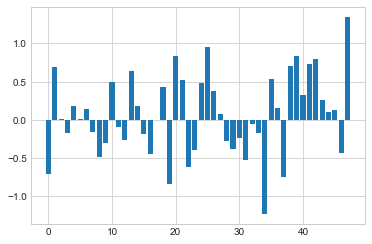

In [106]:
# get importance
importance = model.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()